In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sqlite3
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, RandomizedSearchCV
import joblib
import os
import numpy as np
from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as ImbPipeline
import time
from xgboost import XGBClassifier
from scipy.stats import spearmanr, uniform, randint
import lightgbm as lgb
from catboost import CatBoostClassifier


# =============================================================================
# 1. Data Loading and EDA
# =============================================================================

# Load data function
import pandas as pd
import sqlite3
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder


In [2]:
db_file = 'data/gas_monitoring.db'
# NOTE: The provided code assumes a database file at 'data/gas_monitoring.db'.
# If you are running this in a different environment, you may need to
# modify this path.
if not os.path.exists(db_file):
    print(f"Error: Database file '{db_file}' not found.")
try:
    conn = sqlite3.connect(db_file)
    df = pd.read_sql_query("SELECT * FROM gas_monitoring", conn)
    conn.close()
except sqlite3.OperationalError as e:
    print(f"An error occurred while reading from the database: {e}")

In [3]:
print("Initial Data Overview:")
display(df.head())
display(df.info())
display(df.isnull().sum())
display(df.describe(include='all').T)
display(df.duplicated().sum())
# There are 120 duplicates.
display(df[df.duplicated(keep=False)].sort_values(by=list(df.columns)))

# Drop duplicates
df.drop_duplicates(inplace=True)
print("\nAfter dropping duplicates:")
display(df.head())
display(df.info())
# After dropping duplicated, there are 9880 rows of data, except for those features which have missing datapoints.

Initial Data Overview:


,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level
0,morning,19.63,53.83,125.49,571.09,478.55,735.85,497.59,565.05,medium,7241,off,very_dim,Low Activity
1,morning,19.66,53.69,126.34,575.79,491.96,740.28,NaN,557.08,low,7241,ventilation_only,bright,Low Activity
2,night,20.95,54.12,119.34,556.53,437.50,718.34,NaN,612.62,medium,9385,off,NaN,Low Activity
3,morning,20.10,50.48,113.50,NaN,515.14,744.02,676.15,600.22,low,7241,eco_mode,very_bright,High Activity
4,morning,19.89,48.42,92.77,613.65,535.66,770.27,720.27,625.73,low,7241,Heating_active,moderate,Low Activity


<class 'pandas.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Time of Day                10000 non-null  str    
 1   Temperature                10000 non-null  float64
 2   Humidity                   10000 non-null  float64
 3   CO2_InfraredSensor         10000 non-null  float64
 4   CO2_ElectroChemicalSensor  9294 non-null   float64
 5   MetalOxideSensor_Unit1     10000 non-null  float64
 6   MetalOxideSensor_Unit2     10000 non-null  float64
 7   MetalOxideSensor_Unit3     7434 non-null   float64
 8   MetalOxideSensor_Unit4     10000 non-null  float64
 9   CO_GasSensor               8631 non-null   str    
 10  Session ID                 10000 non-null  int64  
 11  HVAC Operation Mode        10000 non-null  str    
 12  Ambient Light Level        7468 non-null   str    
 13  Activity Level             10000 non-null  str    
dtypes:

None

Time of Day                     0
Temperature                     0
Humidity                        0
CO2_InfraredSensor              0
CO2_ElectroChemicalSensor     706
MetalOxideSensor_Unit1          0
MetalOxideSensor_Unit2          0
MetalOxideSensor_Unit3       2566
MetalOxideSensor_Unit4          0
CO_GasSensor                 1369
Session ID                      0
HVAC Operation Mode             0
Ambient Light Level          2532
Activity Level                  0
dtype: int64

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Time of Day,10000,4,afternoon,2605,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature,10000.0,NaN,NaN,NaN,42.564132,74.350143,14.94,19.0,20.53,23.13,298.93
Humidity,10000.0,NaN,NaN,NaN,51.125461,20.565964,-49.66,47.68,51.3,53.85,199.59
CO2_InfraredSensor,10000.0,NaN,NaN,NaN,110.356504,25.056797,-14.67,99.0775,113.1,124.0225,236.01
CO2_ElectroChemicalSensor,9294.0,NaN,NaN,NaN,578.333884,22.669681,408.6,559.225,578.89,595.18,637.9
MetalOxideSensor_Unit1,10000.0,NaN,NaN,NaN,470.363051,51.353223,286.83,439.63,468.81,493.94,632.89
MetalOxideSensor_Unit2,10000.0,NaN,NaN,NaN,728.265041,43.303414,554.28,707.9575,726.635,746.4925,902.21
MetalOxideSensor_Unit3,7434.0,NaN,NaN,NaN,681.359029,59.994204,457.81,658.2225,680.085,704.405,905.15
MetalOxideSensor_Unit4,10000.0,NaN,NaN,NaN,611.956357,42.855167,412.79,585.555,609.005,635.48,736.11
CO_GasSensor,8631,5,low,4346,NaN,NaN,NaN,NaN,NaN,NaN,NaN


np.int64(120)

,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level
685,afternoon,16.86,46.12,85.16,590.81,436.11,739.87,705.77,634.27,low,2679,cooling_active,bright,Moderate Activity
4066,afternoon,16.86,46.12,85.16,590.81,436.11,739.87,705.77,634.27,low,2679,cooling_active,bright,Moderate Activity
1827,afternoon,17.33,47.63,82.59,613.07,438.34,757.98,725.52,649.64,extremely low,3418,cooling_active,very_bright,Moderate Activity
3487,afternoon,17.33,47.63,82.59,613.07,438.34,757.98,725.52,649.64,extremely low,3418,cooling_active,very_bright,Moderate Activity
1770,afternoon,18.12,48.85,93.17,612.03,489.97,761.61,NaN,655.67,extremely low,2105,off,very_bright,Low Activity
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6782,night,22.17,54.21,131.98,557.41,415.71,688.52,626.33,569.10,NaN,1903,ventilation_only,bright,Low Activity
6510,night,22.82,53.12,113.88,546.94,470.60,691.31,628.75,564.82,low,6817,cooling_active,very_bright,Low Activity
9083,night,22.82,53.12,113.88,546.94,470.60,691.31,628.75,564.82,low,6817,cooling_active,very_bright,Low Activity
5490,night,23.09,49.40,114.69,572.40,385.17,680.60,NaN,555.23,high,7395,cooling_active,bright,Low Activity



After dropping duplicates:


,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level
0,morning,19.63,53.83,125.49,571.09,478.55,735.85,497.59,565.05,medium,7241,off,very_dim,Low Activity
1,morning,19.66,53.69,126.34,575.79,491.96,740.28,NaN,557.08,low,7241,ventilation_only,bright,Low Activity
2,night,20.95,54.12,119.34,556.53,437.50,718.34,NaN,612.62,medium,9385,off,NaN,Low Activity
3,morning,20.10,50.48,113.50,NaN,515.14,744.02,676.15,600.22,low,7241,eco_mode,very_bright,High Activity
4,morning,19.89,48.42,92.77,613.65,535.66,770.27,720.27,625.73,low,7241,Heating_active,moderate,Low Activity


<class 'pandas.DataFrame'>
Index: 9880 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Time of Day                9880 non-null   str    
 1   Temperature                9880 non-null   float64
 2   Humidity                   9880 non-null   float64
 3   CO2_InfraredSensor         9880 non-null   float64
 4   CO2_ElectroChemicalSensor  9175 non-null   float64
 5   MetalOxideSensor_Unit1     9880 non-null   float64
 6   MetalOxideSensor_Unit2     9880 non-null   float64
 7   MetalOxideSensor_Unit3     7326 non-null   float64
 8   MetalOxideSensor_Unit4     9880 non-null   float64
 9   CO_GasSensor               8515 non-null   str    
 10  Session ID                 9880 non-null   int64  
 11  HVAC Operation Mode        9880 non-null   str    
 12  Ambient Light Level        7361 non-null   str    
 13  Activity Level             9880 non-null   str    
dtypes: float

None


Activity Level Value Counts (Mapped):


Activity Level
Low Activity         5722
Moderate Activity    3082
High Activity        1076
Name: count, dtype: int64

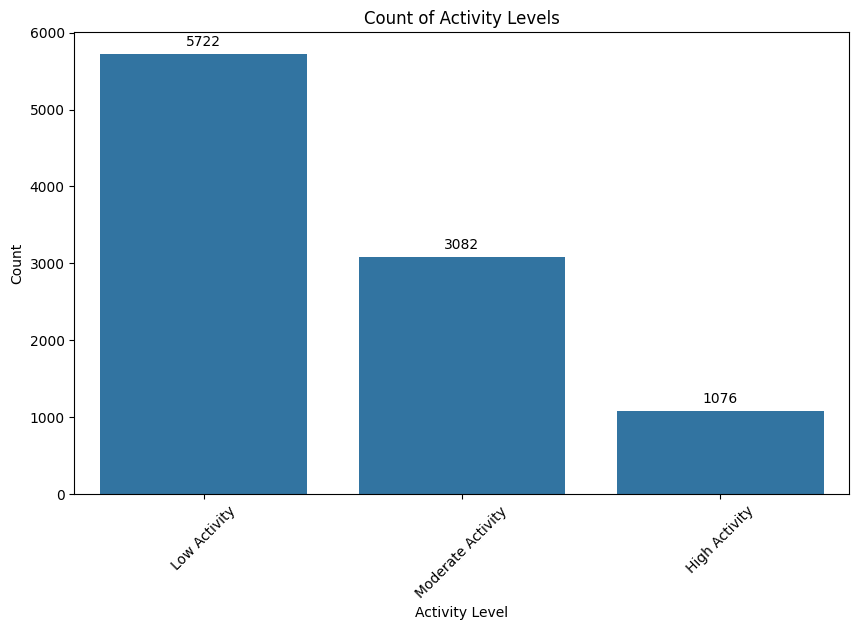

In [4]:
# --- Data Cleaning and Correction ---
    
mode_Activity_Level_mapping = {
    'Low Activity': 'Low Activity',
    'High Activity': 'High Activity',
    'Moderate Activity': 'Moderate Activity',
    'ModerateActivity': 'Moderate Activity',
    'Low_Activity': 'Low Activity',
    'LowActivity': 'Low Activity'
}
df['Activity Level'] = df['Activity Level'].map(mode_Activity_Level_mapping).fillna('Low Activity') # Fill any remaining NaNs with 'Low Activity'
# Define the desired order for 'Activity Level'
Activity_Level_order = ['Low Activity', 'Moderate Activity', 'High Activity']
# Convert 'Activity Level' to a categorical type with the specified order
df['Activity Level'] = pd.Categorical(df['Activity Level'], categories=Activity_Level_order, ordered=True)
print("\nActivity Level Value Counts (Mapped):")
display(df['Activity Level'].value_counts())
# Bar chart for "Activity Level" with annotations
plt.figure(figsize=(10, 6))
count_plot = sns.countplot(x='Activity Level', data=df)
plt.title('Count of Activity Levels')
plt.xlabel('Activity Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
# Annotate the bars with the frequency count
for p in count_plot.patches:
    count_plot.annotate(format(p.get_height(), '.0f'), # pyright: ignore[reportAttributeAccessIssue]
                        (p.get_x() + p.get_width() / 2., p.get_height()), # pyright: ignore[reportAttributeAccessIssue]
                        ha = 'center', va = 'center',
                        xytext = (0, 9),
                        textcoords = 'offset points')
plt.show()
# The graph shows that in terms of counts of "Activity Level", there are 5722 'Low Activity', 3082 "Moderate Activity", and 1088 "High Activity". It is a moderately imbalanced dataset. 

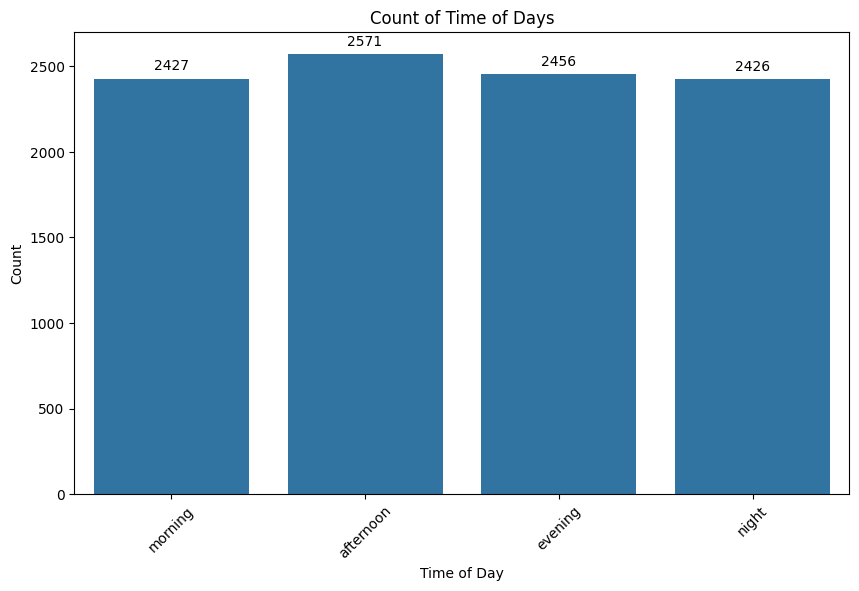

In [5]:
# Handle missing and empty values in 'Time of Day' before conversion
df['Time of Day'] = df['Time of Day'].replace('', 'unknown')

# Define the desired order for 'Time of Day'
time_of_day_order = ['morning', 'afternoon', 'evening', 'night']
# Convert 'Time of Day' to a categorical type with the specified order
df['Time of Day'] = pd.Categorical(df['Time of Day'], categories=time_of_day_order, ordered=True)

# Bar chart for "Time of Day" with annotations
plt.figure(figsize=(10, 6))
count_plot = sns.countplot(x='Time of Day', data=df)
plt.title('Count of Time of Days')
plt.xlabel('Time of Day')
plt.ylabel('Count')
plt.xticks(rotation=45)
# Annotate the bars with the frequency count
for p in count_plot.patches:
    count_plot.annotate(format(p.get_height(), '.0f'), # pyright: ignore[reportAttributeAccessIssue]
                        (p.get_x() + p.get_width() / 2., p.get_height()), # pyright: ignore[reportAttributeAccessIssue]
                        ha = 'center', va = 'center',
                        xytext = (0, 9),
                        textcoords = 'offset points')
plt.show()
# The graph shows that the datapoints are spread out quite equally amongst the various "Time of Day"s.


Time of Day vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Time of Day,,,
morning,1178,971,278
afternoon,1315,974,282
evening,1749,497,210
night,1480,640,306


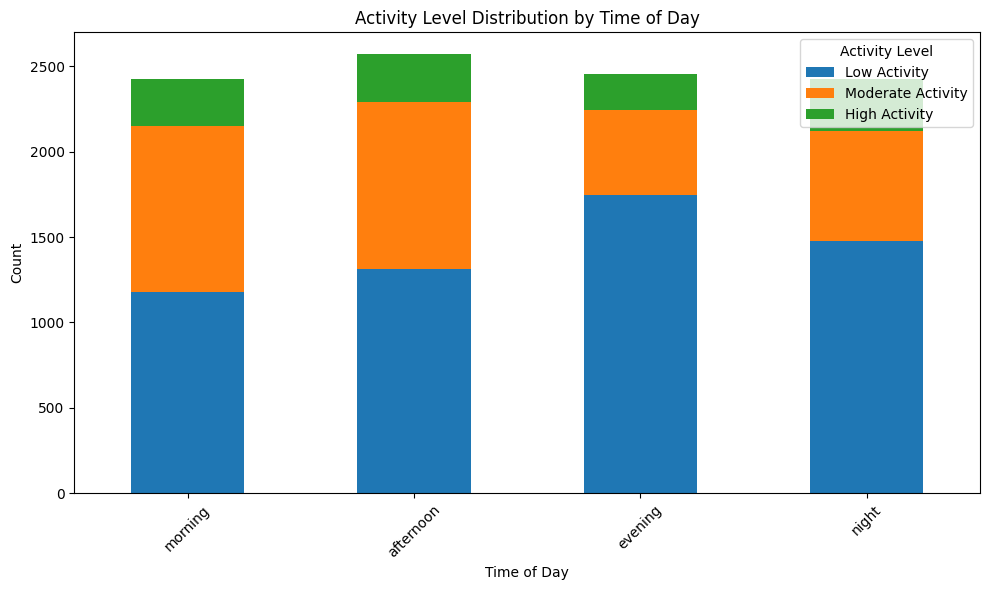


Time of Day Value Counts:


Time of Day
afternoon    2571
evening      2456
morning      2427
night        2426
Name: count, dtype: int64


Spearman Correlation between Activity Level and Time of Day:
Spearman Correlation Coefficient: -0.1124
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As time_of_day increases, activity level tends to slightly decrease.


In [6]:
# Time of Day analysis against Activity Level
print("\nTime of Day vs Activity Level:")
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['Time of Day'], df['Activity Level'])
display(crosstab_df)

# Plot the crosstab as a stacked bar chart
crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Activity Level Distribution by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Activity Level')
plt.tight_layout()
plt.show()
# The graph shows for "evening" and "night", there is interestingly a lower proport of "Moderate Activity"

# Time of Day imputation
print("\nTime of Day Value Counts:")
display(df['Time of Day'].value_counts())

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and Time of Day:")
# Create copies to avoid SettingWithCopyWarning
time_of_day_ranks = df['Time of Day'].copy().map({'morning': 0, 'afternoon': 1, 'evening': 2, 'night': 3})
activity_level_ranks = df['Activity Level'].copy().map({'Low Activity': 0, 'Moderate Activity': 1, 'High Activity': 2})

# Drop rows with NaN values in the ranks before correlation calculation
time_of_day_correlation_df = pd.DataFrame({'time_of_day_ranks': time_of_day_ranks, 'activity_level_ranks': activity_level_ranks}).dropna()

spearman_corr_0, p_value_0 = spearmanr(time_of_day_correlation_df['activity_level_ranks'], time_of_day_correlation_df['time_of_day_ranks'])

print(f"Spearman Correlation Coefficient: {spearman_corr_0:.4f}")
print(f"P-value: {p_value_0:.4f}")

if p_value_0 < 0.05: # pyright: ignore[reportOperatorIssue]
    print("\nThe correlation is statistically significant.")
    if spearman_corr_0 > 0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak positive monotonic correlation. As time_of_day increases, activity level tends to slightly increase.")
    elif spearman_corr_0 < -0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak negative monotonic correlation. As time_of_day increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")
# Spearman shows that there is a statiscally significant correlation between "Time of Day" and "Acivity Level", and there is weak negative monotonic correlation. As time_of_day increases, activity level tends to slightly 
# decrease.

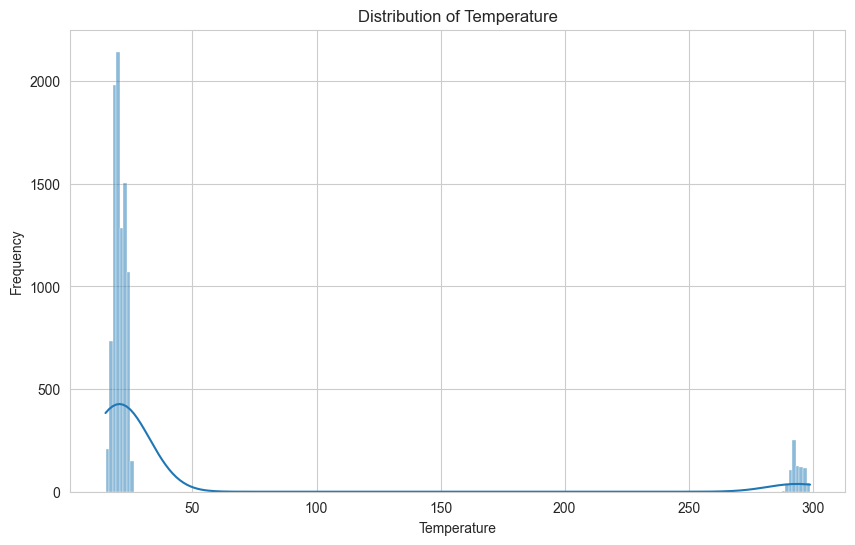

Number of datapoints where Temperature exceeds 28: 804

Temperature Distribution (Corrected):


count    9880.000000
mean       20.571510
std         2.286841
min        14.940000
25%        18.890000
50%        20.200000
75%        22.530000
max        25.990000
Name: Temperature, dtype: float64

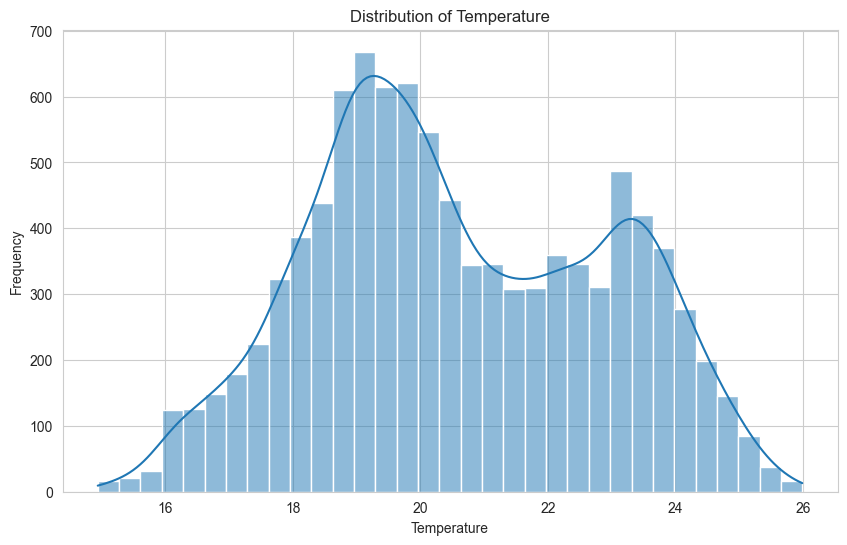


Activity Level analysis against Temperature Bands:


Temperature_Band,14-16,16-18,18-20,20-22,22-24,24-26
Activity Level,,,,,,
Low Activity,30,408,1534,1466,1693,591
Moderate Activity,60,627,1345,525,417,108
High Activity,0,115,483,259,177,42


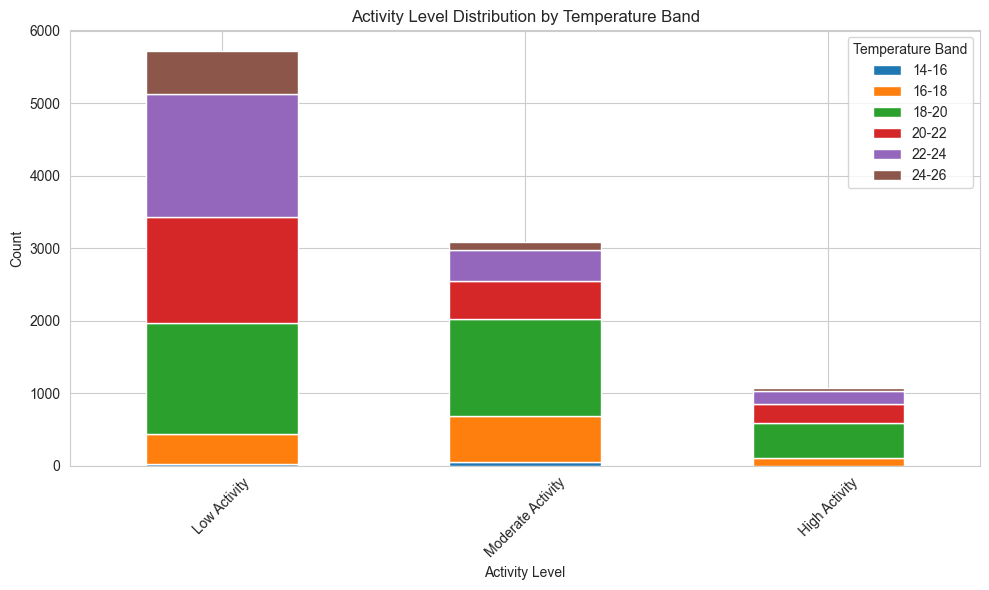


Spearman Correlation between Activity Level and Temperature Band:
Spearman Correlation Coefficient: -0.2763
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As temperature increases, activity level tends to slightly decrease.


In [7]:
# Temperature analysis and correction (convert Kelvin to Celsius)
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(df['Temperature'], kde=True) # type: ignore
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.show()
# Count the datapoints where Temperature exceeds 28
temperature_exceed = df[df['Temperature'] > 28].shape[0]
print(f"Number of datapoints where Temperature exceeds 28: {temperature_exceed}")

# Suspected those impossible temperatures > 288 are in Kelvin (not converted to Celsius by error) - Convert Kelvin to Celsius for anomalies
anomaly_mask = df['Temperature'] >= 288
df.loc[anomaly_mask, 'Temperature'] = df.loc[anomaly_mask, 'Temperature'] - 273.15
print("\nTemperature Distribution (Corrected):")
display(df['Temperature'].describe())
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(df['Temperature'], kde=True) # type: ignore
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.show()
# Shows a more normal distribution. 

# Activity Level analysis against Temperature Bands
print("\nActivity Level analysis against Temperature Bands:")
# Define temperature bins and labels for analysis
temperature_bins = [14, 16, 18, 20, 22, 24, 26]
temperature_labels = ['14-16', '16-18', '18-20', '20-22', '22-24', '24-26']
# Create a new categorical series for temperature bands
df['Temperature_Band'] = pd.cut(df['Temperature'], bins=temperature_bins, labels=temperature_labels, right=True)
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['Activity Level'], df['Temperature_Band'])
display(crosstab_df)
    
# Plot the crosstab as a stacked bar chart
crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Activity Level Distribution by Temperature Band')
plt.xlabel('Activity Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Temperature Band')
plt.tight_layout()
plt.show()
# Graph shows that the temperature bands do not distribute equally across all activity levels. 

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and Temperature Band:")
# Create copies to avoid SettingWithCopyWarning
temp_band_ranks = df['Temperature_Band'].cat.codes.copy()
    
# Drop rows with NaN values in the ranks before correlation calculation
temp_band_correlation_df = pd.DataFrame({'temp_band_ranks': temp_band_ranks, 'activity_level_ranks': activity_level_ranks}).dropna()

spearman_corr_1, p_value_1 = spearmanr(temp_band_correlation_df['activity_level_ranks'], temp_band_correlation_df['temp_band_ranks'])

print(f"Spearman Correlation Coefficient: {spearman_corr_1:.4f}")
print(f"P-value: {p_value_1:.4f}")

if p_value_1 < 0.05: # pyright: ignore[reportOperatorIssue]
    print("\nThe correlation is statistically significant.")
    if spearman_corr_1 > 0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak positive monotonic correlation. As temperature increases, activity level tends to slightly increase.")
    elif spearman_corr_1 < -0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak negative monotonic correlation. As temperature increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")
# Spearman shows that that there a statistically significant correlation between Temperature Band and Activity Level. There is a weak negative monotonic correlation. As temperature increases, activity level tends to 
# slightly decrease.

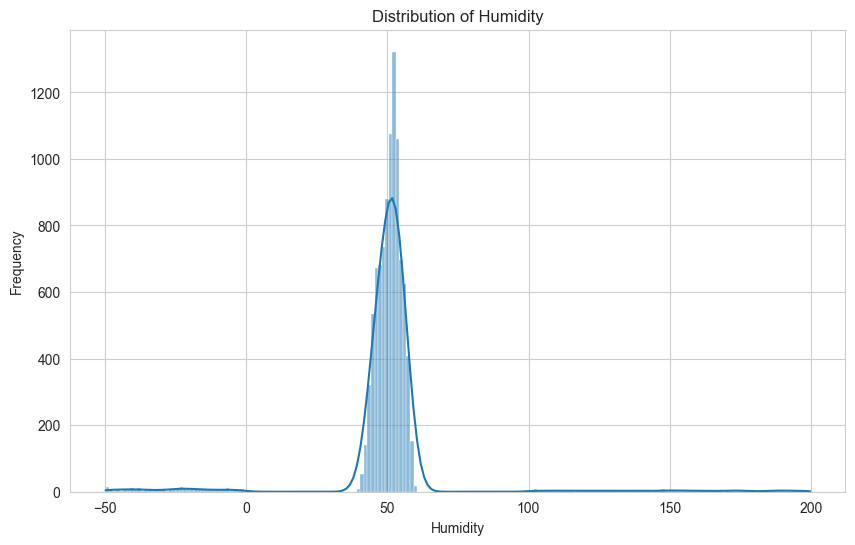

Number of datapoints where Humidity is strange (>100%, negative, or <40%): 776

Humidity Distribution (Corrected):


count    9880.000000
mean       50.393735
std         5.140030
min        31.011400
25%        47.500000
50%        51.130000
75%        53.670000
max        69.970000
Name: Humidity, dtype: float64

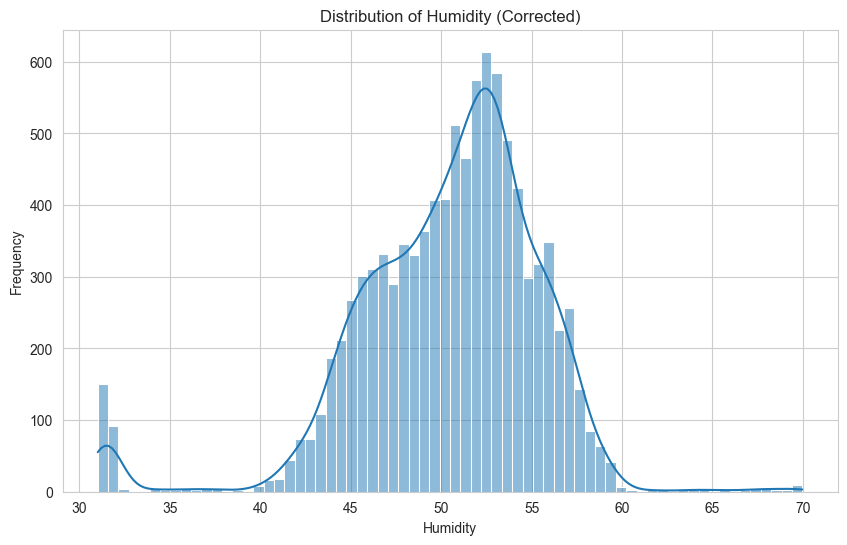


Creating the new interaction feature: 'Temperature_x_Humidity'...
New feature created. First 5 values:
 0    1056.6829
1    1055.5454
2    1133.8140
3    1014.6480
4     963.0738
Name: Temperature_x_Humidity, dtype: float64

Analyzing the new 'Temperature_x_Humidity' feature:


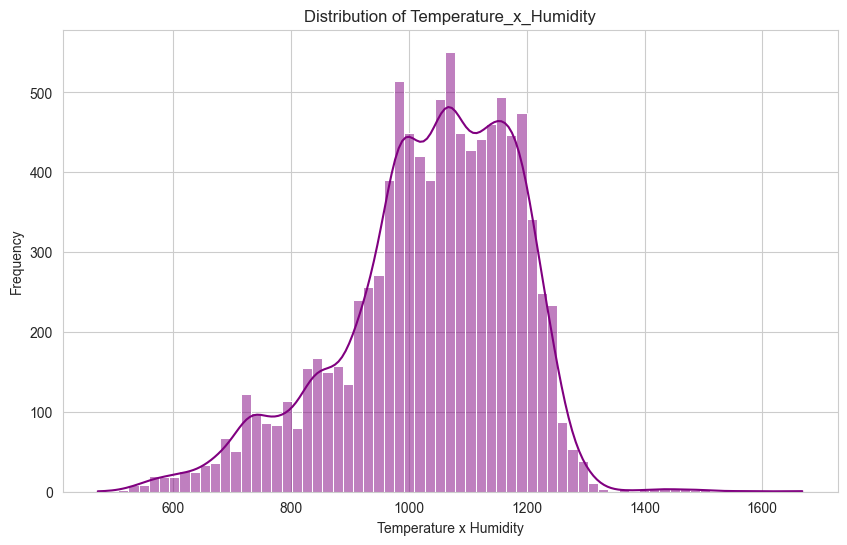

Spearman Correlation between 'Temperature_x_Humidity' and 'Activity_Level':
Correlation Coefficient: -0.3423
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Temperature_x_Humidity increases, activity level tends to slightly decrease.


In [8]:
# Humidity analysis and correction
plt.figure(figsize=(10, 6))
sns.histplot(df['Humidity'], kde=True) # type: ignore
plt.title('Distribution of Humidity')
plt.xlabel('Humidity')
plt.ylabel('Frequency')
plt.show()
# There are strange datapoints of Humidity being negative and more than 100%, which are impossible. Also, there are datapoints where Humidity is less than 40% (quite unlikely).
# Thus, these are engineered back to normalcy. 
humidity_strange = df[df['Humidity'] < 40].shape[0] + df[df['Humidity'] < 0].shape[0] + df[df['Humidity'] >= 100].shape[0]
print(f"Number of datapoints where Humidity is strange (>100%, negative, or <40%): {humidity_strange}")
df.loc[df['Humidity'] < 0, 'Humidity'] = df.loc[df['Humidity'] < 0, 'Humidity'].abs()
df.loc[df['Humidity'] >= 100, 'Humidity'] = df.loc[df['Humidity'] >= 100, 'Humidity'] / 100
df.loc[df['Humidity'] < 40, 'Humidity'] = df.loc[df['Humidity'] < 40, 'Humidity'] + 30
df.loc[df['Humidity'] > 100, 'Humidity'] = 100 # Cap at 100
print("\nHumidity Distribution (Corrected):")
display(df['Humidity'].describe())
plt.figure(figsize=(10, 6))
sns.histplot(df['Humidity'], kde=True) # type: ignore
plt.title('Distribution of Humidity (Corrected)')
plt.xlabel('Humidity')
plt.ylabel('Frequency')
plt.show()
# Graph shows a more normal distribution. 

# Temperature x Humidity feature is created to show a more interactive feature for the environmental conditions.
# --- Feature Engineering: Create the new interaction feature ---
print("\nCreating the new interaction feature: 'Temperature_x_Humidity'...")
df['Temperature_x_Humidity'] = df['Temperature'] * df['Humidity']
print("New feature created. First 5 values:\n", df['Temperature_x_Humidity'].head())

# --- EDA for the new feature ---
print("\nAnalyzing the new 'Temperature_x_Humidity' feature:")
plt.figure(figsize=(10, 6))
sns.histplot(df['Temperature_x_Humidity'], kde=True, color='purple') # type: ignore
plt.title('Distribution of Temperature_x_Humidity')
plt.xlabel('Temperature x Humidity')
plt.ylabel('Frequency')
plt.show()

# Calculate Spearman correlation with the target variable for the new feature
# Drop rows with NaNs in either variable for the correlation calculation
temp_hum_corr_df = pd.DataFrame({'th_interaction_feature': df['Temperature_x_Humidity'], 'activity_level': activity_level_ranks}).dropna()
if not temp_hum_corr_df.empty:
    spearman_corr_2, p_value_2 = spearmanr(temp_hum_corr_df['th_interaction_feature'], temp_hum_corr_df['activity_level'])
    print(f"Spearman Correlation between 'Temperature_x_Humidity' and 'Activity_Level':")
    print(f"Correlation Coefficient: {spearman_corr_2:.4f}")
    print(f"P-value: {p_value_2:.4f}")
else:
    print("Could not compute Spearman correlation for 'Temperature_x_Humidity' due to missing data.")
if p_value_2 < 0.05: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
        print("\nThe correlation is statistically significant.")
        if spearman_corr_2 > 0.1: # pyright: ignore[reportPossiblyUnboundVariable, reportOperatorIssue]
            print("Interpretation: There is a weak positive monotonic correlation. As Temperature_x_Humidity increases, activity level tends to slightly increase.")
        elif spearman_corr_2 < -0.1: # pyright: ignore[reportPossiblyUnboundVariable, reportOperatorIssue]
            print("Interpretation: There is a weak negative monotonic correlation. As Temperature_x_Humidity increases, activity level tends to slightly decrease.")
        else:
            print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
        print("\nThe correlation is not statistically significant (p-value >= 0.05).")
# Spearman shows that that there a statistically significant correlation between Temperature_x_Humidity and Activity Level. There is a weak negative monotonic correlation. As temperature increases, activity level tends to 
# slightly decrease. Spearman_corr_coeff = -0.3423. 

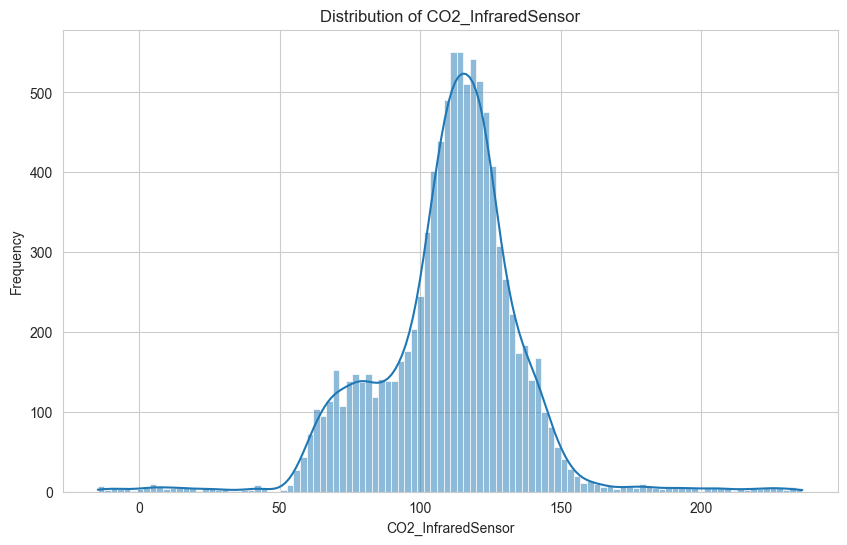


CO2_InfraredSensor Distribution (Corrected):


count    9880.000000
mean      560.334979
std        25.129207
min       435.330000
25%       549.030000
50%       563.060000
75%       574.022500
max       686.010000
Name: CO2_InfraredSensor, dtype: float64

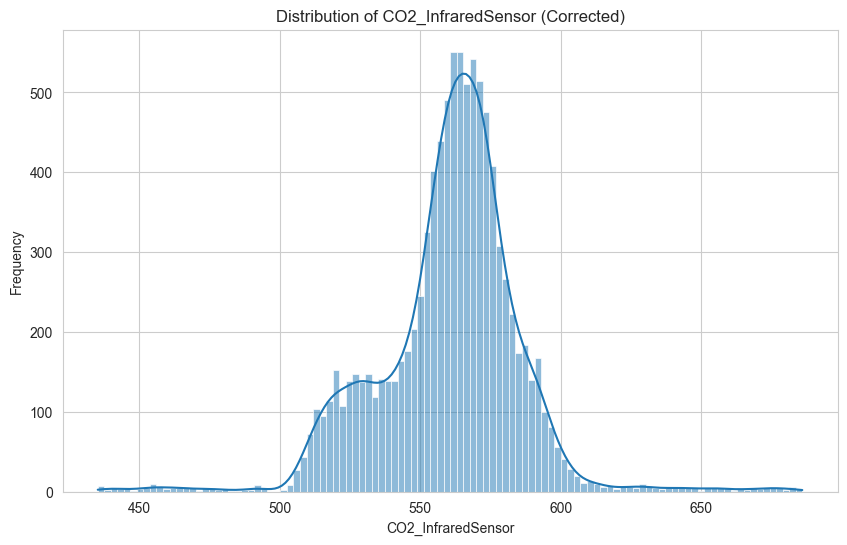

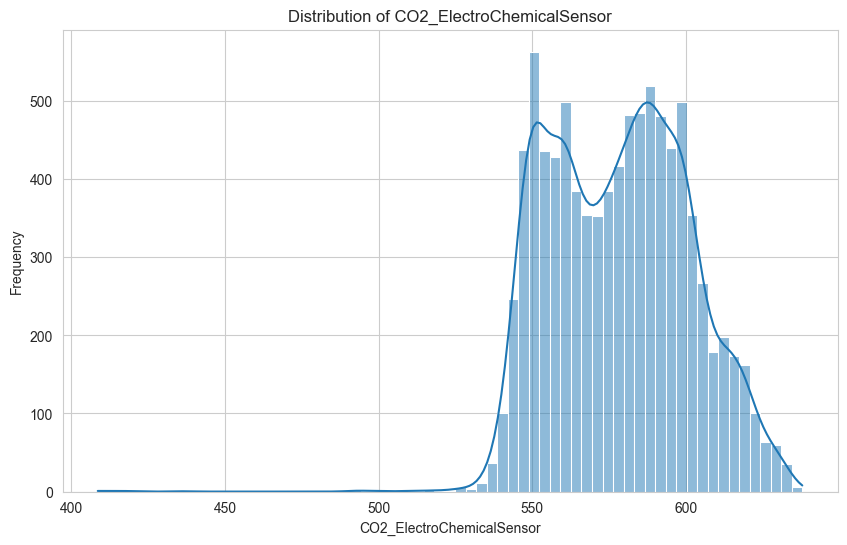


CO2_ElectroChemicalSensor Distribution (Imputed):


count    9880.000000
mean      578.408069
std        21.845750
min       408.600000
25%       560.400000
50%       578.930000
75%       593.800000
max       637.900000
Name: CO2_ElectroChemicalSensor, dtype: float64

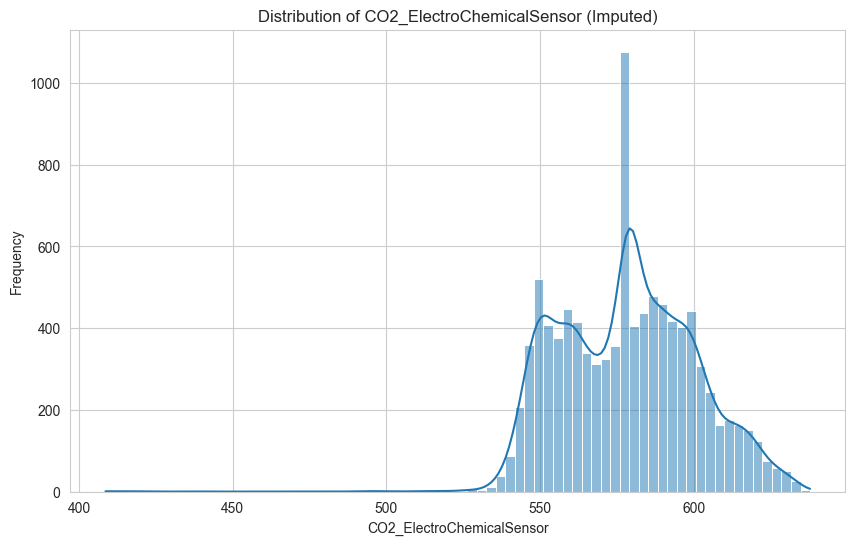


Creating the new interaction feature: 'CO2_InfraredSensor'+'CO2_ElectroChemicalSensor'...
New feature created. First 5 values:
 0    1146.58
1    1152.13
2    1125.87
3    1142.43
4    1156.42
Name: CO2_sum, dtype: float64

Analyzing the new 'CO2_InfraredSensor+CO2_ElectroChemicalSensor' feature:


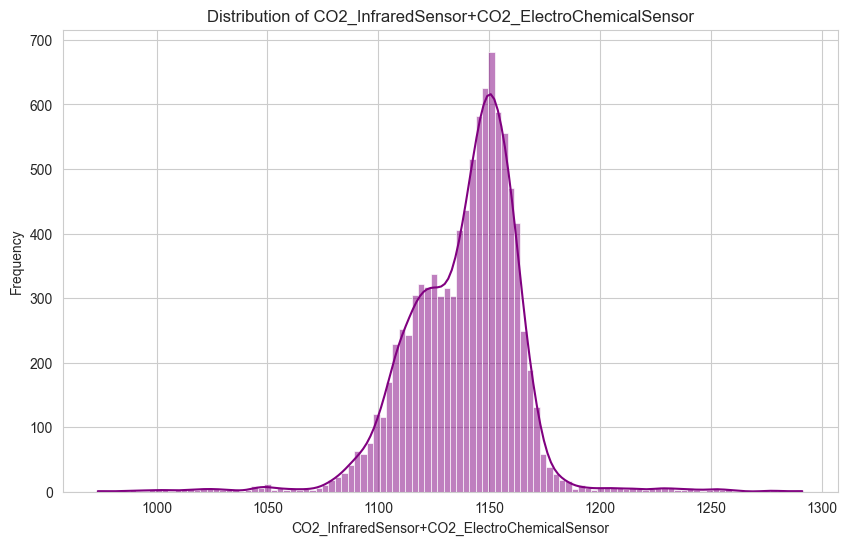

Spearman Correlation between 'CO2_InfraredSensor+CO2_ElectroChemicalSensor' and 'Activity_Level':
Correlation Coefficient: 0.0683
P-value: 0.0000

The correlation is statistically significant.
Interpretation: The correlation is very weak. The relationship between the two variables is not strong.


In [9]:
# CO2_InfraredSensor correction
plt.figure(figsize=(10, 6))
sns.histplot(df['CO2_InfraredSensor'], kde=True) # type: ignore
plt.title('Distribution of CO2_InfraredSensor')
plt.xlabel('CO2_InfraredSensor')
plt.ylabel('Frequency')
plt.show()
#Typical CO2 in Indoor environments are in the range of 350~1000 ppm. Also, the readings in CO2_ElectroChemicalSensor have their median at 563 ppm; this suggests the readings here are off by 450 ppm -> Apply 450 ppm offset.
df['CO2_InfraredSensor'] = df['CO2_InfraredSensor'] + 450
print("\nCO2_InfraredSensor Distribution (Corrected):")
display(df['CO2_InfraredSensor'].describe())
plt.figure(figsize=(10, 6))
sns.histplot(df['CO2_InfraredSensor'], kde=True) # type: ignore
plt.title('Distribution of CO2_InfraredSensor (Corrected)')
plt.xlabel('CO2_InfraredSensor')
plt.ylabel('Frequency')
plt.show()
# Graph shows a more normal distribution. 

# There are 805 NaN values in CO2_ElectroChemicalSensor.
# CO2_ElectroChemicalSensor imputation (Median)
plt.figure(figsize=(10, 6))
sns.histplot(df['CO2_ElectroChemicalSensor'], kde=True) # type: ignore
plt.title('Distribution of CO2_ElectroChemicalSensor')
plt.xlabel('CO2_ElectroChemicalSensor')
plt.ylabel('Frequency')
plt.show()
median_value = df['CO2_ElectroChemicalSensor'].median()
df['CO2_ElectroChemicalSensor'] = df['CO2_ElectroChemicalSensor'].fillna(median_value)
print("\nCO2_ElectroChemicalSensor Distribution (Imputed):")
display(df['CO2_ElectroChemicalSensor'].describe())
plt.figure(figsize=(10, 6))
sns.histplot(df['CO2_ElectroChemicalSensor'], kde=True) # type: ignore
plt.title('Distribution of CO2_ElectroChemicalSensor (Imputed)')
plt.xlabel('CO2_ElectroChemicalSensor')
plt.ylabel('Frequency')
plt.show()

# Create a new summative feature with the two CO2 sensors. 
# --- Feature Engineering: Create the new interaction feature ---
print("\nCreating the new interaction feature: 'CO2_InfraredSensor'+'CO2_ElectroChemicalSensor'...")
df['CO2_sum'] = df['CO2_InfraredSensor'] + df['CO2_ElectroChemicalSensor']
print("New feature created. First 5 values:\n", df['CO2_sum'].head())

# --- EDA for the new feature ---
print("\nAnalyzing the new 'CO2_InfraredSensor+CO2_ElectroChemicalSensor' feature:")
plt.figure(figsize=(10, 6))
sns.histplot(df['CO2_sum'], kde=True, color='purple') # type: ignore
plt.title('Distribution of CO2_InfraredSensor+CO2_ElectroChemicalSensor')
plt.xlabel('CO2_InfraredSensor+CO2_ElectroChemicalSensor')
plt.ylabel('Frequency')
plt.show()

# Calculate Spearman correlation with the target variable for the new feature
# Drop rows with NaNs in either variable for the correlation calculation
CO2_sum_corr_df = pd.DataFrame({'CO2_sum_interaction_feature': df['CO2_sum'], 'activity_level': activity_level_ranks}).dropna()
if not CO2_sum_corr_df.empty:
    spearman_corr_3, p_value_3 = spearmanr(CO2_sum_corr_df['CO2_sum_interaction_feature'], CO2_sum_corr_df['activity_level'])
    print(f"Spearman Correlation between 'CO2_InfraredSensor+CO2_ElectroChemicalSensor' and 'Activity_Level':")
    print(f"Correlation Coefficient: {spearman_corr_3:.4f}")
    print(f"P-value: {p_value_3:.4f}")
else:
    print("Could not compute Spearman correlation for 'CO2_InfraredSensor+CO2_ElectroChemicalSensor' due to missing data.")
if p_value_3 < 0.05: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
        print("\nThe correlation is statistically significant.")
        if spearman_corr_3 > 0.1: # pyright: ignore[reportPossiblyUnboundVariable, reportOperatorIssue]
            print("Interpretation: There is a weak positive monotonic correlation. As CO2_sum increases, activity level tends to slightly increase.")
        elif spearman_corr_3 < -0.1: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
            print("Interpretation: There is a weak negative monotonic correlation. As CO2_sum increases, activity level tends to slightly decrease.")
        else:
            print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
        print("\nThe correlation is not statistically significant (p-value >= 0.05).")
# Spearman shows that that there a statistically significant correlation between CO2_sum and Activity Level. There is a very weak positive monotonic correlation. 

count    9880.000000
mean      470.449518
std        51.384743
min       286.830000
25%       439.722500
50%       468.840000
75%       493.980000
max       632.890000
Name: MetalOxideSensor_Unit1, dtype: float64


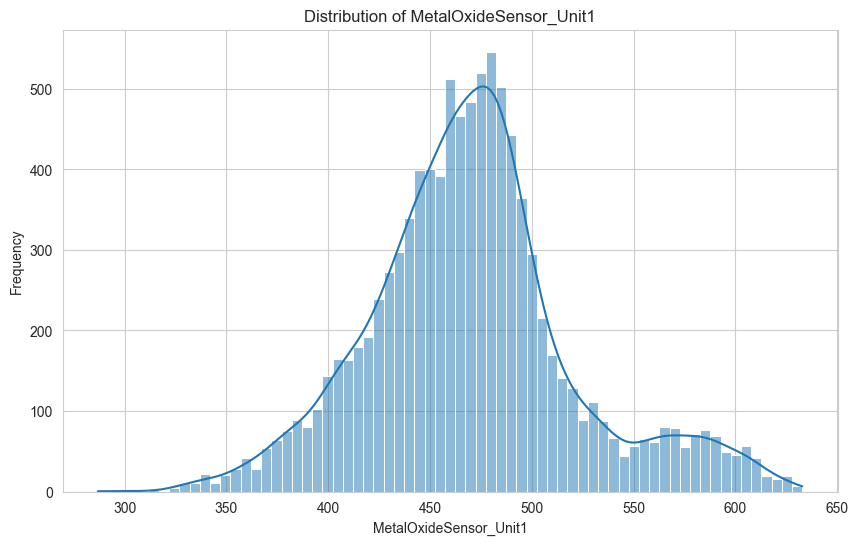

count    9880.000000
mean      728.327546
std        43.452912
min       554.280000
25%       707.967500
50%       726.710000
75%       746.572500
max       902.210000
Name: MetalOxideSensor_Unit2, dtype: float64


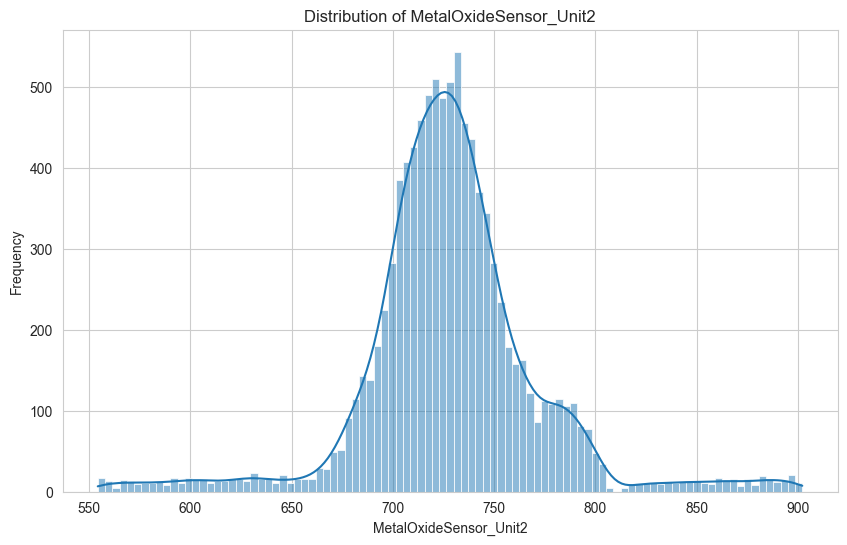

count    7326.000000
mean      681.471289
std        60.242382
min       457.810000
25%       658.400000
50%       680.190000
75%       704.495000
max       905.150000
Name: MetalOxideSensor_Unit3, dtype: float64
Imputed Statistics for MetalOxideSensor_Unit3:
count    9880.000000
mean      681.587164
std        55.703093
min       457.810000
25%       658.216000
50%       680.510000
75%       705.021500
max       905.150000
Name: MetalOxideSensor_Unit3, dtype: float64


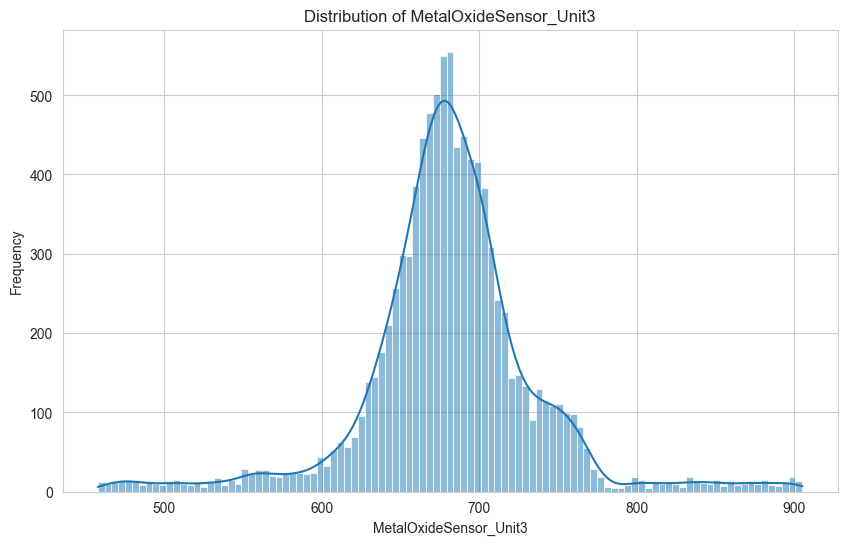

count    9880.00000
mean      612.05048
std        42.87548
min       412.79000
25%       585.63500
50%       609.13000
75%       635.57000
max       736.11000
Name: MetalOxideSensor_Unit4, dtype: float64


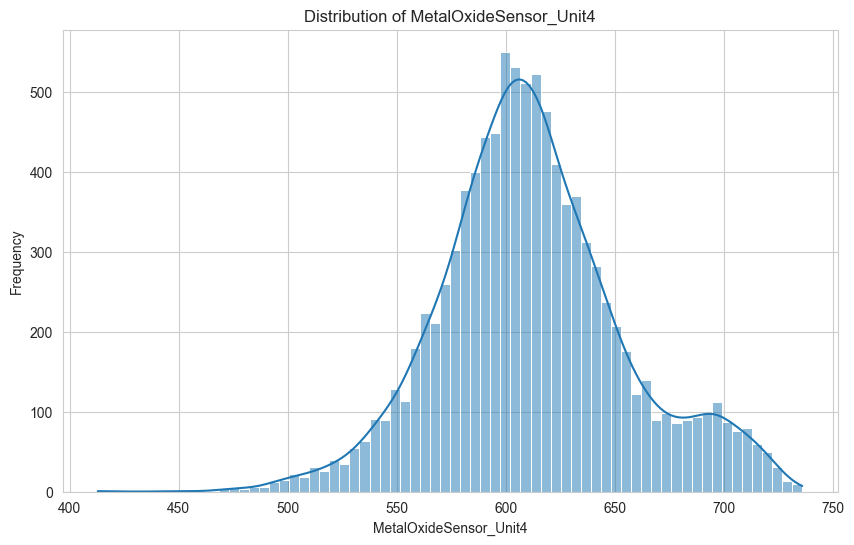


Creating the new interaction feature: MetalOxideSensor_Unit1+MetalOxideSensor_Unit2+MetalOxideSensor_Unit3+MetalOxideSensor_Unit4
New feature created. First 5 values:
 0    2277.040
1    2421.784
2    2443.608
3    2535.530
4    2651.930
Name: MetalOxideSensor_sum, dtype: float64

Analyzing the new MetalOxideSensor_sum:


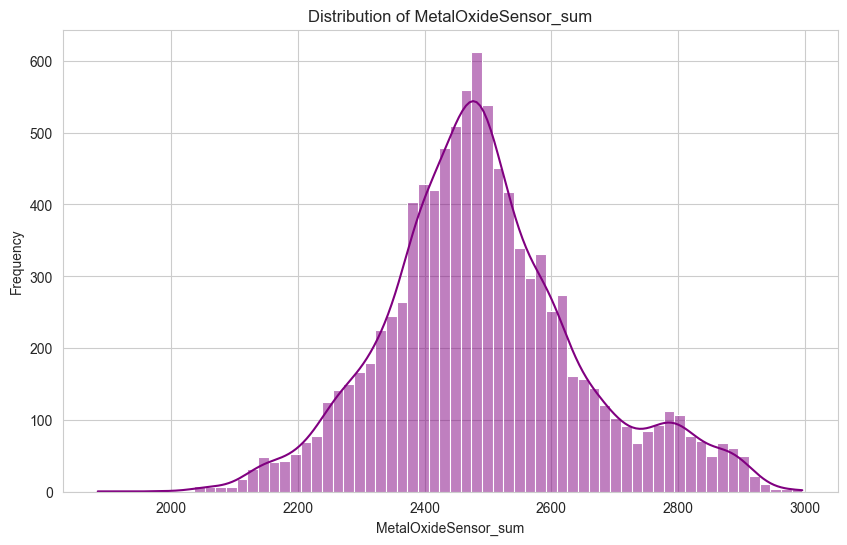

Spearman Correlation between 'MetalOxideSensor_sum' and 'Activity_Level':
Correlation Coefficient: 0.3683
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_sum increases, activity level tends to slightly increase.


In [10]:
# MetalOxideSensor_Unit1
print(df['MetalOxideSensor_Unit1'].describe())
# Set the aesthetic style of the plots
sns.set_style("whitegrid")
# Histogram for MetalOxideSensor_Unit1
plt.figure(figsize=(10, 6))
sns.histplot(df['MetalOxideSensor_Unit1'], kde=True) # type: ignore
plt.title('Distribution of MetalOxideSensor_Unit1')
plt.xlabel('MetalOxideSensor_Unit1')
plt.ylabel('Frequency')
plt.show()

# MetalOxideSensor_Unit2
print(df['MetalOxideSensor_Unit2'].describe())
# Set the aesthetic style of the plots
sns.set_style("whitegrid")
# Histogram for MetalOxideSensor_Unit2
plt.figure(figsize=(10, 6))
sns.histplot(df['MetalOxideSensor_Unit2'], kde=True) # type: ignore
plt.title('Distribution of MetalOxideSensor_Unit2')
plt.xlabel('MetalOxideSensor_Unit2')
plt.ylabel('Frequency')
plt.show()

# MetalOxideSensor_Unit3
print(df['MetalOxideSensor_Unit3'].describe())
# There are 2566 datapoints in MetalOxideSensor_Unit3 that are NaN. I would KNN impute the NaN values with the other metal oxide sensor units, because from the shapes of their graphs it is likely they are highly correlated.
# MetalOxideSensor_Unit3 imputation (KNN)
impute_cols = ['MetalOxideSensor_Unit1', 'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3', 'MetalOxideSensor_Unit4']
imputer = KNNImputer(n_neighbors=5)
df[impute_cols] = imputer.fit_transform(df[impute_cols])
# Validate the imputation
print("Imputed Statistics for MetalOxideSensor_Unit3:")
print(df['MetalOxideSensor_Unit3'].describe())
# Set the aesthetic style of the plots
sns.set_style("whitegrid")
# Histogram for MetalOxideSensor_Unit3
plt.figure(figsize=(10, 6))
sns.histplot(df['MetalOxideSensor_Unit3'], kde=True) # type: ignore
plt.title('Distribution of MetalOxideSensor_Unit3')
plt.xlabel('MetalOxideSensor_Unit3')
plt.ylabel('Frequency')
plt.show()

# MetalOxideSensor_Unit4
print(df['MetalOxideSensor_Unit4'].describe())
# Set the aesthetic style of the plots
sns.set_style("whitegrid")
# Histogram for MetalOxideSensor_Unit4
plt.figure(figsize=(10, 6))
sns.histplot(df['MetalOxideSensor_Unit4'], kde=True) # type: ignore
plt.title('Distribution of MetalOxideSensor_Unit4')
plt.xlabel('MetalOxideSensor_Unit4')
plt.ylabel('Frequency')
plt.show()

# Create a summative feature that encompasses all 4 MetalOxideSensors. 
# --- Feature Engineering: Create the new interaction feature ---
print("\nCreating the new interaction feature: MetalOxideSensor_Unit1+MetalOxideSensor_Unit2+MetalOxideSensor_Unit3+MetalOxideSensor_Unit4")
df['MetalOxideSensor_sum'] = df['MetalOxideSensor_Unit1'] + df['MetalOxideSensor_Unit2'] + df['MetalOxideSensor_Unit3'] + df['MetalOxideSensor_Unit4']
print("New feature created. First 5 values:\n", df['MetalOxideSensor_sum'].head())

# --- EDA for the new feature ---
print("\nAnalyzing the new MetalOxideSensor_sum:")
plt.figure(figsize=(10, 6))
sns.histplot(df['MetalOxideSensor_sum'], kde=True, color='purple') # type: ignore
plt.title('Distribution of MetalOxideSensor_sum')
plt.xlabel('MetalOxideSensor_sum')
plt.ylabel('Frequency')
plt.show()

# Calculate Spearman correlation with the target variable for the new feature
# Drop rows with NaNs in either variable for the correlation calculation
MetalOxideSensor_sum_corr_df = pd.DataFrame({'MetalOxideSensor_sum': df['MetalOxideSensor_sum'], 'activity_level': activity_level_ranks}).dropna()
if not MetalOxideSensor_sum_corr_df.empty:
    spearman_corr_4, p_value_4 = spearmanr(MetalOxideSensor_sum_corr_df['MetalOxideSensor_sum'], MetalOxideSensor_sum_corr_df['activity_level'])
    print(f"Spearman Correlation between 'MetalOxideSensor_sum' and 'Activity_Level':")
    print(f"Correlation Coefficient: {spearman_corr_4:.4f}")
    print(f"P-value: {p_value_4:.4f}")
else:
    print("Could not compute Spearman correlation for 'MetalOxideSensor_sum' due to missing data.")
if p_value_4 < 0.05: # pyright: ignore[reportPossiblyUnboundVariable, reportOperatorIssue]
        print("\nThe correlation is statistically significant.")
        if spearman_corr_4 > 0.1: # type: ignore
            print("Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_sum increases, activity level tends to slightly increase.")
        elif spearman_corr_4 < -0.1: # type: ignore
            print("Interpretation: There is a weak negative monotonic correlation. As MetalOxideSensor_sum increases, activity level tends to slightly decrease.")
        else:
            print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
        print("\nThe correlation is not statistically significant (p-value >= 0.05).")
# Spearman shows that that there a statistically significant correlation between MetalOxideSensor_sum and Activity Level. There is a very weak positive monotonic correlation. 
# Spearman_corr_coeff = 0.3683

count     8515
unique       5
top        low
freq      4292
Name: CO_GasSensor, dtype: object

CO_GasSensor Distribution (Imputed):


count     9880
unique       5
top        low
freq      5657
Name: CO_GasSensor, dtype: object

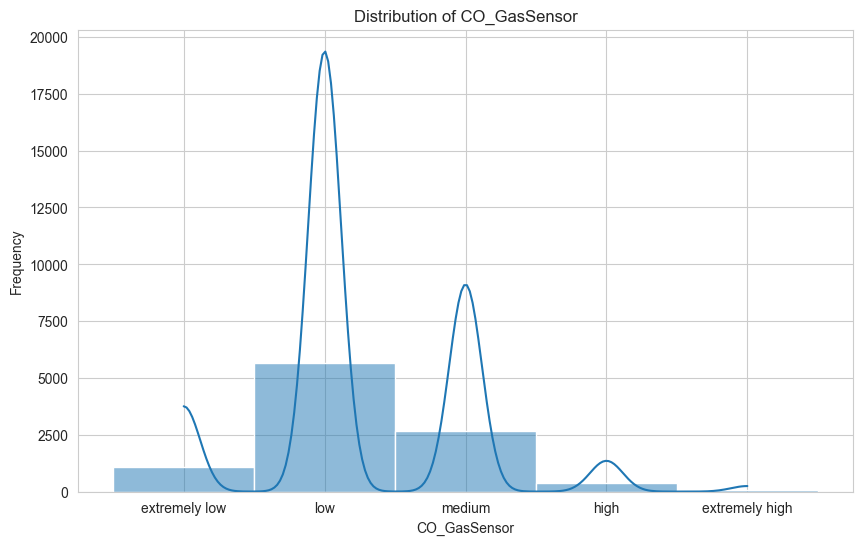


Spearman Correlation between Activity Level and CO_GasSensor:
Spearman Correlation Coefficient: -0.2646
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As CO_GasSensor increases, activity level tends to slightly decrease.


In [11]:
# CO_GasSensor
print(df['CO_GasSensor'].describe())
# There are 1369 datapoints in CO_GasSensor that are NaN. Impute with mode.
mode_value = df['CO_GasSensor'].mode()[0]  # Get the most frequent value
df['CO_GasSensor'] = df['CO_GasSensor'].fillna(mode_value)
print("\nCO_GasSensor Distribution (Imputed):")
display(df['CO_GasSensor'].describe())
# Define the desired order for 'CO_GasSensor'
CO_GasSensor_order = ['extremely low', 'low', 'medium', 'high', 'extremely high']
# Convert 'CO_GasSensor' to a categorical type with the specified order
df['CO_GasSensor'] = pd.Categorical(df['CO_GasSensor'], categories=CO_GasSensor_order, ordered=True)
# Set the aesthetic style of the plots
sns.set_style("whitegrid")
# Histogram for CO_GasSensor
plt.figure(figsize=(10, 6))
sns.histplot(df['CO_GasSensor'], kde=True) # type: ignore
plt.title('Distribution of CO_GasSensor')
plt.xlabel('CO_GasSensor')
plt.ylabel('Frequency')
plt.show()

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and CO_GasSensor:")
# Create copies to avoid SettingWithCopyWarning
CO_GasSensor_ranks = df['CO_GasSensor'].copy().map({'extremely low': 0, 'low': 1, 'medium': 2, 'high': 3, 'extremely high' : 4})
    
# Drop rows with NaN values in the ranks before correlation calculation
CO_GasSensor_correlation_df = pd.DataFrame({'CO_GasSensor_ranks': CO_GasSensor_ranks, 'activity_level_ranks': activity_level_ranks}).dropna()

spearman_corr_5, p_value_5 = spearmanr(CO_GasSensor_correlation_df['activity_level_ranks'], CO_GasSensor_correlation_df['CO_GasSensor_ranks'])

print(f"Spearman Correlation Coefficient: {spearman_corr_5:.4f}")
print(f"P-value: {p_value_5:.4f}")

if p_value_5 < 0.05: # type: ignore
    print("\nThe correlation is statistically significant.")
    if spearman_corr_5 > 0.1: # type: ignore
        print("Interpretation: There is a weak positive monotonic correlation. As CO_GasSensor increases, activity level tends to slightly increase.")
    elif spearman_corr_5 < -0.1: # type: ignore
        print("Interpretation: There is a weak negative monotonic correlation. As CO_GasSensor increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")
# Spearman shows that that there a statistically significant correlation between CO_GasSensor and Activity Level. There is a weak negtaive monotonic correlation. 
# Spearman_corr_coeff = -0.2646

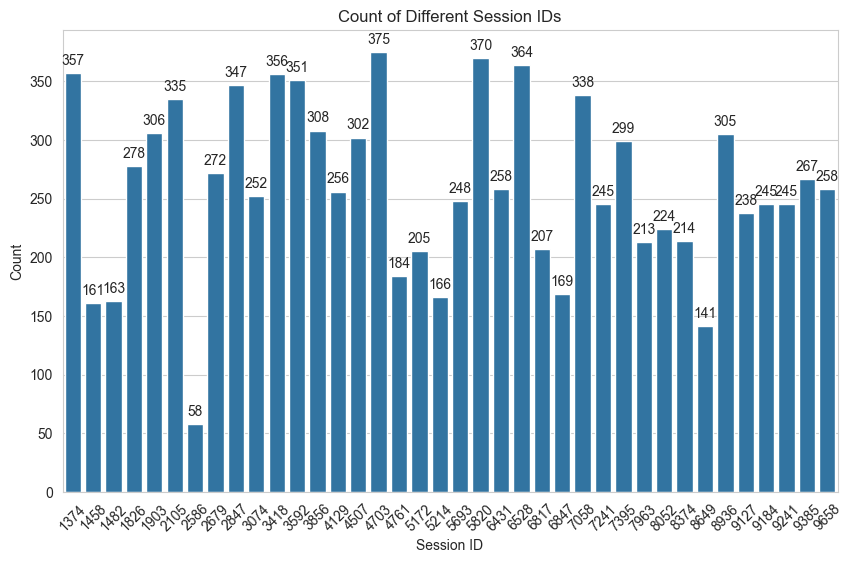


Quantity_of_Unique_Session_IDs 38

Activity Level analysis against Session_ID_Bands Bands:


Session_ID_Bands,1000-2000,2000-3000,3000-4000,4000-5000,5000-6000,6000-7000,7000-8000,8000-9000,9000-10000
Activity Level,,,,,,,,,
Low Activity,709,412,804,701,537,607,738,551,663
Moderate Activity,428,448,352,298,349,276,246,251,434
High Activity,128,152,111,118,103,115,111,82,156


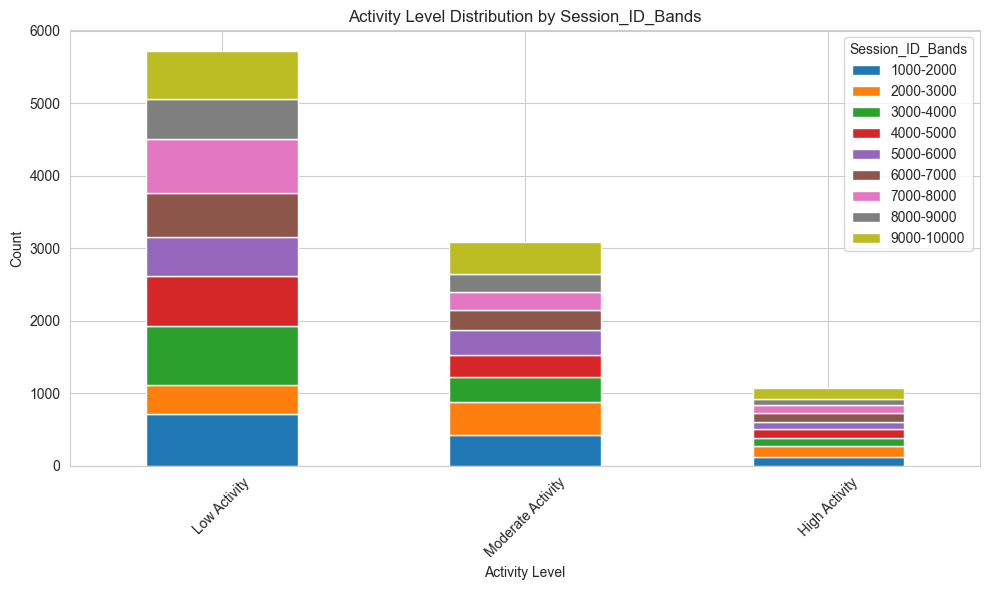


Spearman Correlation between Activity Level and Session_ID_Bands:
Spearman Correlation Coefficient: -0.0368
P-value: 0.0003

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Session_ID_Bands increases, activity level tends to slightly decrease.

Session ID is very likely to be just an identifier


In [12]:
# Session ID - Likely to be just an identifiying feature, but later it turns out otherwise. 
# Set the aesthetic style of the plots
sns.set_style("whitegrid")
# Bar chart for "Session ID" with annotations
plt.figure(figsize=(10, 6))
count_plot = sns.countplot(x='Session ID', data=df)
plt.title('Count of Different Session IDs')
plt.xlabel('Session ID')
plt.ylabel('Count')
plt.xticks(rotation=45)
# Annotate the bars with the frequency count
for p in count_plot.patches:
    count_plot.annotate(format(p.get_height(), '.0f'), # type: ignore
                        (p.get_x() + p.get_width() / 2., p.get_height()), # type: ignore
                        ha = 'center', va = 'center',
                        xytext = (0, 9),
                        textcoords = 'offset points')
plt.show()
Quantity_of_Unique_Session_IDs = df['Session ID'].nunique()
print("\nQuantity_of_Unique_Session_IDs", Quantity_of_Unique_Session_IDs)

# Activity Level analysis against Session_ID_Bands
print("\nActivity Level analysis against Session_ID_Bands Bands:")
# Define Session_ID bins and labels for analysis
Session_ID_bins = [1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
Session_ID_labels = ['1000-2000', '2000-3000', '3000-4000', '4000-5000', '5000-6000', '6000-7000', '7000-8000', '8000-9000', '9000-10000']
# Create a new categorical series for Session_ID_Bands
df['Session_ID_Bands'] = pd.cut(df['Session ID'], bins=Session_ID_bins, labels=Session_ID_labels, right=True)
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['Activity Level'], df['Session_ID_Bands'])
display(crosstab_df)

# Plot the crosstab as a stacked bar chart
crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Activity Level Distribution by Session_ID_Bands')
plt.xlabel('Activity Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Session_ID_Bands')
plt.tight_layout()
plt.show()

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and Session_ID_Bands:")
# Create copies to avoid SettingWithCopyWarning
Session_ID_Bands_ranks = df['Session_ID_Bands'].cat.codes.copy()
    
# Drop rows with NaN values in the ranks before correlation calculation
Session_ID_Bands_correlation_df = pd.DataFrame({'Session_ID_Bands': Session_ID_Bands_ranks, 'activity_level_ranks': activity_level_ranks}).dropna()

spearman_corr_7, p_value_7 = spearmanr(Session_ID_Bands_correlation_df['activity_level_ranks'], Session_ID_Bands_correlation_df['Session_ID_Bands'])

print(f"Spearman Correlation Coefficient: {spearman_corr_7:.4f}")
print(f"P-value: {p_value_7:.4f}")

if p_value_7 < 0.05: # type: ignore
    print("\nThe correlation is statistically significant.")
    if spearman_corr_7 > 0.1: # type: ignore
        print("Interpretation: There is a weak positive monotonic correlation. As Session_ID_Bands increases, activity level tends to slightly increase.")
    elif spearman_corr_1 < -0.1: # type: ignore
        print("Interpretation: There is a weak negative monotonic correlation. As Session_ID_Bands increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")

print("\nSession ID is very likely to be just an identifier")
# Spearman shows that that there a statistically significant correlation between Session_ID_Bands and Activity Level. There is a weak negtaive monotonic correlation. 
# Spearman_corr_coeff = -0.0368. Perhaps as the sessions get done later, the activity level slightly decreases?



HVAC Operation Mode Value Counts (Mapped):


HVAC Operation Mode
maintenance_mode    1684
cooling_active      1683
heating_active      1666
off                 1621
eco_mode            1618
ventilation_only    1608
Name: count, dtype: int64

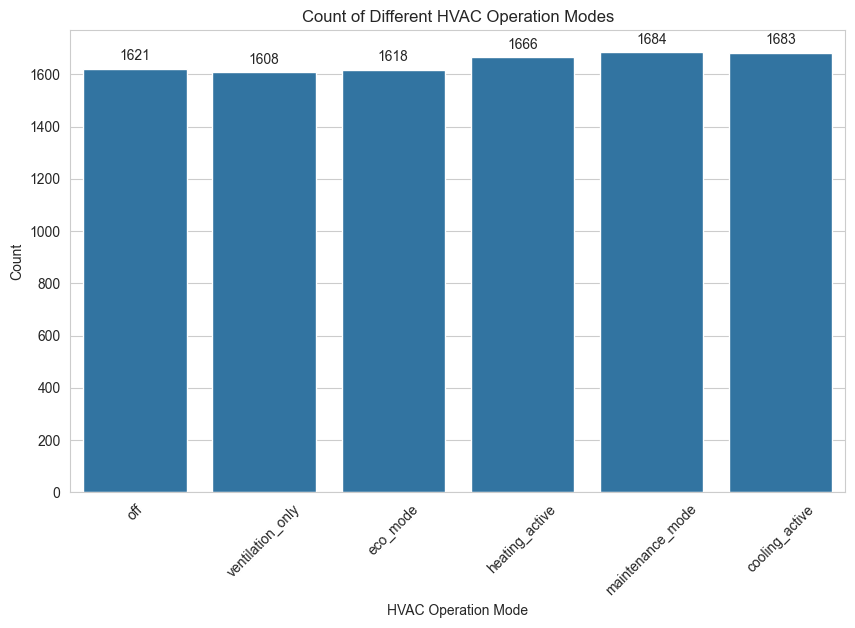

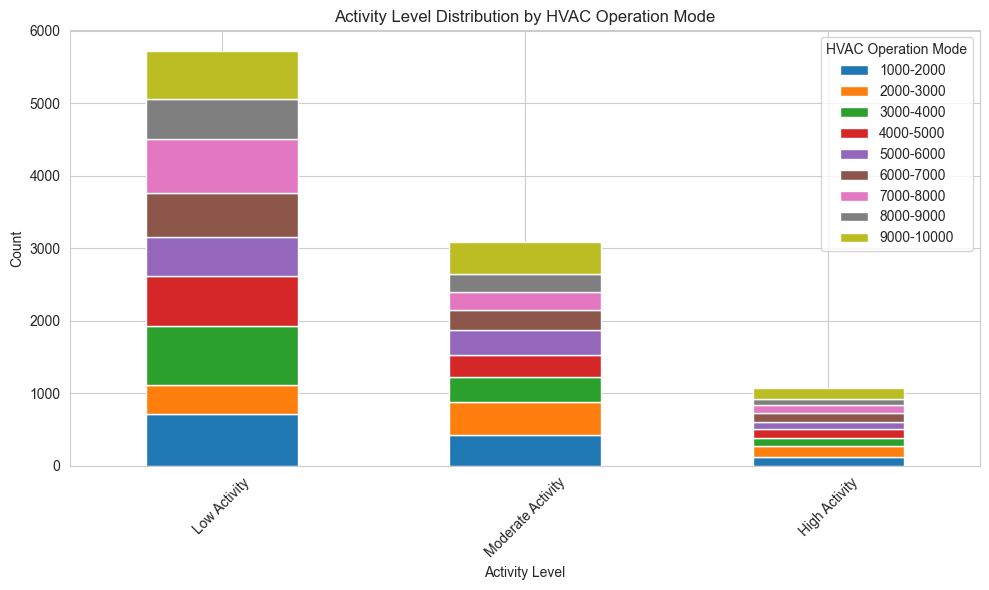


Spearman Correlation between Activity Level and HVAC Operation Mode:
Spearman Correlation Coefficient: 0.0020
P-value: 0.8390

The correlation is not statistically significant (p-value >= 0.05).


'\nSpearman Correlation between Activity Level and HVAC Operation Mode:\nSpearman Correlation Coefficient: 0.0020\nP-value: 0.8390\n\nThe correlation is not statistically significant (p-value >= 0.05).\n'

In [13]:
# --- Categorical Feature Cleaning ---
# The data input is a mess. 
# HVAC Operation Mode mapping
mode_HVAC_mapping = {
    'off': 'off', 
    'ventilation_only': 'ventilation_only', 
    'eco_mode': 'eco_mode',
    'Heating_active': 'heating_active', 
    'heating_active': 'heating_active',
    'maintenance_mode': 'maintenance_mode', 
    'cooling_active': 'cooling_active',
    'Eco_Mode': 'eco_mode', 
    'Cooling_Active': 'cooling_active',
    'MAINTENANCE_MODE': 'maintenance_mode', 
    'Eco_mode': 'eco_mode',
    'HEATING_ACTIVE': 'heating_active', 
    'COOLING_ACTIVE': 'cooling_active',
    'VENTILATION_ONLY': 'ventilation_only', 
    'Ventilation_Only': 'ventilation_only',
    'Heating_Active': 'heating_active', 
    'Off': 'off', 
    'ECO_MODE': 'eco_mode',
    'Ventilation_only': 'ventilation_only', 
    'OFF': 'off',
    'Maintenance_mode': 'maintenance_mode', 
    'Maintenance_Mode': 'maintenance_mode',
    'Cooling_active': 'cooling_active'
}

df['HVAC Operation Mode'] = (
    df['HVAC Operation Mode']
    .map(mode_HVAC_mapping)
    .fillna('unknown')
    .replace('', 'unknown')
)

print("\nHVAC Operation Mode Value Counts (Mapped):")
display(df['HVAC Operation Mode'].value_counts())

# Bar chart for "HVAC Operation Mode" with annotations (after cleaning)
plt.figure(figsize=(10, 6))
count_plot = sns.countplot(x='HVAC Operation Mode', data=df)
plt.title('Count of Different HVAC Operation Modes')
plt.xlabel('HVAC Operation Mode')
plt.ylabel('Count')
plt.xticks(rotation=45)

# Annotate the bars with the frequency count
for p in count_plot.patches:
    count_plot.annotate(
        format(p.get_height(), '.0f'), # type: ignore
        (p.get_x() + p.get_width() / 2., p.get_height()), # type: ignore
        ha='center',
        va='center',
        xytext=(0, 9),
        textcoords='offset points'
    )
plt.show()
# Graph shows that the datapoints are rather well distributed.

# Plot the crosstab as a stacked bar chart
crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Activity Level Distribution by HVAC Operation Mode')
plt.xlabel('Activity Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='HVAC Operation Mode')
plt.tight_layout()
plt.show()
# Graph shows there might be some correlation between HVAC Operation Mode and Activity Level.

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and HVAC Operation Mode:")

# Rank mapping (logical order: off → ventilation → eco → heating → maintenance → cooling → unknown)
hvac_rank_mapping = {
    'off': 0,
    'ventilation_only': 1,
    'eco_mode': 2,
    'heating_active': 3,
    'maintenance_mode': 4,
    'cooling_active': 5,
    'unknown': 6
}

# Correct per-row ranking (was previously broken — only ranked the 7 categories instead of all rows)
HVAC_Operation_Mode_ranks = df['HVAC Operation Mode'].map(hvac_rank_mapping)

spearman_corr_7, p_value_7 = spearmanr(HVAC_Operation_Mode_ranks, activity_level_ranks)

print(f"Spearman Correlation Coefficient: {spearman_corr_7:.4f}")
print(f"P-value: {p_value_7:.4f}")

if p_value_7 < 0.05: # type: ignore
    print("\nThe correlation is statistically significant.")
    if spearman_corr_7 > 0.1: # type: ignore
        print("Interpretation: There is a weak positive monotonic correlation. "
              "As HVAC Operation Mode rank increases, activity level tends to slightly increase.")
    elif spearman_corr_7 < -0.1: # type: ignore
        print("Interpretation: There is a weak negative monotonic correlation. "
              "As HVAC Operation Mode rank increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. "
              "The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")

"""
Spearman Correlation between Activity Level and HVAC Operation Mode:
Spearman Correlation Coefficient: 0.0020
P-value: 0.8390

The correlation is not statistically significant (p-value >= 0.05).
"""


Ambient Light Level Value Counts (After Dynamic Imputation):


Ambient Light Level
very_bright    3284
bright         2663
moderate       1759
dim            1237
very_dim        937
Name: count, dtype: int64

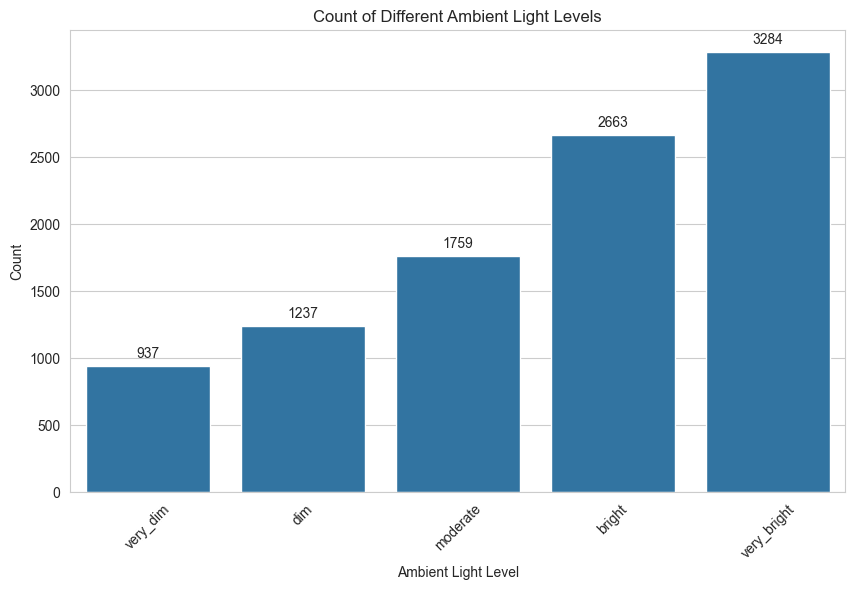

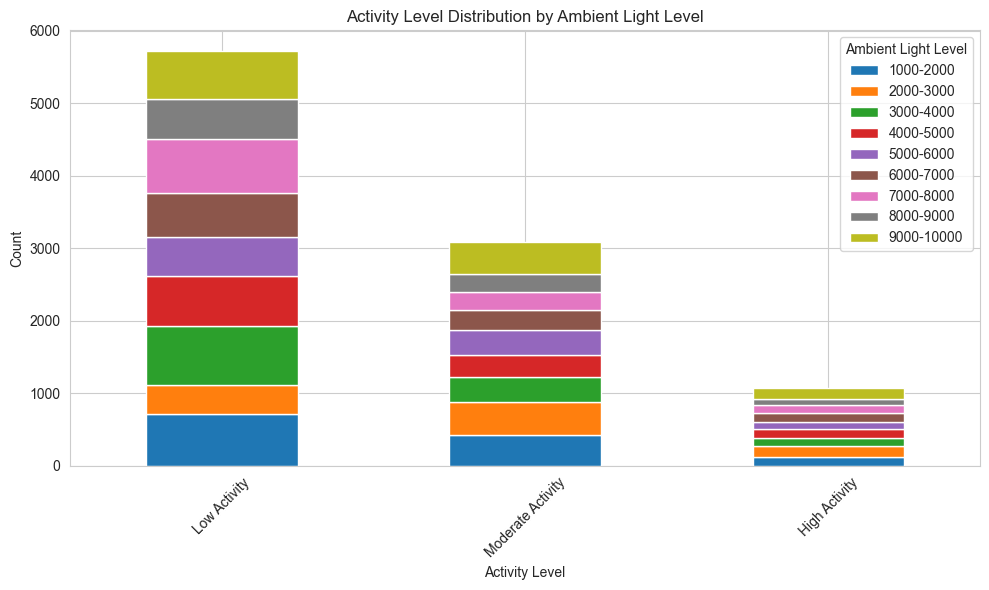


Spearman Correlation between Activity Level and Ambient Light Level:
Spearman Correlation Coefficient: -0.0103
P-value: 0.3074

The correlation is not statistically significant (p-value >= 0.05).


In [14]:
# Ambient Light Level

# Ambient Light Level imputation (dynamic)
if 'Ambient Light Level' in df.columns:
    df['Ambient Light Level'] = df['Ambient Light Level'].fillna('Missing').replace('', 'Missing')
    
# Get the categories from the non-missing values
categories = df['Ambient Light Level'].loc[df['Ambient Light Level'] != 'Missing'].unique()
    
if len(categories) > 0:
    np.random.seed(42)
    missing_count = df['Ambient Light Level'].eq('Missing').sum()
    imputed_values = np.random.choice(categories, size=missing_count, replace=True)
    df.loc[df['Ambient Light Level'].eq('Missing'), 'Ambient Light Level'] = imputed_values
    
print("\nAmbient Light Level Value Counts (After Dynamic Imputation):")
display(df['Ambient Light Level'].value_counts())

# Define the desired order for 'Ambient Light Level'
Ambient_Light_Level_order = ['very_dim', 'dim', 'moderate', 'bright', 'very_bright']
# Convert 'Ambient Light Level' to a categorical type with the specified order
df['Ambient Light Level'] = pd.Categorical(df['Ambient Light Level'], categories=Ambient_Light_Level_order, ordered=True)

# Bar chart for "Ambient Light Level" with annotations
plt.figure(figsize=(10, 6))
count_plot = sns.countplot(x='Ambient Light Level', data=df)
plt.title('Count of Different Ambient Light Levels')
plt.xlabel('Ambient Light Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
# Annotate the bars with the frequency count
for p in count_plot.patches:
    count_plot.annotate(format(p.get_height(), '.0f'), # type: ignore
                        (p.get_x() + p.get_width() / 2., p.get_height()), # type: ignore
                        ha = 'center', va = 'center',
                        xytext = (0, 9),
                        textcoords = 'offset points')
plt.show()

    # Plot the crosstab as a stacked bar chart
crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Activity Level Distribution by Ambient Light Level')
plt.xlabel('Activity Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Ambient Light Level')
plt.tight_layout()
plt.show()
# Graph shows there might be some correlation between HVAC Operation Mode and Activity Level

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and Ambient Light Level:")
# Create copies to avoid SettingWithCopyWarning
Ambient_Light_Level_ranks = df['Ambient Light Level'].copy().map({'very_dim': 0, 'dim': 1, 'moderate': 2, 'bright': 3, 'very_bright' : 4})
    
# Drop rows with NaN values in the ranks before correlation calculation
Ambient_Light_Level_correlation_df = pd.DataFrame({'Ambient_Light_Level_ranks': Ambient_Light_Level_ranks, 'activity_level_ranks': activity_level_ranks}).dropna()

spearman_corr_6, p_value_6 = spearmanr(Ambient_Light_Level_correlation_df['Ambient_Light_Level_ranks'], Ambient_Light_Level_correlation_df['activity_level_ranks'])

print(f"Spearman Correlation Coefficient: {spearman_corr_6:.4f}")
print(f"P-value: {p_value_6:.4f}")

if p_value_6 < 0.05: # type: ignore
    print("\nThe correlation is statistically significant.")
    if spearman_corr_6 > 0.1: # type: ignore
        print("Interpretation: There is a weak positive monotonic correlation. As Ambient_Light_Level increases, activity level tends to slightly increase.")
    elif spearman_corr_6 < -0.1: # type: ignore
        print("Interpretation: There is a weak negative monotonic correlation. As Ambient_Light_Level increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")
# Spearman does not how a statistically significant correlation between Ambient Light Level and Activity Level. 

In [15]:
# New features
df['is_daytime'] = (df['Time of Day'].isin(['morning', 'afternoon'])).astype(int)
df['co2_ratio'] = df['CO2_InfraredSensor'] / (df['CO2_ElectroChemicalSensor'] + 1e-6)
mos_cols = [f'MetalOxideSensor_Unit{i}' for i in range(1,5)]
df['avg_metal_oxide'] = df[mos_cols].mean(axis=1)
df['mos_variance'] = df[mos_cols].std(axis=1)
df['hvac_active'] = (df['HVAC Operation Mode'] != 'off').astype(int)
# Binning example
df['temp_bin'] = pd.qcut(df['Temperature'], q=3, labels=['low', 'med', 'high'])


is_daytime vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
is_daytime,,,
0,3229,1137,516
1,2493,1945,560


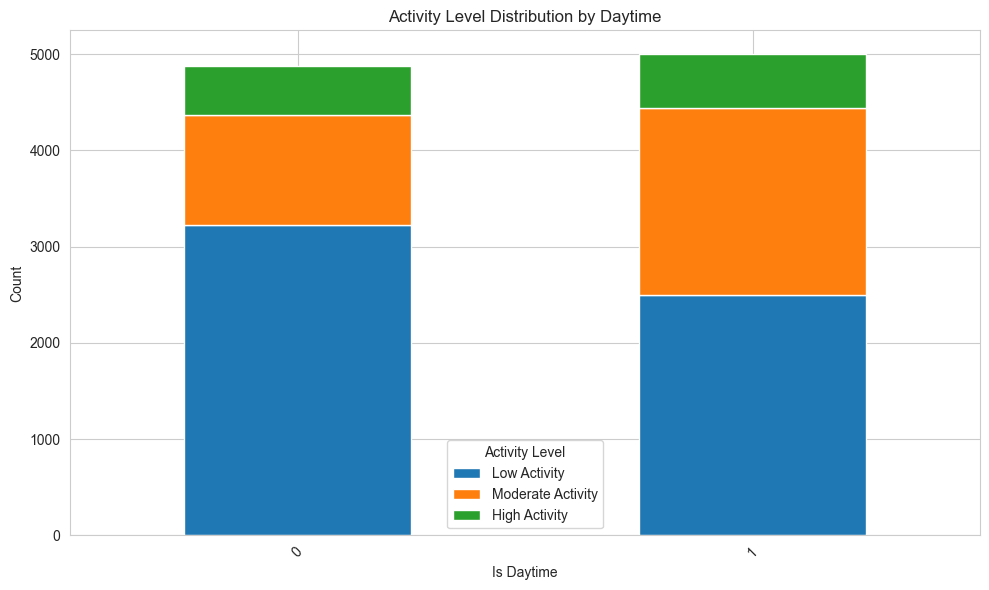


is_daytime Value Counts:


is_daytime
1    4998
0    4882
Name: count, dtype: int64


Spearman Correlation between Activity Level and is_daytime:
Spearman Correlation Coefficient: 0.1452
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As is_daytime increases, activity level tends to slightly increase.


'\nSpearman Correlation between Activity Level and is_daytime:\nSpearman Correlation Coefficient: 0.1452\nP-value: 0.0000\nThe correlation is statistically significant.\nInterpretation: There is a weak positive monotonic correlation. As is_daytime increases, activity level tends to slightly increase.\n'

In [16]:
# is_daytime analysis against Activity Level
print("\nis_daytime vs Activity Level:")
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['is_daytime'], df['Activity Level'])
display(crosstab_df)

# Plot the crosstab as a stacked bar chart
crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Activity Level Distribution by Daytime')
plt.xlabel('Is Daytime')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Activity Level')
plt.tight_layout()
plt.show()

# Time of Day imputation
print("\nis_daytime Value Counts:")
display(df['is_daytime'].value_counts())

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and is_daytime:")
# Create copies to avoid SettingWithCopyWarning
is_daytime_ranks = df['is_daytime'].copy()
activity_level_ranks = df['Activity Level'].copy().map({'Low Activity': 0, 'Moderate Activity': 1, 'High Activity': 2})

# Drop rows with NaN values in the ranks before correlation calculation
is_daytime_correlation_df = pd.DataFrame({'is_daytime_ranks': is_daytime_ranks, 'activity_level_ranks': activity_level_ranks}).dropna()

spearman_corr_0, p_value_0 = spearmanr(is_daytime_correlation_df['activity_level_ranks'], is_daytime_correlation_df['is_daytime_ranks'])

print(f"Spearman Correlation Coefficient: {spearman_corr_0:.4f}")
print(f"P-value: {p_value_0:.4f}")

if p_value_0 < 0.05: # pyright: ignore[reportOperatorIssue]
    print("\nThe correlation is statistically significant.")
    if spearman_corr_0 > 0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak positive monotonic correlation. As is_daytime increases, activity level tends to slightly increase.")
    elif spearman_corr_0 < -0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak negative monotonic correlation. As is_daytime increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")
"""
Spearman Correlation between Activity Level and is_daytime:
Spearman Correlation Coefficient: 0.1452
P-value: 0.0000
The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As is_daytime increases, activity level tends to slightly increase.
"""


co2_ratio vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
co2_ratio,,,
0.704493,0,1,0
0.727831,0,1,0
0.727870,1,0,0
0.732126,0,1,0
0.734295,0,0,1
...,...,...,...
1.267200,1,0,0
1.270331,1,0,0
1.359488,1,0,0



Analyzing the new 'co2_ratio' feature:


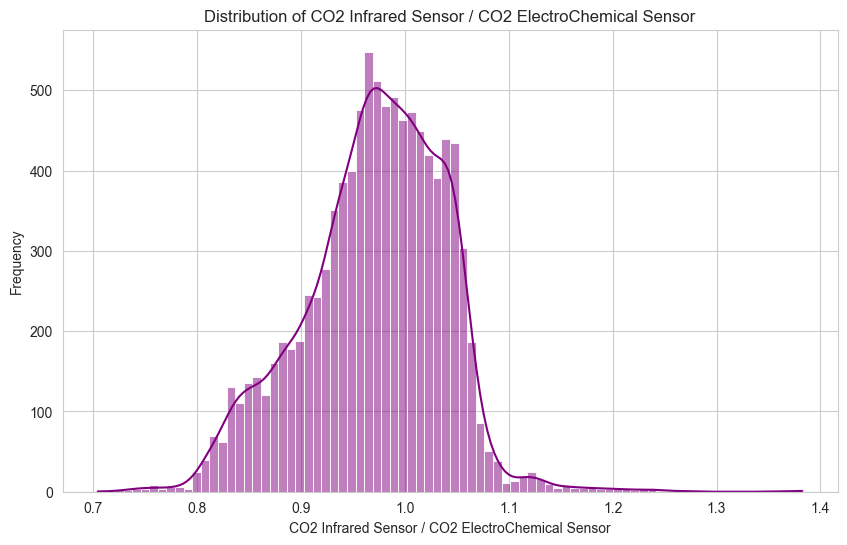

Spearman Correlation between 'CO2 Infrared Sensor / CO2 ElectroChemical Sensor' and 'Activity_Level':
Correlation Coefficient: -0.3451
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As CO2_ratio increases, activity level tends to slightly decrease.


"\nSpearman Correlation between 'CO2 Infrared Sensor / CO2 ElectroChemical Sensor' and 'Activity_Level':\nCorrelation Coefficient: -0.3451\nP-value: 0.0000\nThe correlation is statistically significant.\nInterpretation: There is a weak negative monotonic correlation. As CO2_ratio increases, activity level tends to slightly decrease.\n"

In [17]:
# 'co2_ratio' analysis against Activity Level
print("\nco2_ratio vs Activity Level:")
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['co2_ratio'], df['Activity Level'])
display(crosstab_df)

print("\nAnalyzing the new 'co2_ratio' feature:")
plt.figure(figsize=(10, 6))
sns.histplot(df['co2_ratio'], kde=True, color='purple') # type: ignore
plt.title('Distribution of CO2 Infrared Sensor / CO2 ElectroChemical Sensor')
plt.xlabel('CO2 Infrared Sensor / CO2 ElectroChemical Sensor')
plt.ylabel('Frequency')
plt.show()

# Calculate Spearman correlation with the target variable for the new feature
# Drop rows with NaNs in either variable for the correlation calculation
co2_ratio_corr_df = pd.DataFrame({'co2_ratio': df['co2_ratio'], 'activity_level': activity_level_ranks}).dropna()
if not co2_ratio_corr_df.empty:
    spearman_corr_3, p_value_3 = spearmanr(co2_ratio_corr_df['co2_ratio'], co2_ratio_corr_df['activity_level'])
    print(f"Spearman Correlation between 'CO2 Infrared Sensor / CO2 ElectroChemical Sensor' and 'Activity_Level':")
    print(f"Correlation Coefficient: {spearman_corr_3:.4f}")
    print(f"P-value: {p_value_3:.4f}")
else:
    print("Could not compute Spearman correlation for 'CO2 Infrared Sensor / CO2 ElectroChemical Sensor' due to missing data.")
if p_value_3 < 0.05: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
        print("\nThe correlation is statistically significant.")
        if spearman_corr_3 > 0.1: # pyright: ignore[reportPossiblyUnboundVariable, reportOperatorIssue]
            print("Interpretation: There is a weak positive monotonic correlation. As CO2_ratio increases, activity level tends to slightly increase.")
        elif spearman_corr_3 < -0.1: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
            print("Interpretation: There is a weak negative monotonic correlation. As CO2_ratio increases, activity level tends to slightly decrease.")
        else:
            print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
        print("\nThe correlation is not statistically significant (p-value >= 0.05).")
"""
Spearman Correlation between 'CO2 Infrared Sensor / CO2 ElectroChemical Sensor' and 'Activity_Level':
Correlation Coefficient: -0.3451
P-value: 0.0000
The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As CO2_ratio increases, activity level tends to slightly decrease.
"""


avg_metal_oxide vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
avg_metal_oxide,,,
471.0450,1,0,0
494.6175,1,0,0
498.1450,1,0,0
509.4930,2,0,0
510.8800,1,0,0
...,...,...,...
743.4800,1,0,0
744.0725,0,1,0
747.3000,0,1,0



Analyzing the new 'avg_metal_oxide' feature:


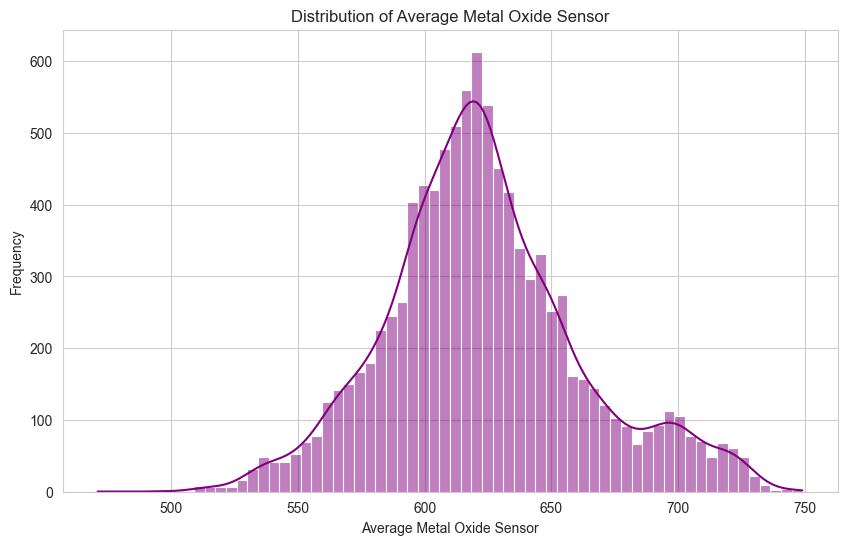

Spearman Correlation between 'Average Metal Oxide Sensor' and 'Activity_Level':
Correlation Coefficient: 0.3683
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As Average Metal Oxide Sensor increases, activity level tends to slightly increase.


"\nSpearman Correlation between 'Average Metal Oxide Sensor' and 'Activity_Level':\nCorrelation Coefficient: 0.3683\nP-value: 0.0000\nThe correlation is statistically significant.\nInterpretation: There is a weak positive monotonic correlation. As Average Metal Oxide Sensor increases, activity level tends to slightly increase."

In [18]:
# avg_metal_oxide analysis against Activity Level
print("\navg_metal_oxide vs Activity Level:")
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['avg_metal_oxide'], df['Activity Level'])
display(crosstab_df)

print("\nAnalyzing the new 'avg_metal_oxide' feature:")
plt.figure(figsize=(10, 6))
sns.histplot(df['avg_metal_oxide'], kde=True, color='purple') # type: ignore
plt.title('Distribution of Average Metal Oxide Sensor')
plt.xlabel('Average Metal Oxide Sensor')
plt.ylabel('Frequency')
plt.show()

# Calculate Spearman correlation with the target variable for the new feature
# Drop rows with NaNs in either variable for the correlation calculation
avg_metal_oxide_corr_df = pd.DataFrame({'avg_metal_oxide': df['avg_metal_oxide'], 'activity_level': activity_level_ranks}).dropna()
if not avg_metal_oxide_corr_df.empty:
    spearman_corr_3, p_value_3 = spearmanr(avg_metal_oxide_corr_df['avg_metal_oxide'], avg_metal_oxide_corr_df['activity_level'])
    print(f"Spearman Correlation between 'Average Metal Oxide Sensor' and 'Activity_Level':")
    print(f"Correlation Coefficient: {spearman_corr_3:.4f}")
    print(f"P-value: {p_value_3:.4f}")
else:
    print("Could not compute Spearman correlation for 'Average Metal Oxide Sensor' due to missing data.")
if p_value_3 < 0.05: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
        print("\nThe correlation is statistically significant.")
        if spearman_corr_3 > 0.1: # pyright: ignore[reportPossiblyUnboundVariable, reportOperatorIssue]
            print("Interpretation: There is a weak positive monotonic correlation. As Average Metal Oxide Sensor increases, activity level tends to slightly increase.")
        elif spearman_corr_3 < -0.1: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
            print("Interpretation: There is a weak negative monotonic correlation. As Average Metal Oxide Sensor increases, activity level tends to slightly decrease.")
        else:
            print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
        print("\nThe correlation is not statistically significant (p-value >= 0.05).")
"""
Spearman Correlation between 'Average Metal Oxide Sensor' and 'Activity_Level':
Correlation Coefficient: 0.3683
P-value: 0.0000
The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As Average Metal Oxide Sensor increases, activity level tends to slightly increase."""


mos_variance vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
mos_variance,,,
55.700536,1,0,0
57.323083,1,0,0
59.299269,0,1,0
60.018713,1,0,0
61.674646,0,1,0
...,...,...,...
222.711218,0,0,1
226.474635,1,0,0
230.938106,1,0,0



Analyzing the new 'mos_variance' feature:


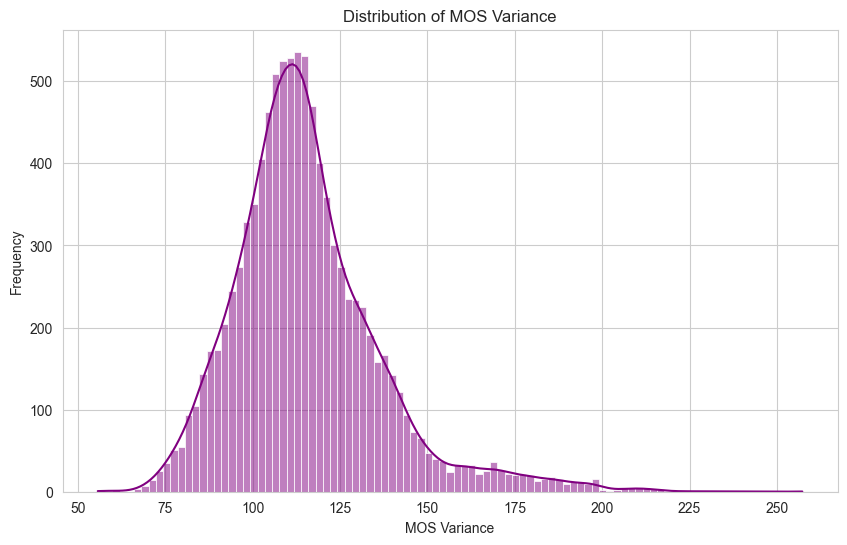

Spearman Correlation between 'MOS Variance' and 'Activity_Level':
Correlation Coefficient: -0.0375
P-value: 0.0002

The correlation is statistically significant.
Interpretation: The correlation is very weak. The relationship between the two variables is not strong.


"\nSpearman Correlation between 'MOS Variance' and 'Activity_Level':\nCorrelation Coefficient: -0.0375\nP-value: 0.0002\nThe correlation is statistically significant.\nInterpretation: The correlation is very weak. The relationship between the two variables is not strong.\n"

In [19]:
# mos_variance analysis against Activity Level
print("\nmos_variance vs Activity Level:")
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['mos_variance'], df['Activity Level'])
display(crosstab_df)

print("\nAnalyzing the new 'mos_variance' feature:")
plt.figure(figsize=(10, 6))
sns.histplot(df['mos_variance'], kde=True, color='purple') # type: ignore
plt.title('Distribution of MOS Variance')
plt.xlabel('MOS Variance')
plt.ylabel('Frequency')
plt.show()

# Calculate Spearman correlation with the target variable for the new feature
# Drop rows with NaNs in either variable for the correlation calculation
mos_variance_corr_df = pd.DataFrame({'mos_variance': df['mos_variance'], 'activity_level': activity_level_ranks}).dropna()
if not mos_variance_corr_df.empty:
    spearman_corr_4, p_value_4 = spearmanr(mos_variance_corr_df['mos_variance'], mos_variance_corr_df['activity_level'])
    print(f"Spearman Correlation between 'MOS Variance' and 'Activity_Level':")
    print(f"Correlation Coefficient: {spearman_corr_4:.4f}")
    print(f"P-value: {p_value_4:.4f}")
else:
    print("Could not compute Spearman correlation for 'MOS Variance' due to missing data.")
if p_value_4 < 0.05: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
        print("\nThe correlation is statistically significant.")
        if spearman_corr_4 > 0.1: # pyright: ignore[reportPossiblyUnboundVariable, reportOperatorIssue]
            print("Interpretation: There is a weak positive monotonic correlation. As MOS Variance increases, activity level tends to slightly increase.")
        elif spearman_corr_4 < -0.1: # pyright: ignore[reportOperatorIssue, reportPossiblyUnboundVariable]
            print("Interpretation: There is a weak negative monotonic correlation. As MOS Variance increases, activity level tends to slightly decrease.")
        else:
            print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
        print("\nThe correlation is not statistically significant (p-value >= 0.05).")
"""
Spearman Correlation between 'MOS Variance' and 'Activity_Level':
Correlation Coefficient: -0.0375
P-value: 0.0002
The correlation is statistically significant.
Interpretation: The correlation is very weak. The relationship between the two variables is not strong.
"""


hvac_active vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
hvac_active,,,
0,927,522,172
1,4795,2560,904


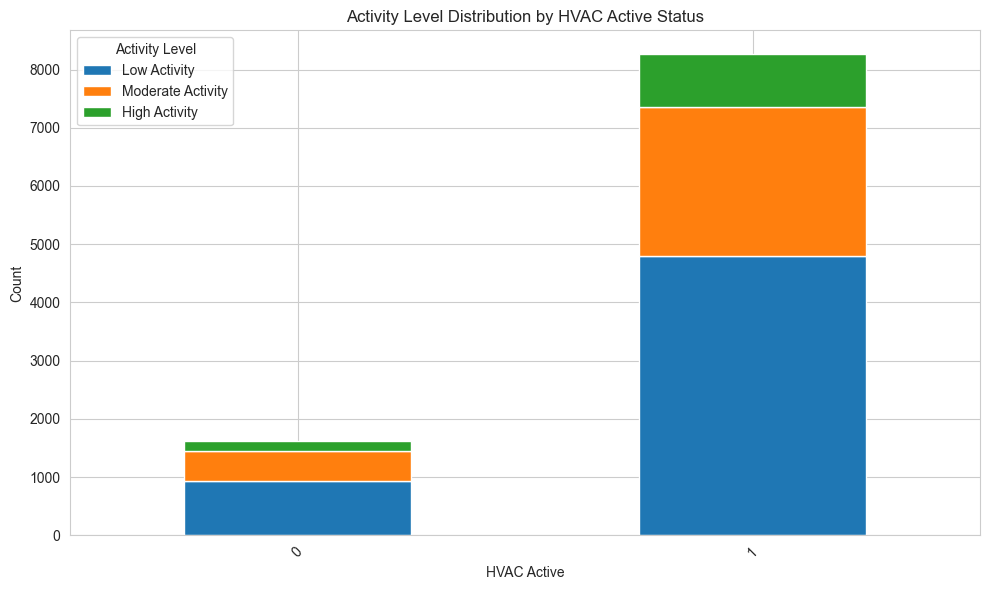


hvac_active Value Counts:


hvac_active
1    8259
0    1621
Name: count, dtype: int64


Spearman Correlation between Activity Level and hvac_active:
Spearman Correlation Coefficient: -0.0046
P-value: 0.6454

The correlation is not statistically significant (p-value >= 0.05).


'\nSpearman Correlation between Activity Level and hvac_active:\nSpearman Correlation Coefficient: -0.0046\nP-value: 0.6454\nThe correlation is not statistically significant (p-value >= 0.05).\n'

In [20]:
# hvac_active analysis against Activity Level
print("\nhvac_active vs Activity Level:")
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['hvac_active'], df['Activity Level'])
display(crosstab_df)

# Plot the crosstab as a stacked bar chart
crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Activity Level Distribution by HVAC Active Status')
plt.xlabel('HVAC Active')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Activity Level')
plt.tight_layout()
plt.show()

# HVAC Active imputation
print("\nhvac_active Value Counts:")
display(df['hvac_active'].value_counts())

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and hvac_active:")
# Create copies to avoid SettingWithCopyWarning
hvac_active_ranks = df['hvac_active'].copy()
activity_level_ranks = df['Activity Level'].copy().map({'Low Activity': 0, 'Moderate Activity': 1, 'High Activity': 2})

# Drop rows with NaN values in the ranks before correlation calculation
hvac_active_correlation_df = pd.DataFrame({'hvac_active_ranks': hvac_active_ranks, 'activity_level_ranks': activity_level_ranks}).dropna()

spearman_corr_0, p_value_0 = spearmanr(hvac_active_correlation_df['activity_level_ranks'], hvac_active_correlation_df['hvac_active_ranks'])

print(f"Spearman Correlation Coefficient: {spearman_corr_0:.4f}")
print(f"P-value: {p_value_0:.4f}")

if p_value_0 < 0.05: # pyright: ignore[reportOperatorIssue]
    print("\nThe correlation is statistically significant.")
    if spearman_corr_0 > 0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak positive monotonic correlation. As hvac_active increases, activity level tends to slightly increase.")
    elif spearman_corr_0 < -0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak negative monotonic correlation. As hvac_active increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")
"""
Spearman Correlation between Activity Level and hvac_active:
Spearman Correlation Coefficient: -0.0046
P-value: 0.6454
The correlation is not statistically significant (p-value >= 0.05).
"""


temp_bin vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
temp_bin,,,
low,1282,1589,424
med,1984,903,409
high,2456,590,243


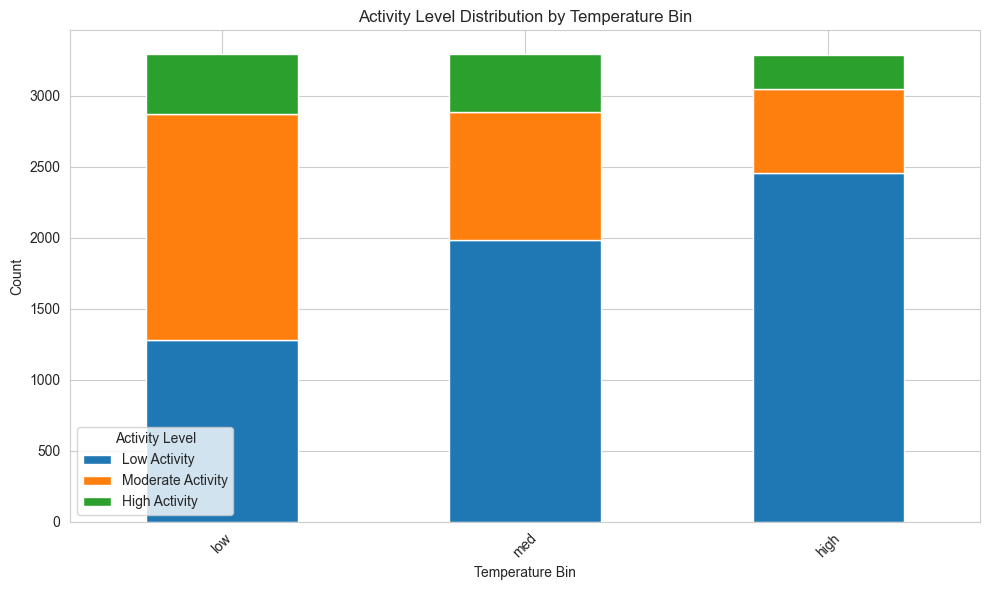


temp_bin Value Counts:


temp_bin
med     3296
low     3295
high    3289
Name: count, dtype: int64


Spearman Correlation between Activity Level and temp_bin:
Spearman Correlation Coefficient: 0.1204
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As temp_bin increases, activity level tends to slightly increase.


'\nSpearman Correlation between Activity Level and temp_bin:\nSpearman Correlation Coefficient: 0.1204\nP-value: 0.0000\nThe correlation is statistically significant.\nInterpretation: There is a weak positive monotonic correlation. As temp_bin increases, activity level tends to slightly increase.\n'

In [21]:
# temp_bin analysis against Activity Level
print("\ntemp_bin vs Activity Level:")
# Create a crosstab for comparison
crosstab_df = pd.crosstab(df['temp_bin'], df['Activity Level'])
display(crosstab_df)   

# Plot the crosstab as a stacked bar chart
crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Activity Level Distribution by Temperature Bin')
plt.xlabel('Temperature Bin')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Activity Level')
plt.tight_layout()
plt.show()

# Temperature Bin imputation
print("\ntemp_bin Value Counts:")
display(df['temp_bin'].value_counts())

# Calculate and display Spearman correlation
print("\nSpearman Correlation between Activity Level and temp_bin:")
# Create copies to avoid SettingWithCopyWarning
temp_bin_ranks = df['temp_bin'].copy()
activity_level_ranks = df['Activity Level'].copy().map({'Low Activity': 0, 'Moderate Activity': 1, 'High Activity': 2})

# Drop rows with NaN values in the ranks before correlation calculation
temp_bin_correlation_df = pd.DataFrame({'temp_bin_ranks': temp_bin_ranks, 'activity_level_ranks': activity_level_ranks}).dropna()

spearman_corr_0, p_value_0 = spearmanr(temp_bin_correlation_df['activity_level_ranks'], temp_bin_correlation_df['temp_bin_ranks'])

print(f"Spearman Correlation Coefficient: {spearman_corr_0:.4f}")
print(f"P-value: {p_value_0:.4f}")

if p_value_0 < 0.05: # pyright: ignore[reportOperatorIssue]
    print("\nThe correlation is statistically significant.")
    if spearman_corr_0 > 0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak positive monotonic correlation. As temp_bin increases, activity level tends to slightly increase.")
    elif spearman_corr_0 < -0.1: # pyright: ignore[reportOperatorIssue]
        print("Interpretation: There is a weak negative monotonic correlation. As temp_bin increases, activity level tends to slightly decrease.")
    else:
        print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
else:
    print("\nThe correlation is not statistically significant (p-value >= 0.05).")
"""
Spearman Correlation between Activity Level and temp_bin:
Spearman Correlation Coefficient: 0.1204
P-value: 0.0000
The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As temp_bin increases, activity level tends to slightly increase.
"""

# TIME-SERIES ANALYSIS AND FEATURE ENGINEERING


Data spans 38 sessions
Total rows: 9880


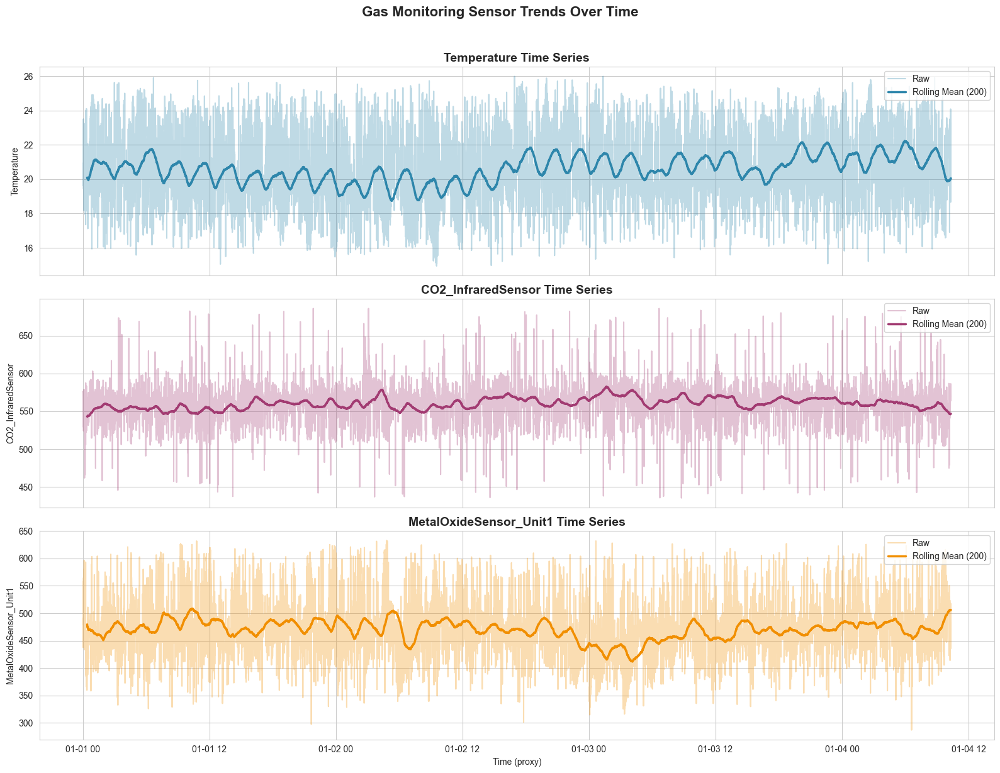

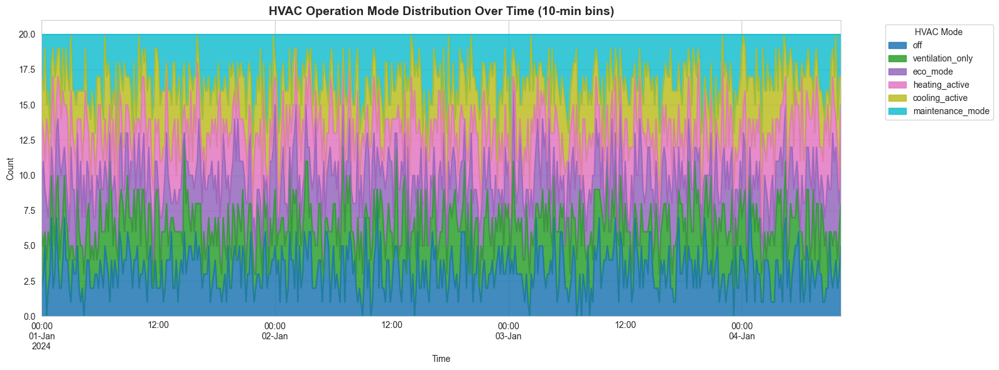

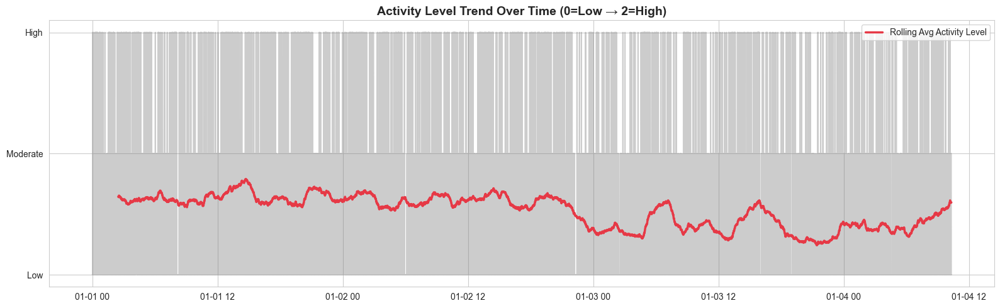

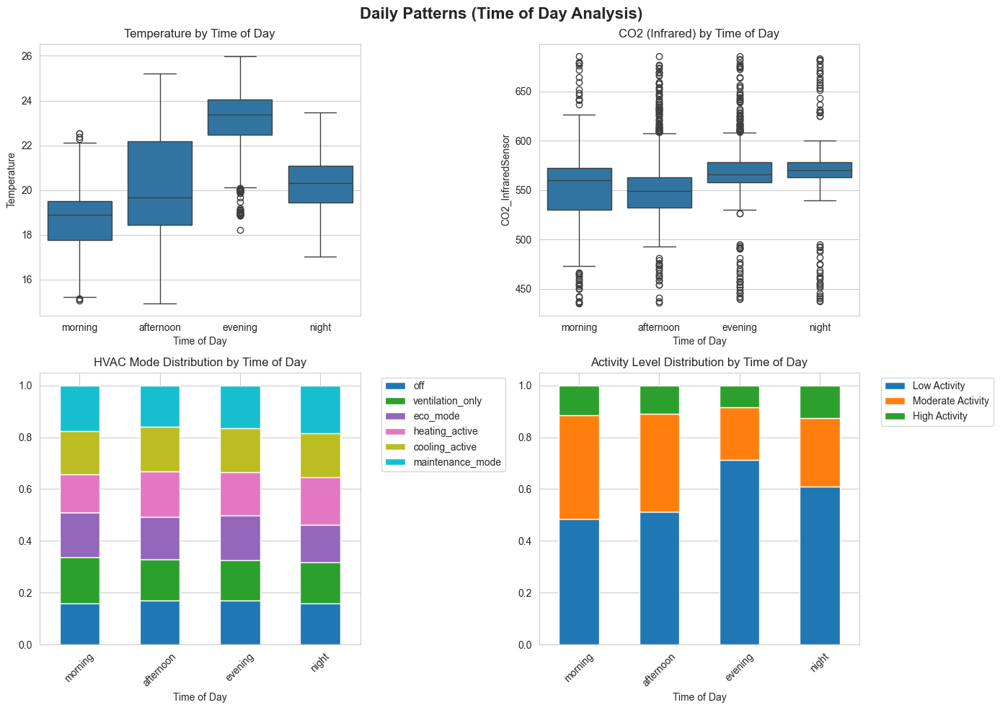

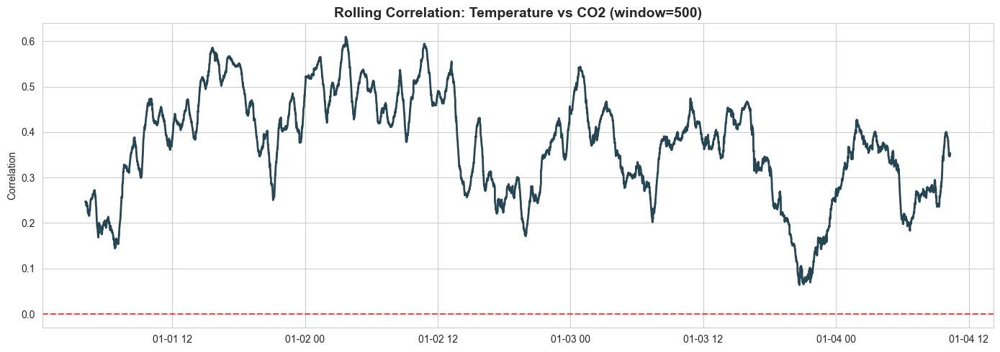


TIME-SERIES INSIGHTS

Overall Temperature trend: -0.02°C change (first 500 vs last 500 rows)

Top HVAC Mode Transitions:
   HVAC Operation Mode         HVAC_next  count
18    maintenance_mode    cooling_active    305
14      heating_active    heating_active    304
3       cooling_active  maintenance_mode    302
21    maintenance_mode  maintenance_mode    298
0       cooling_active    cooling_active    294

Spearman correlation (Time Index vs Activity Level): -0.1451 (p=0.0000)

✅ Time-series analysis complete!


In [22]:
# =============================================================================
# TIME-SERIES ANALYSIS - Gas Monitoring Data
# =============================================================================

# --- 2. Create Time Proxies ---
df = df.reset_index().rename(columns={'index': 'time_index'})  # row order as time
df['time_index'] = df.index

# Fake datetime for easier plotting (assume ~30s per reading)
df['fake_datetime'] = pd.date_range(start='2024-01-01', periods=len(df), freq='30s')

# Session-based time (within each session)
df['session_time'] = df.groupby('Session ID').cumcount()

print(f"\nData spans {df['Session ID'].nunique()} sessions")
print(f"Total rows: {len(df)}")

# --- 3. Time-Series Visualizations ---

# 3.1 Key Sensors Over Time (with rolling mean)
fig, axes = plt.subplots(3, 1, figsize=(16, 12), sharex=True)

sensors = ['Temperature', 'CO2_InfraredSensor', 'MetalOxideSensor_Unit1']
colors = ['#2E86AB', '#A23B72', '#F18F01']

for ax, sensor, color in zip(axes, sensors, colors):
    ax.plot(df['fake_datetime'], df[sensor], alpha=0.3, color=color, label='Raw')
    rolling = df[sensor].rolling(window=200, min_periods=50).mean()
    ax.plot(df['fake_datetime'], rolling, color=color, linewidth=2.5, label='Rolling Mean (200)')
    ax.set_ylabel(sensor)
    ax.legend(loc='upper right')
    ax.set_title(f'{sensor} Time Series', fontsize=14, fontweight='bold')

plt.suptitle('Gas Monitoring Sensor Trends Over Time', fontsize=16, fontweight='bold', y=1.02)
plt.xlabel('Time (proxy)')
plt.tight_layout()
plt.show()

# 3.2 HVAC Operation Mode Over Time (stacked area / count)
hvac_time = pd.crosstab(df['fake_datetime'].dt.floor('10min'), df['HVAC Operation Mode'])
hvac_time = hvac_time[['off', 'ventilation_only', 'eco_mode', 'heating_active', 'cooling_active', 'maintenance_mode']]

hvac_time.plot(kind='area', stacked=True, figsize=(16, 6), alpha=0.85,
               colormap='tab10')
plt.title('HVAC Operation Mode Distribution Over Time (10-min bins)', fontsize=14, fontweight='bold')
plt.ylabel('Count')
plt.xlabel('Time')
plt.legend(title='HVAC Mode', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 3.3 Activity Level Over Time
activity_order = ['Low Activity', 'Moderate Activity', 'High Activity']
df['Activity_Level_Rank'] = df['Activity Level'].map({'Low Activity': 0, 'Moderate Activity': 1, 'High Activity': 2})

plt.figure(figsize=(16, 5))
plt.plot(df['fake_datetime'], df['Activity_Level_Rank'], alpha=0.4, color='gray')
rolling_activity = df['Activity_Level_Rank'].rolling(300).mean()
plt.plot(df['fake_datetime'], rolling_activity, color='#E63946', linewidth=2.5, label='Rolling Avg Activity Level')
plt.yticks([0, 1, 2], ['Low', 'Moderate', 'High'])
plt.title('Activity Level Trend Over Time (0=Low → 2=High)', fontsize=14, fontweight='bold')
plt.legend()
plt.tight_layout()
plt.show()

# 3.4 Patterns by Time of Day (seasonality proxy)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Temperature by Time of Day
sns.boxplot(data=df, x='Time of Day', y='Temperature', ax=axes[0,0], order=['morning','afternoon','evening','night'])
axes[0,0].set_title('Temperature by Time of Day')

# CO2 by Time of Day
sns.boxplot(data=df, x='Time of Day', y='CO2_InfraredSensor', ax=axes[0,1], order=['morning','afternoon','evening','night'])
axes[0,1].set_title('CO2 (Infrared) by Time of Day')

# HVAC mode by Time of Day (stacked %)
hvac_tod = pd.crosstab(df['Time of Day'], df['HVAC Operation Mode'], normalize='index')
hvac_tod = hvac_tod[['off', 'ventilation_only', 'eco_mode', 'heating_active', 'cooling_active', 'maintenance_mode']]
hvac_tod.plot(kind='bar', stacked=True, ax=axes[1,0], colormap='tab10')
axes[1,0].set_title('HVAC Mode Distribution by Time of Day')
axes[1,0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1,0].tick_params(axis='x', rotation=45)

# Activity Level by Time of Day
activity_tod = pd.crosstab(df['Time of Day'], df['Activity Level'], normalize='index')
activity_tod.plot(kind='bar', stacked=True, ax=axes[1,1])
axes[1,1].set_title('Activity Level Distribution by Time of Day')
axes[1,1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1,1].tick_params(axis='x', rotation=45)

plt.suptitle('Daily Patterns (Time of Day Analysis)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 3.5 Rolling Correlation (Temperature vs CO2)
df['rolling_corr'] = df['Temperature'].rolling(500).corr(df['CO2_InfraredSensor'])

plt.figure(figsize=(14, 5))
plt.plot(df['fake_datetime'], df['rolling_corr'], color='#264653', linewidth=2)
plt.axhline(0, color='red', linestyle='--', alpha=0.7)
plt.title('Rolling Correlation: Temperature vs CO2 (window=500)', fontsize=14, fontweight='bold')
plt.ylabel('Correlation')
plt.tight_layout()
plt.show()

# --- 4. Quick Time-Series Insights ---
print("\n" + "="*60)
print("TIME-SERIES INSIGHTS")
print("="*60)

print(f"\nOverall Temperature trend: {df['Temperature'].iloc[-500:].mean() - df['Temperature'].iloc[:500].mean():.2f}°C change (first 500 vs last 500 rows)")

# Most common HVAC transition
df['HVAC_next'] = df['HVAC Operation Mode'].shift(-1)
transitions = df.groupby(['HVAC Operation Mode', 'HVAC_next']).size().reset_index(name='count')
transitions = transitions.sort_values('count', ascending=False).head(5)
print("\nTop HVAC Mode Transitions:")
print(transitions)

# Spearman between time_index and Activity Level
spearman_time, p_time = spearmanr(df['time_index'], df['Activity_Level_Rank'])
print(f"\nSpearman correlation (Time Index vs Activity Level): {spearman_time:.4f} (p={p_time:.4f})")

print("\n✅ Time-series analysis complete!")

In [23]:
# ============================================================
# SESSION-GROUPED TIME-SERIES FEATURE ENGINEERING (for ML)
# ============================================================

# The raw row order is not a reliable single timeline because Session ID values are interleaved.
# Create lag/rolling features within each Session ID so previous readings come from the same session.
df = df.sort_values(['Session ID', 'time_index']).reset_index(drop=True)

ts_base_cols = [
    'Temperature',
    'Humidity',
    'CO2_InfraredSensor',
    'MetalOxideSensor_Unit1',
    'MetalOxideSensor_Unit2',
    'avg_metal_oxide',
    'co2_ratio'
]
ts_base_cols = [col for col in ts_base_cols if col in df.columns]

session_ts_features = []

# --- 1. Create session-grouped lag features (t-1, t-2, t-3 within session) ---
for col in ts_base_cols:
    session_group = df.groupby('Session ID')[col]
    for lag in [1, 2, 3]:
        feature_name = f'{col}_session_lag{lag}'
        df[feature_name] = session_group.shift(lag)
        session_ts_features.append(feature_name)

# --- 2. Create session-grouped rolling statistics using only prior rows ---
for col in ts_base_cols:
    shifted = df.groupby('Session ID')[col].shift(1)
    for window in [3, 5, 10]:
        mean_feature = f'{col}_session_roll_mean_{window}'
        std_feature = f'{col}_session_roll_std_{window}'
        df[mean_feature] = (
            shifted.groupby(df['Session ID'])
            .rolling(window=window, min_periods=1)
            .mean()
            .reset_index(level=0, drop=True)
        )
        df[std_feature] = (
            shifted.groupby(df['Session ID'])
            .rolling(window=window, min_periods=2)
            .std()
            .reset_index(level=0, drop=True)
        )
        session_ts_features.extend([mean_feature, std_feature])

# --- 3. Previous HVAC mode and time since last mode change within each session ---
df['HVAC_prev_session'] = df.groupby('Session ID')['HVAC Operation Mode'].shift(1)
df['HVAC_changed_session'] = (
    df['HVAC Operation Mode'] != df['HVAC_prev_session']
).astype(int)
df.loc[df['HVAC_prev_session'].isna(), 'HVAC_changed_session'] = 0

def _session_time_since_change(group):
    change_block = group['HVAC_changed_session'].eq(1).cumsum()
    return group.groupby(change_block).cumcount()

df['time_since_last_change_session'] = (
    df.groupby('Session ID', group_keys=False)
    .apply(_session_time_since_change)
)
session_ts_features.extend(['HVAC_prev_session', 'HVAC_changed_session', 'time_since_last_change_session'])

# Keep a modeling frame that drops NaNs only from features needed for ML.
# This avoids accidentally dropping rows because of analysis-only columns such as rolling_corr.
required_model_columns = [
    'Activity Level', 'Session ID', 'Time of Day', 'CO_GasSensor', 'Temperature_Band', 'is_daytime',
    'Temperature', 'Temperature_x_Humidity', 'co2_ratio', 'avg_metal_oxide'
] + session_ts_features
required_model_columns = [col for col in required_model_columns if col in df.columns]

df_model = df.dropna(subset=required_model_columns).copy()

print(f"Original rows: {len(df)}")
print(f"Rows after creating session-grouped lag features: {len(df_model)}")
print(f"Rows dropped for required ML features only: {len(df) - len(df_model)}")
print("\nNew session-grouped time-series features created:")
print(session_ts_features)

print("\nAdjacent same-session rate after sorting by Session ID:")
print(df['Session ID'].eq(df['Session ID'].shift()).mean())


Original rows: 9880
Rows after creating session-grouped lag features: 9766
Rows dropped for required ML features only: 114

New session-grouped time-series features created:
['Temperature_session_lag1', 'Temperature_session_lag2', 'Temperature_session_lag3', 'Humidity_session_lag1', 'Humidity_session_lag2', 'Humidity_session_lag3', 'CO2_InfraredSensor_session_lag1', 'CO2_InfraredSensor_session_lag2', 'CO2_InfraredSensor_session_lag3', 'MetalOxideSensor_Unit1_session_lag1', 'MetalOxideSensor_Unit1_session_lag2', 'MetalOxideSensor_Unit1_session_lag3', 'MetalOxideSensor_Unit2_session_lag1', 'MetalOxideSensor_Unit2_session_lag2', 'MetalOxideSensor_Unit2_session_lag3', 'avg_metal_oxide_session_lag1', 'avg_metal_oxide_session_lag2', 'avg_metal_oxide_session_lag3', 'co2_ratio_session_lag1', 'co2_ratio_session_lag2', 'co2_ratio_session_lag3', 'Temperature_session_roll_mean_3', 'Temperature_session_roll_std_3', 'Temperature_session_roll_mean_5', 'Temperature_session_roll_std_5', 'Temperature_se

# TIME-SERIES FEATURE ANALYSIS


In [24]:
# Helper functions for analyzing the new session-grouped time-series features separately
activity_level_ranks = df_model['Activity Level'].copy().map({
    'Low Activity': 0,
    'Moderate Activity': 1,
    'High Activity': 2
})


def _print_spearman_interpretation(corr, p_value, feature_name):
    print(f"Correlation Coefficient: {corr:.4f}")
    print(f"P-value: {p_value:.4f}")

    if p_value < 0.05:  # pyright: ignore[reportOperatorIssue]
        print("\nThe correlation is statistically significant.")
        if corr > 0.1:  # pyright: ignore[reportOperatorIssue]
            print(f"Interpretation: There is a weak positive monotonic correlation. As {feature_name} increases, activity level tends to slightly increase.")
        elif corr < -0.1:  # pyright: ignore[reportOperatorIssue]
            print(f"Interpretation: There is a weak negative monotonic correlation. As {feature_name} increases, activity level tends to slightly decrease.")
        else:
            print("Interpretation: The correlation is very weak. The relationship between the two variables is not strong.")
    else:
        print("\nThe correlation is not statistically significant (p-value >= 0.05).")


def analyze_numeric_ts_feature(feature_name, display_name=None):
    display_name = display_name or feature_name

    if feature_name not in df_model.columns:
        print(f"Skipping '{feature_name}' because it is not in df_model.")
        print("Available session time-series features include:")
        print([col for col in df_model.columns if 'session_lag' in col or 'session_roll' in col or 'session' in col])
        return

    print(f"\n{feature_name} vs Activity Level:")
    try:
        feature_bins = pd.qcut(df_model[feature_name], q=5, duplicates='drop')
    except ValueError:
        feature_bins = df_model[feature_name]
    crosstab_df = pd.crosstab(feature_bins, df_model['Activity Level'])
    display(crosstab_df)

    print(f"\nAnalyzing the new '{feature_name}' feature:")
    plt.figure(figsize=(10, 6))
    sns.histplot(df_model[feature_name], kde=True, color='purple')  # type: ignore
    plt.title(f'Distribution of {display_name}')
    plt.xlabel(display_name)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 5))
    time_axis = df_model['fake_datetime'] if 'fake_datetime' in df_model.columns else df_model.index
    plt.plot(time_axis, df_model[feature_name], alpha=0.4, color='purple')
    plt.title(f'{display_name} Over Time')
    plt.xlabel('Time (proxy)')
    plt.ylabel(display_name)
    plt.tight_layout()
    plt.show()

    print(f"\nSpearman Correlation between '{display_name}' and 'Activity_Level':")
    corr_df = pd.DataFrame({feature_name: df_model[feature_name], 'activity_level': activity_level_ranks}).dropna()
    if not corr_df.empty:
        spearman_corr, p_value = spearmanr(corr_df[feature_name], corr_df['activity_level'])
        _print_spearman_interpretation(spearman_corr, p_value, feature_name)
    else:
        print(f"Could not compute Spearman correlation for '{display_name}' due to missing data.")


def analyze_categorical_ts_feature(feature_name, display_name=None):
    display_name = display_name or feature_name

    if feature_name not in df_model.columns:
        print(f"Skipping '{feature_name}' because it is not in df_model.")
        print("Available session time-series features include:")
        print([col for col in df_model.columns if 'session' in col])
        return

    print(f"\n{feature_name} vs Activity Level:")
    crosstab_df = pd.crosstab(df_model[feature_name], df_model['Activity Level'])
    display(crosstab_df)

    crosstab_df.plot(kind='bar', stacked=True, figsize=(10, 6))
    plt.title(f'Activity Level Distribution by {display_name}')
    plt.xlabel(display_name)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Activity Level')
    plt.tight_layout()
    plt.show()

    print(f"\n{feature_name} Value Counts:")
    display(df_model[feature_name].value_counts())

    print(f"\nSpearman Correlation between Activity Level and {feature_name}:")
    feature_codes = pd.Categorical(df_model[feature_name]).codes
    corr_df = pd.DataFrame({feature_name: feature_codes, 'activity_level': activity_level_ranks}).dropna()
    if not corr_df.empty:
        spearman_corr, p_value = spearmanr(corr_df[feature_name], corr_df['activity_level'])
        _print_spearman_interpretation(spearman_corr, p_value, feature_name)
    else:
        print(f"Could not compute Spearman correlation for '{display_name}' due to missing data.")



Temperature_session_lag1 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Temperature_session_lag1,,,
"(14.939, 18.6]",796,941,227
"(18.6, 19.64]",952,728,271
"(19.64, 21.03]",1177,544,227
"(21.03, 23.02]",1303,460,187
"(23.02, 25.99]",1433,372,148



Analyzing the new 'Temperature_session_lag1' feature:


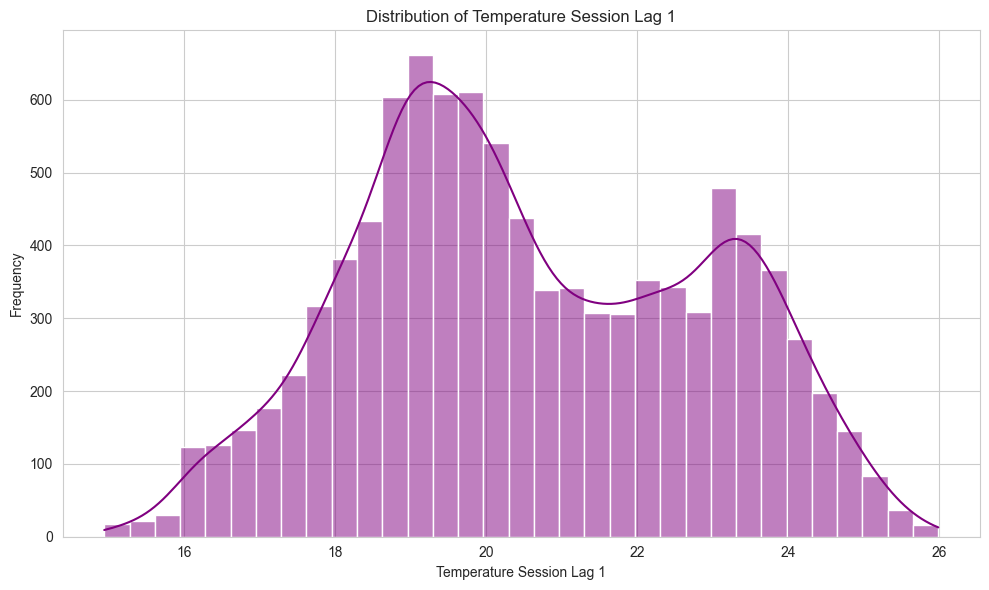

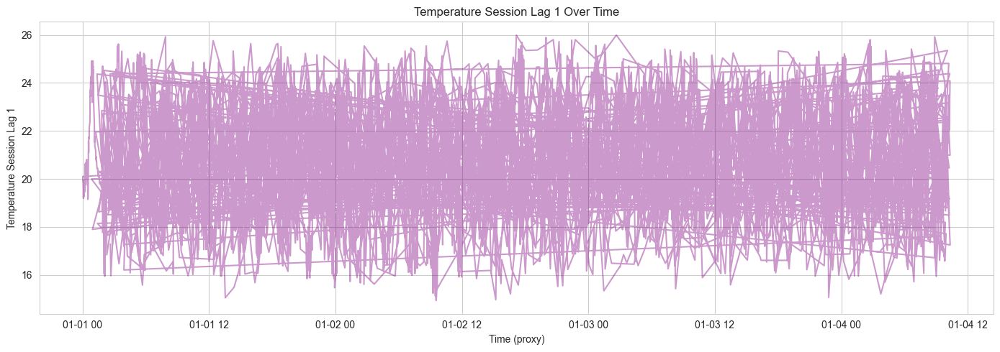


Spearman Correlation between 'Temperature Session Lag 1' and 'Activity_Level':
Correlation Coefficient: -0.2245
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Temperature_session_lag1 increases, activity level tends to slightly decrease.


In [25]:
# Temperature_session_lag1 analysis against Activity Level
analyze_numeric_ts_feature('Temperature_session_lag1', 'Temperature Session Lag 1')



Temperature_session_lag2 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Temperature_session_lag2,,,
"(14.939, 18.6]",811,930,224
"(18.6, 19.64]",935,739,274
"(19.64, 21.03]",1200,530,219
"(21.03, 23.03]",1317,460,182
"(23.03, 25.99]",1398,386,161



Analyzing the new 'Temperature_session_lag2' feature:


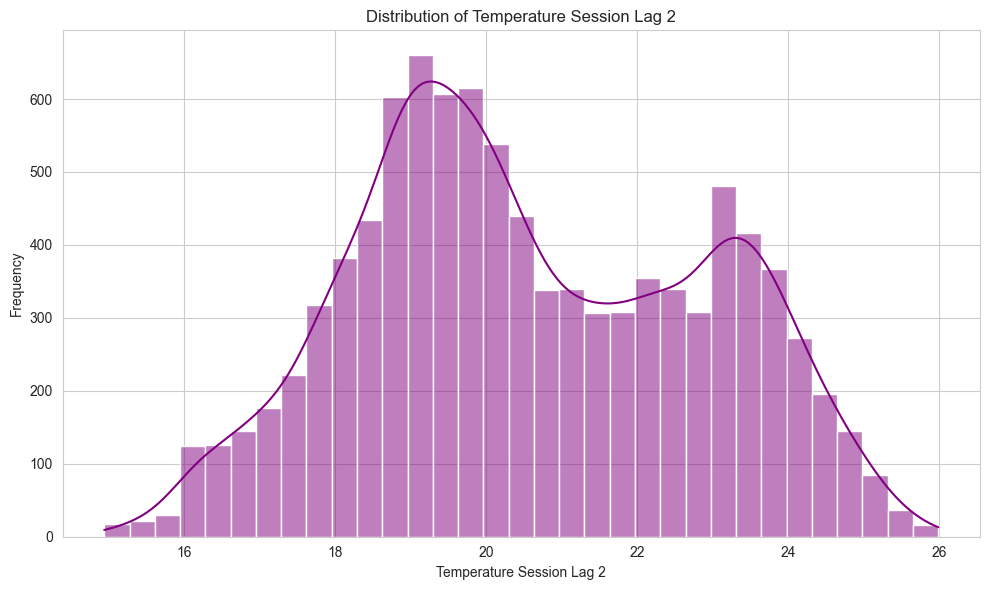

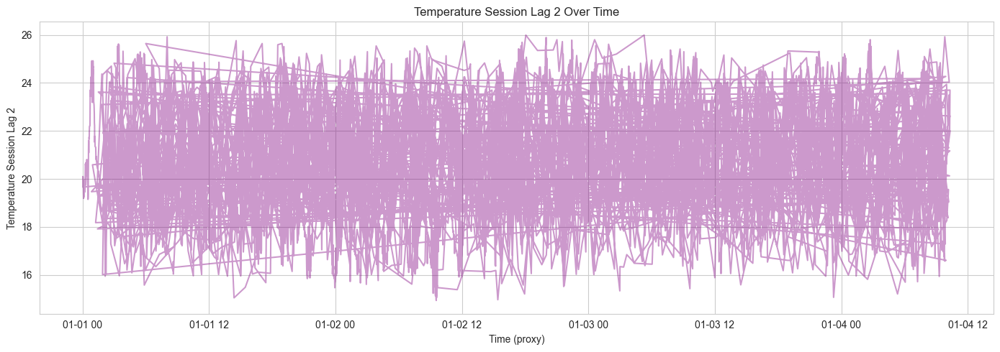


Spearman Correlation between 'Temperature Session Lag 2' and 'Activity_Level':
Correlation Coefficient: -0.2143
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Temperature_session_lag2 increases, activity level tends to slightly decrease.


In [26]:
# Temperature_session_lag2 analysis against Activity Level
analyze_numeric_ts_feature('Temperature_session_lag2', 'Temperature Session Lag 2')



Temperature_session_lag3 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Temperature_session_lag3,,,
"(14.939, 18.59]",798,942,215
"(18.59, 19.64]",978,724,259
"(19.64, 21.03]",1172,544,235
"(21.03, 23.03]",1318,439,198
"(23.03, 25.99]",1395,396,153



Analyzing the new 'Temperature_session_lag3' feature:


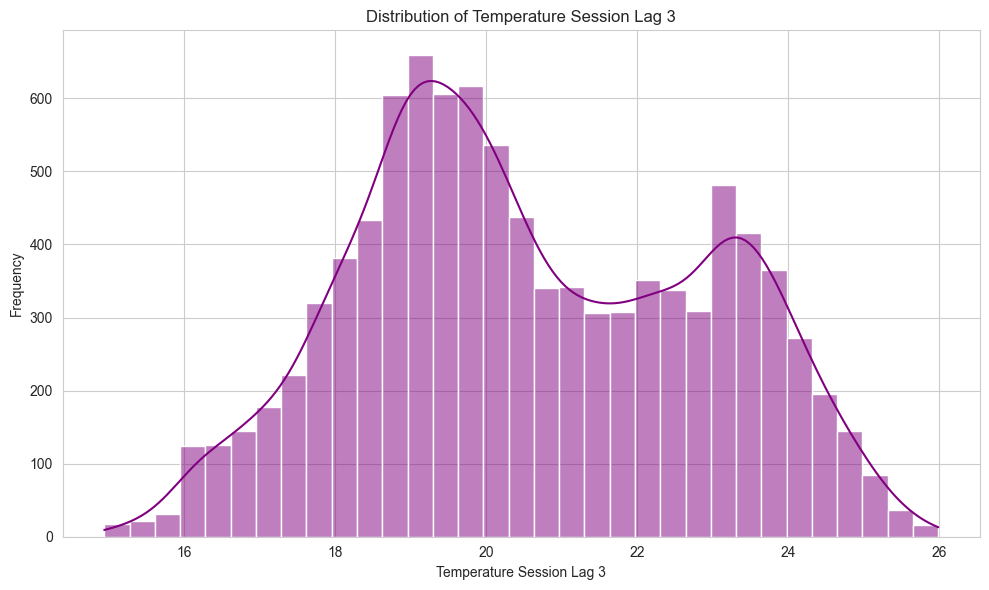

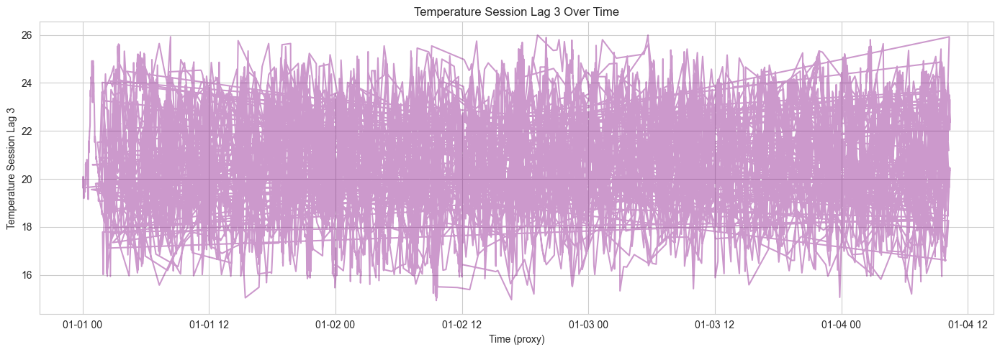


Spearman Correlation between 'Temperature Session Lag 3' and 'Activity_Level':
Correlation Coefficient: -0.2126
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Temperature_session_lag3 increases, activity level tends to slightly decrease.


In [27]:
# Temperature_session_lag3 analysis against Activity Level
analyze_numeric_ts_feature('Temperature_session_lag3', 'Temperature Session Lag 3')



Humidity_session_lag1 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Humidity_session_lag1,,,
"(31.009999999999998, 46.61]",893,821,240
"(46.61, 49.89]",1041,702,211
"(49.89, 52.2]",1200,548,209
"(52.2, 54.3]",1191,558,207
"(54.3, 69.97]",1336,416,193



Analyzing the new 'Humidity_session_lag1' feature:


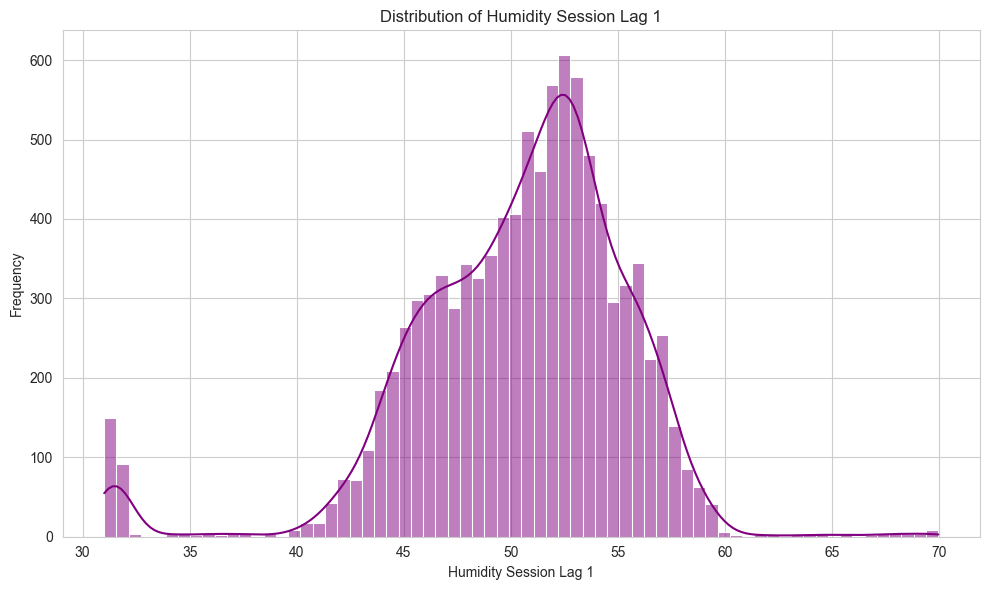

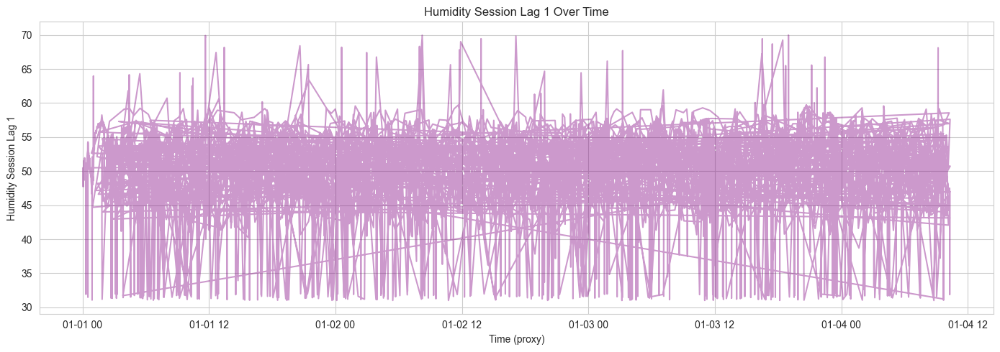


Spearman Correlation between 'Humidity Session Lag 1' and 'Activity_Level':
Correlation Coefficient: -0.1393
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Humidity_session_lag1 increases, activity level tends to slightly decrease.


In [28]:
# Humidity_session_lag1 analysis against Activity Level
analyze_numeric_ts_feature('Humidity_session_lag1', 'Humidity Session Lag 1')



Humidity_session_lag2 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Humidity_session_lag2,,,
"(31.009999999999998, 46.61]",884,836,239
"(46.61, 49.89]",1066,666,216
"(49.89, 52.2]",1176,566,216
"(52.2, 54.29]",1188,565,195
"(54.29, 69.97]",1347,412,194



Analyzing the new 'Humidity_session_lag2' feature:


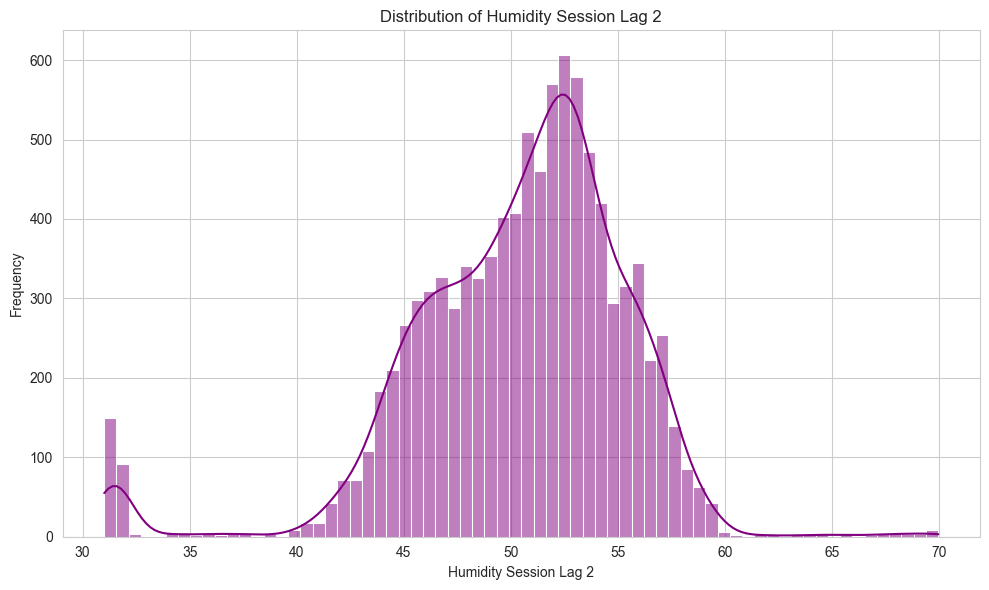

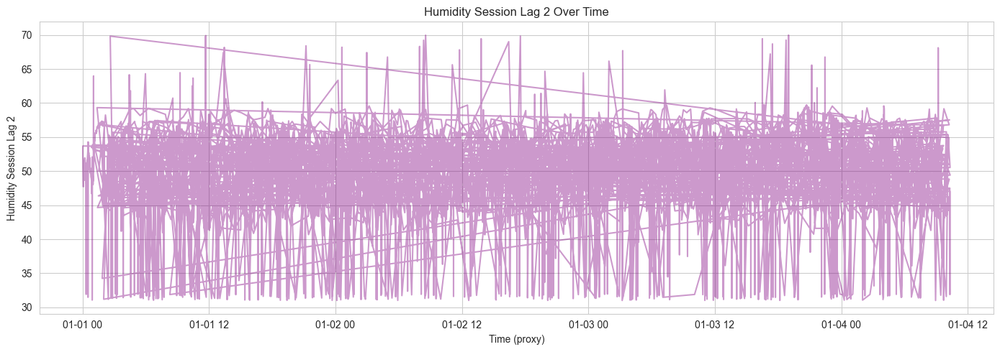


Spearman Correlation between 'Humidity Session Lag 2' and 'Activity_Level':
Correlation Coefficient: -0.1404
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Humidity_session_lag2 increases, activity level tends to slightly decrease.


In [29]:
# Humidity_session_lag2 analysis against Activity Level
analyze_numeric_ts_feature('Humidity_session_lag2', 'Humidity Session Lag 2')



Humidity_session_lag3 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Humidity_session_lag3,,,
"(31.009999999999998, 46.61]",883,838,236
"(46.61, 49.89]",1065,661,224
"(49.89, 52.2]",1194,563,197
"(52.2, 54.3]",1181,572,208
"(54.3, 69.97]",1338,411,195



Analyzing the new 'Humidity_session_lag3' feature:


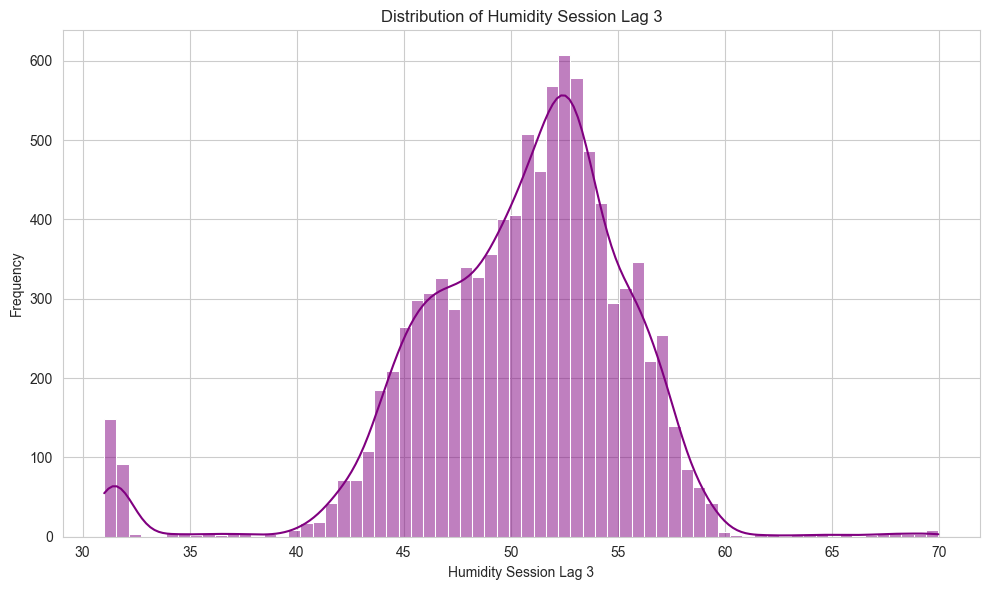

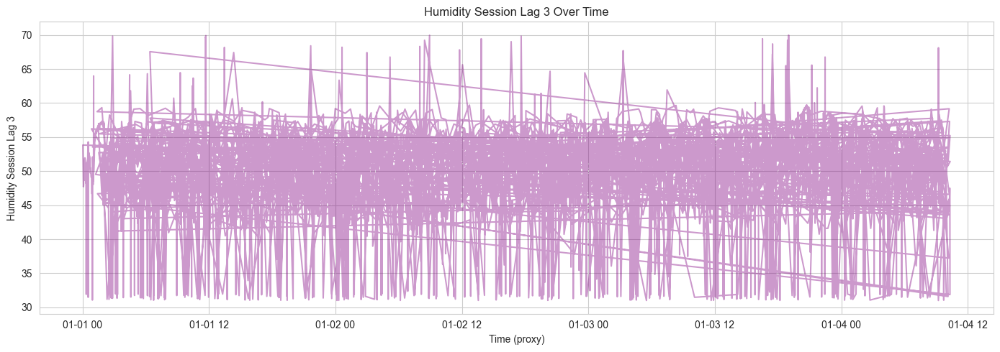


Spearman Correlation between 'Humidity Session Lag 3' and 'Activity_Level':
Correlation Coefficient: -0.1364
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Humidity_session_lag3 increases, activity level tends to slightly decrease.


In [30]:
# Humidity_session_lag3 analysis against Activity Level
analyze_numeric_ts_feature('Humidity_session_lag3', 'Humidity Session Lag 3')



CO2_InfraredSensor_session_lag1 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
CO2_InfraredSensor_session_lag1,,,
"(435.329, 542.83]",810,939,205
"(542.83, 558.71]",1017,664,272
"(558.71, 567.44]",1102,577,276
"(567.44, 576.72]",1244,521,186
"(576.72, 686.01]",1488,344,121



Analyzing the new 'CO2_InfraredSensor_session_lag1' feature:


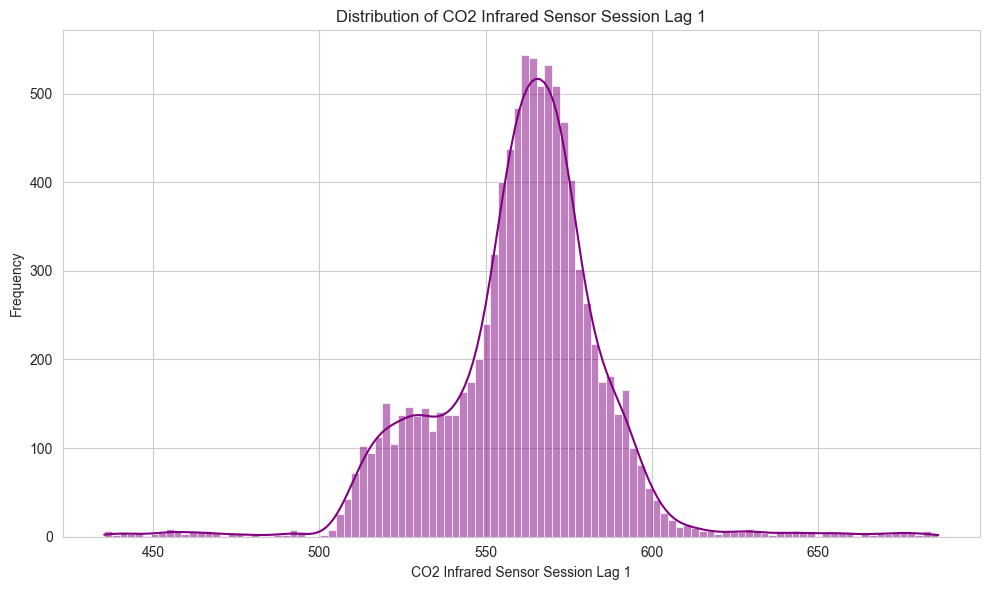

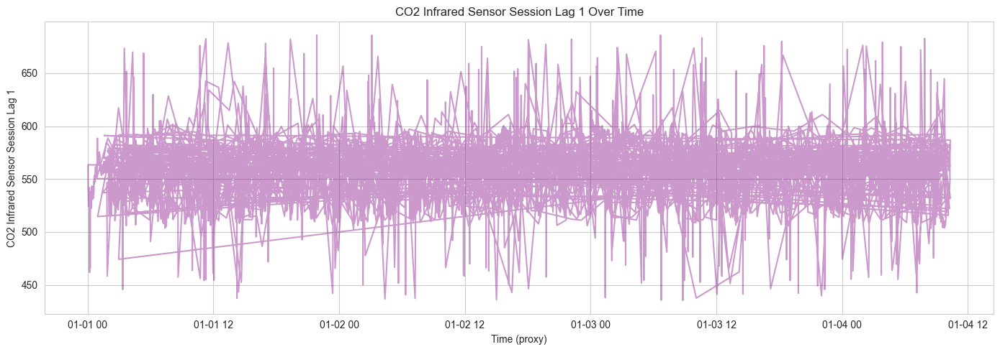


Spearman Correlation between 'CO2 Infrared Sensor Session Lag 1' and 'Activity_Level':
Correlation Coefficient: -0.2180
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As CO2_InfraredSensor_session_lag1 increases, activity level tends to slightly decrease.


In [31]:
# CO2_InfraredSensor_session_lag1 analysis against Activity Level
analyze_numeric_ts_feature('CO2_InfraredSensor_session_lag1', 'CO2 Infrared Sensor Session Lag 1')



CO2_InfraredSensor_session_lag2 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
CO2_InfraredSensor_session_lag2,,,
"(435.329, 542.88]",835,916,203
"(542.88, 558.74]",1021,684,251
"(558.74, 567.44]",1102,605,245
"(567.44, 576.72]",1225,512,214
"(576.72, 686.01]",1478,328,147



Analyzing the new 'CO2_InfraredSensor_session_lag2' feature:


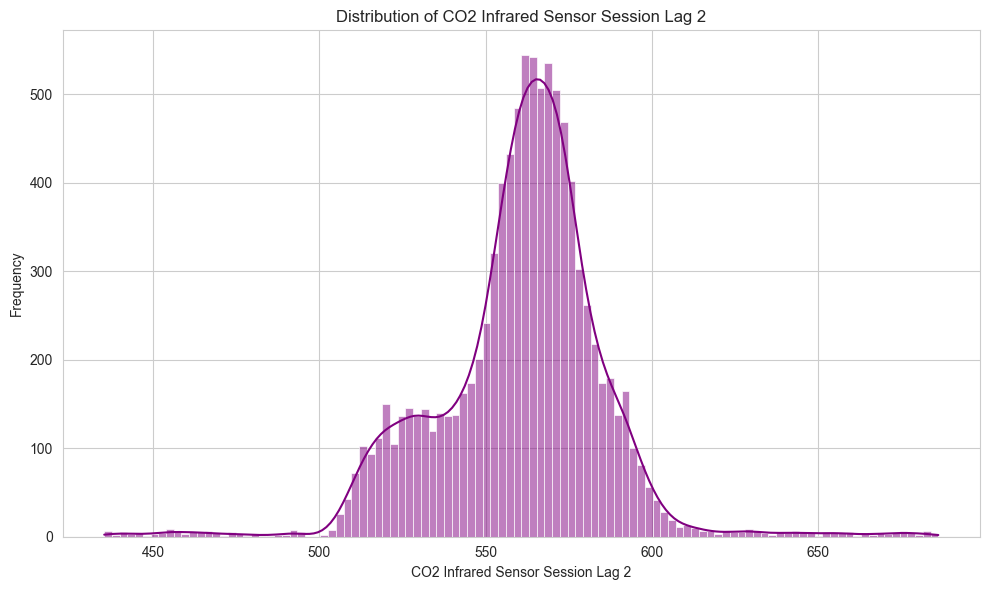

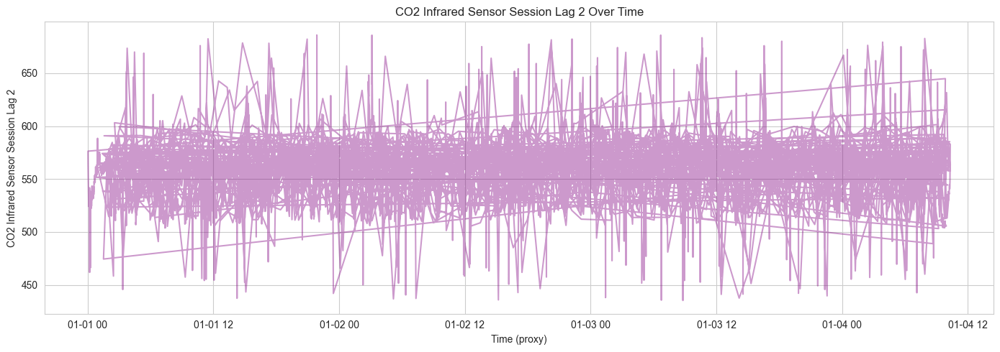


Spearman Correlation between 'CO2 Infrared Sensor Session Lag 2' and 'Activity_Level':
Correlation Coefficient: -0.1978
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As CO2_InfraredSensor_session_lag2 increases, activity level tends to slightly decrease.


In [32]:
# CO2_InfraredSensor_session_lag2 analysis against Activity Level
analyze_numeric_ts_feature('CO2_InfraredSensor_session_lag2', 'CO2 Infrared Sensor Session Lag 2')



CO2_InfraredSensor_session_lag3 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
CO2_InfraredSensor_session_lag3,,,
"(435.329, 542.96]",841,904,210
"(542.96, 558.74]",1024,664,265
"(558.74, 567.44]",1115,594,246
"(567.44, 576.72]",1208,548,197
"(576.72, 686.01]",1473,335,142



Analyzing the new 'CO2_InfraredSensor_session_lag3' feature:


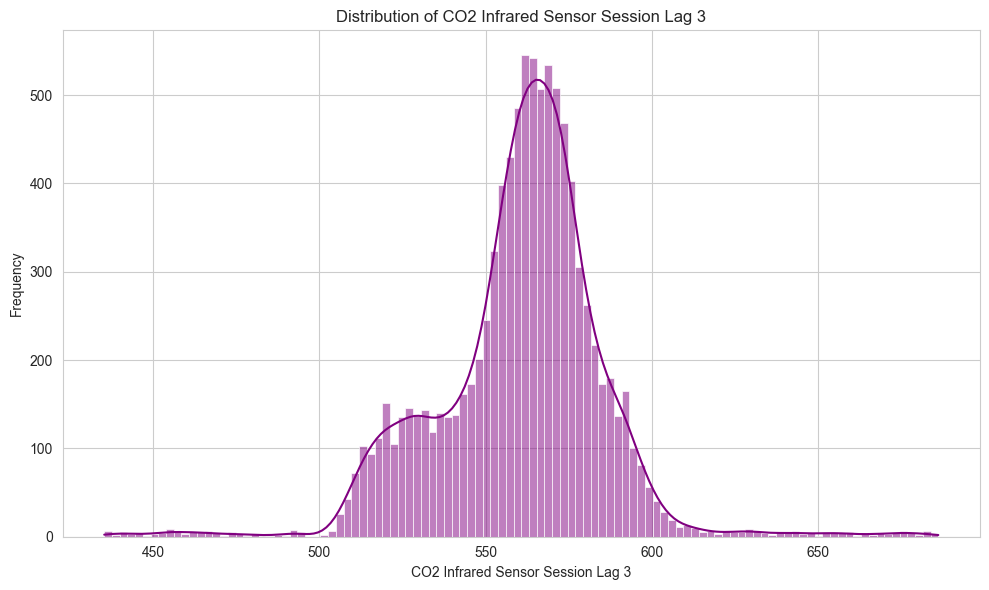

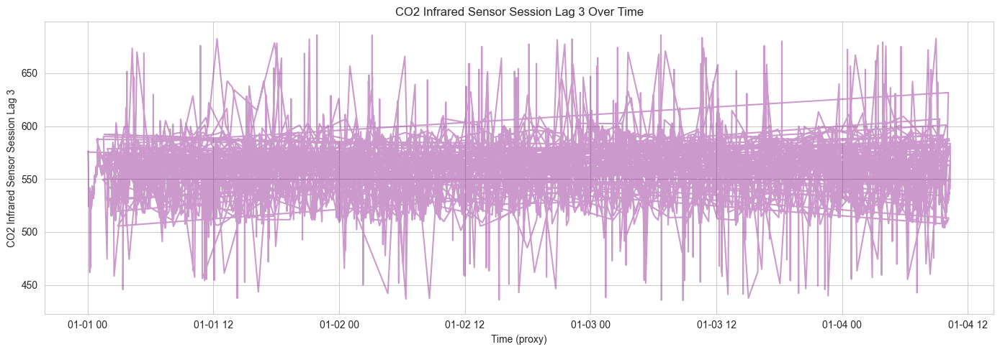


Spearman Correlation between 'CO2 Infrared Sensor Session Lag 3' and 'Activity_Level':
Correlation Coefficient: -0.1960
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As CO2_InfraredSensor_session_lag3 increases, activity level tends to slightly decrease.


In [33]:
# CO2_InfraredSensor_session_lag3 analysis against Activity Level
analyze_numeric_ts_feature('CO2_InfraredSensor_session_lag3', 'CO2 Infrared Sensor Session Lag 3')



MetalOxideSensor_Unit1_session_lag1 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit1_session_lag1,,,
"(286.829, 431.75]",1444,377,133
"(431.75, 458.63]",1224,511,218
"(458.63, 478.39]",1142,564,247
"(478.39, 501.52]",1015,688,250
"(501.52, 632.89]",836,905,212



Analyzing the new 'MetalOxideSensor_Unit1_session_lag1' feature:


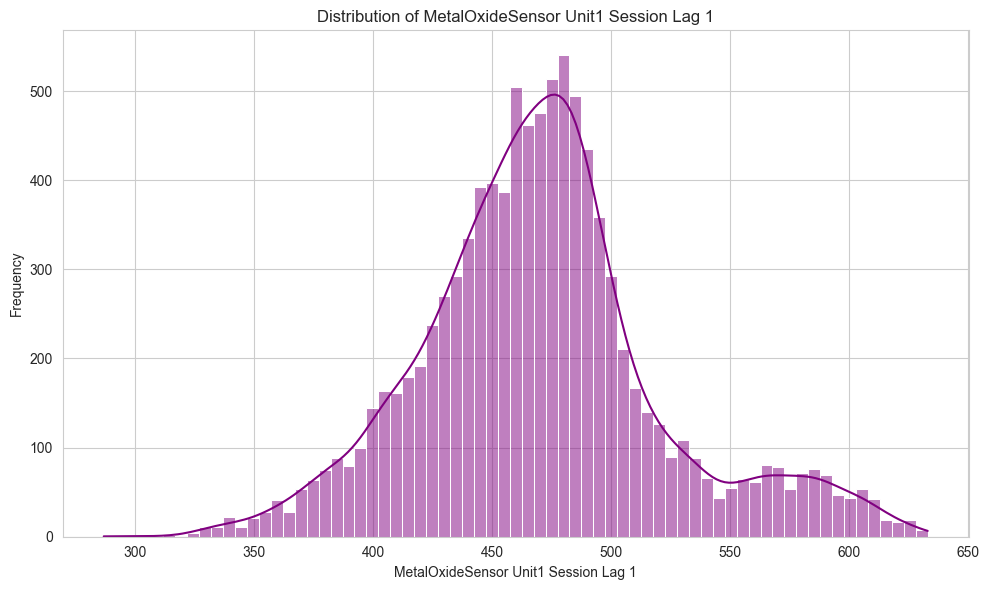

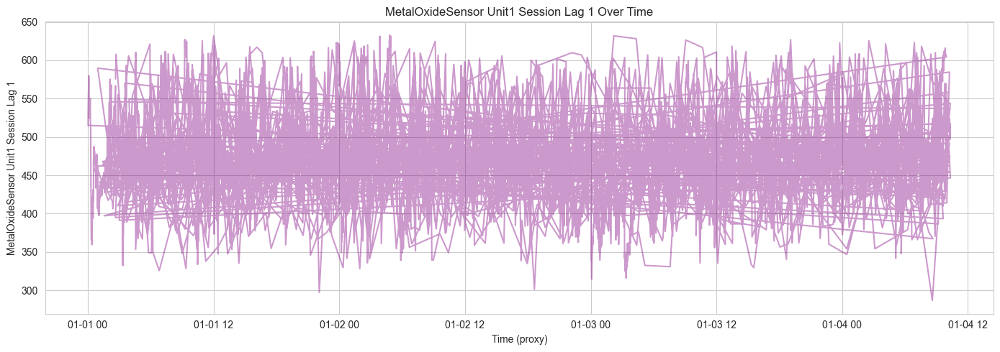


Spearman Correlation between 'MetalOxideSensor Unit1 Session Lag 1' and 'Activity_Level':
Correlation Coefficient: 0.1975
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit1_session_lag1 increases, activity level tends to slightly increase.


In [34]:
# MetalOxideSensor_Unit1_session_lag1 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit1_session_lag1', 'MetalOxideSensor Unit1 Session Lag 1')



MetalOxideSensor_Unit1_session_lag2 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit1_session_lag2,,,
"(286.829, 431.79]",1424,386,144
"(431.79, 458.65]",1216,530,208
"(458.65, 478.45]",1109,595,249
"(478.45, 501.51]",1067,633,253
"(501.51, 632.89]",845,901,206



Analyzing the new 'MetalOxideSensor_Unit1_session_lag2' feature:


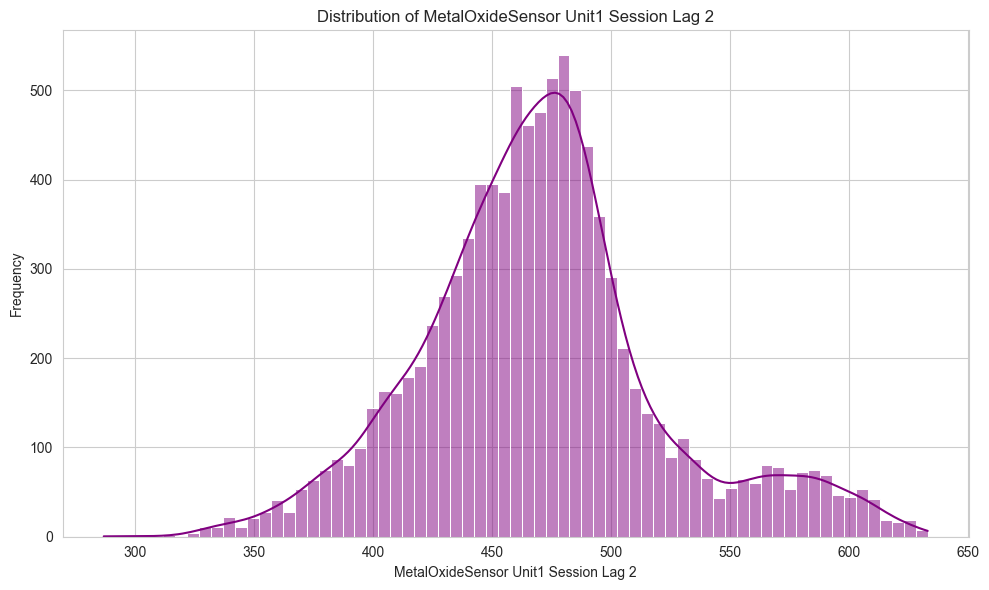

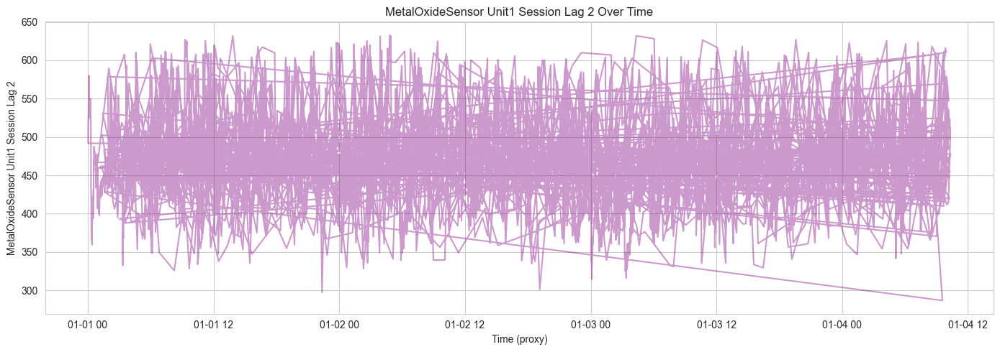


Spearman Correlation between 'MetalOxideSensor Unit1 Session Lag 2' and 'Activity_Level':
Correlation Coefficient: 0.1819
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit1_session_lag2 increases, activity level tends to slightly increase.


In [35]:
# MetalOxideSensor_Unit1_session_lag2 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit1_session_lag2', 'MetalOxideSensor Unit1 Session Lag 2')



MetalOxideSensor_Unit1_session_lag3 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit1_session_lag3,,,
"(297.269, 431.84]",1436,361,157
"(431.84, 458.7]",1172,551,230
"(458.7, 478.46]",1148,579,226
"(478.46, 501.51]",1056,642,256
"(501.51, 632.89]",849,912,191



Analyzing the new 'MetalOxideSensor_Unit1_session_lag3' feature:


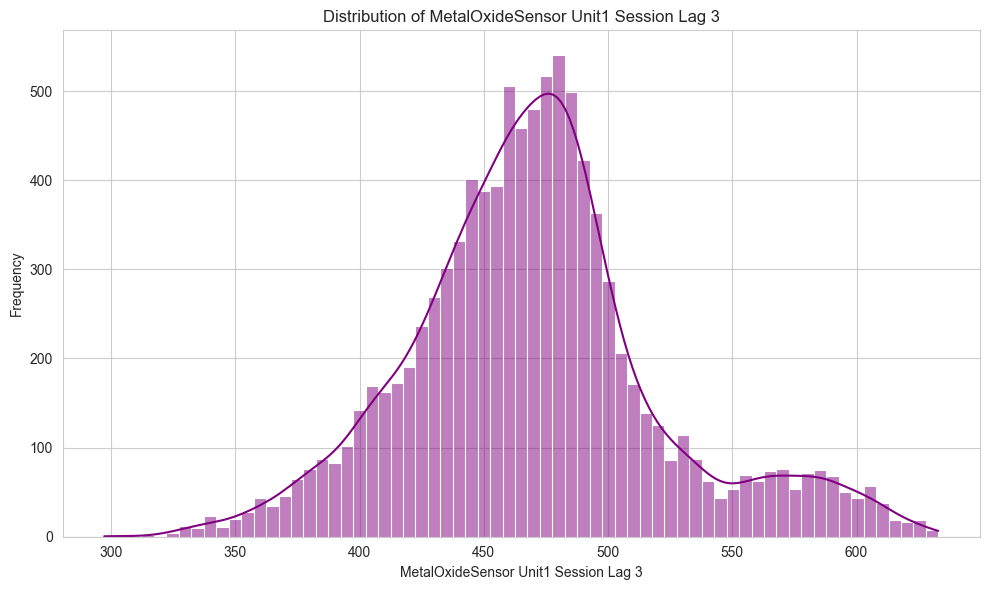

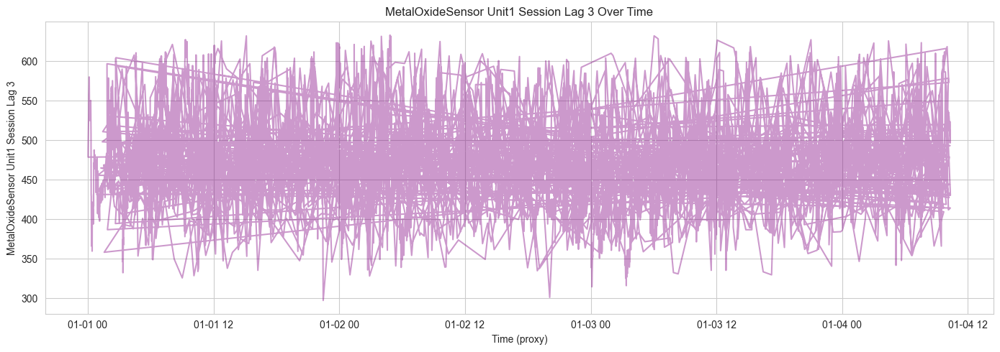


Spearman Correlation between 'MetalOxideSensor Unit1 Session Lag 3' and 'Activity_Level':
Correlation Coefficient: 0.1739
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit1_session_lag3 increases, activity level tends to slightly increase.


In [36]:
# MetalOxideSensor_Unit1_session_lag3 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit1_session_lag3', 'MetalOxideSensor Unit1 Session Lag 3')



MetalOxideSensor_Unit2_session_lag1 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit2_session_lag1,,,
"(554.279, 703.47]",1573,292,90
"(703.47, 719.6]",1488,329,136
"(719.6, 733.5]",1026,648,278
"(733.5, 752.45]",744,859,350
"(752.45, 902.21]",830,917,206



Analyzing the new 'MetalOxideSensor_Unit2_session_lag1' feature:


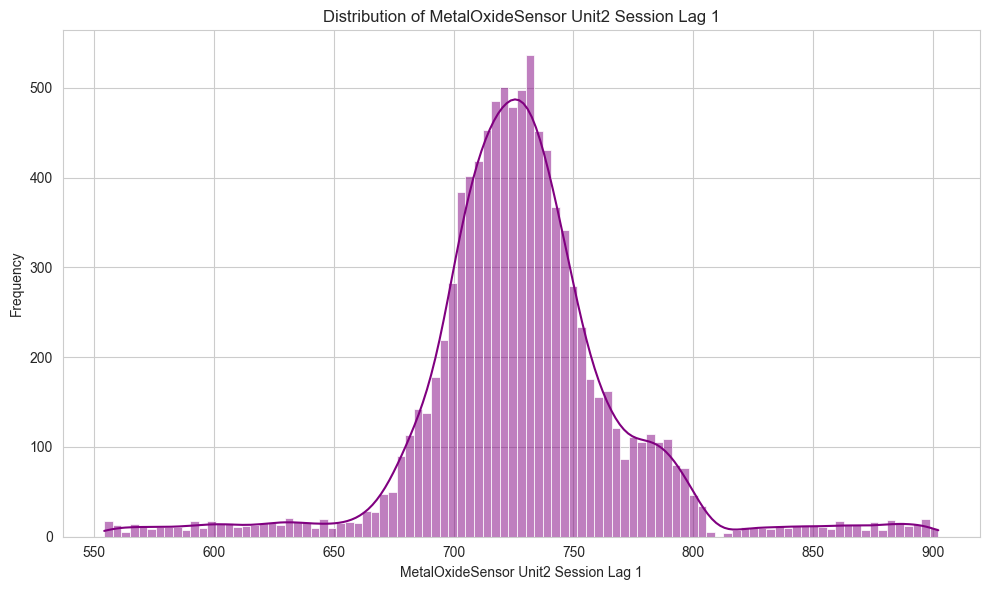

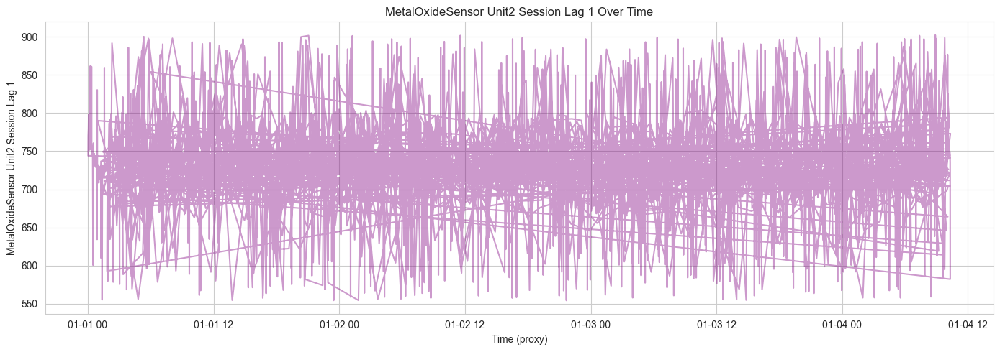


Spearman Correlation between 'MetalOxideSensor Unit2 Session Lag 1' and 'Activity_Level':
Correlation Coefficient: 0.3065
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit2_session_lag1 increases, activity level tends to slightly increase.


In [37]:
# MetalOxideSensor_Unit2_session_lag1 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit2_session_lag1', 'MetalOxideSensor Unit2 Session Lag 1')



MetalOxideSensor_Unit2_session_lag2 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit2_session_lag2,,,
"(554.279, 703.47]",1567,297,91
"(703.47, 719.6]",1470,339,143
"(719.6, 733.5]",997,658,298
"(733.5, 752.44]",773,855,325
"(752.44, 902.21]",854,896,203



Analyzing the new 'MetalOxideSensor_Unit2_session_lag2' feature:


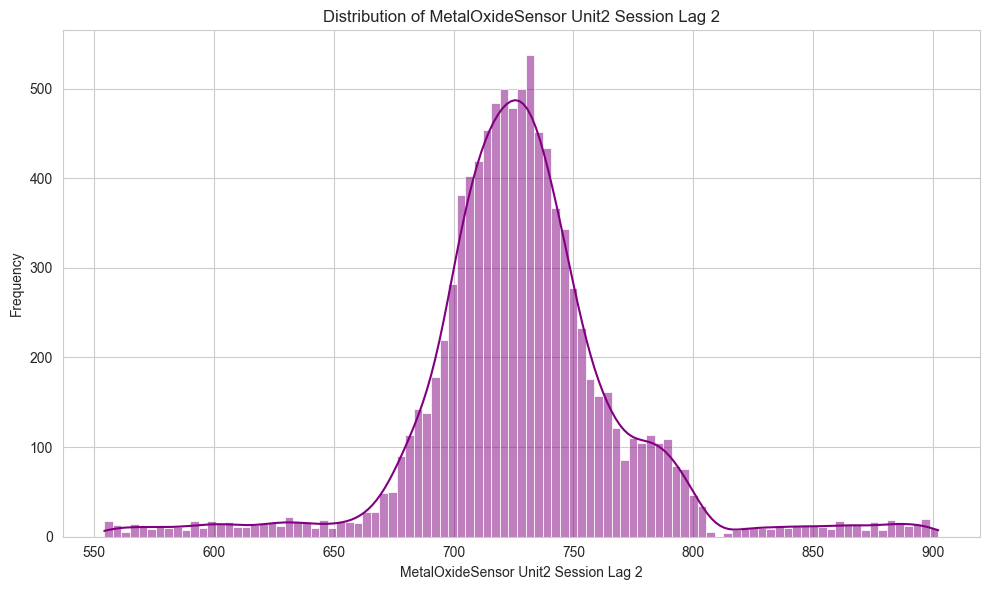

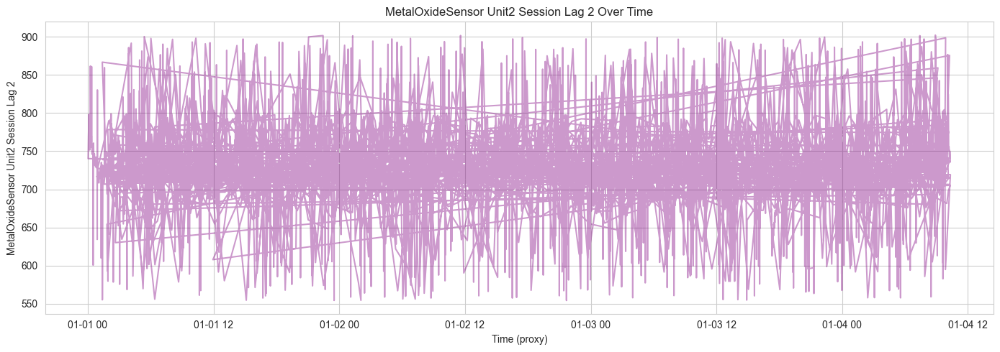


Spearman Correlation between 'MetalOxideSensor Unit2 Session Lag 2' and 'Activity_Level':
Correlation Coefficient: 0.2917
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit2_session_lag2 increases, activity level tends to slightly increase.


In [38]:
# MetalOxideSensor_Unit2_session_lag2 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit2_session_lag2', 'MetalOxideSensor Unit2 Session Lag 2')



MetalOxideSensor_Unit2_session_lag3 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit2_session_lag3,,,
"(554.279, 703.42]",1544,300,110
"(703.42, 719.6]",1451,366,138
"(719.6, 733.5]",1014,635,302
"(733.5, 752.44]",815,832,306
"(752.44, 902.21]",837,912,204



Analyzing the new 'MetalOxideSensor_Unit2_session_lag3' feature:


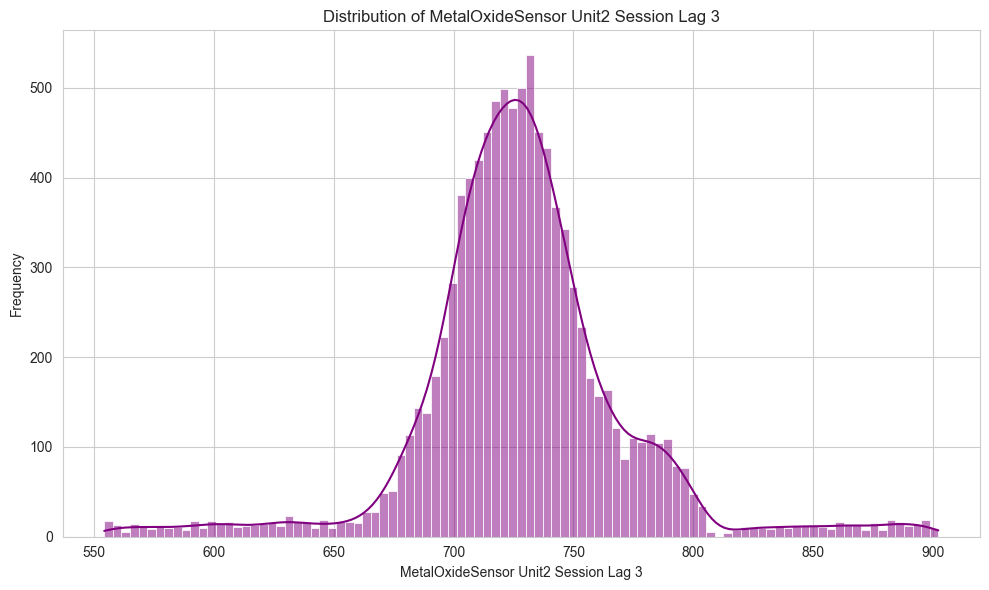

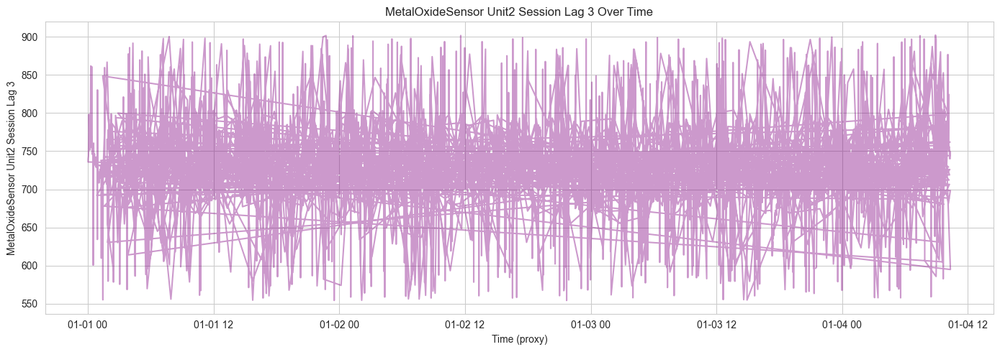


Spearman Correlation between 'MetalOxideSensor Unit2 Session Lag 3' and 'Activity_Level':
Correlation Coefficient: 0.2785
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit2_session_lag3 increases, activity level tends to slightly increase.


In [39]:
# MetalOxideSensor_Unit2_session_lag3 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit2_session_lag3', 'MetalOxideSensor Unit2 Session Lag 3')



Temperature_session_roll_mean_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Temperature_session_roll_mean_5,,,
"(15.151, 18.928]",779,940,237
"(18.928, 19.902]",933,762,256
"(19.902, 20.956]",1129,583,241
"(20.956, 22.368]",1323,435,196
"(22.368, 25.64]",1497,325,130



Analyzing the new 'Temperature_session_roll_mean_5' feature:


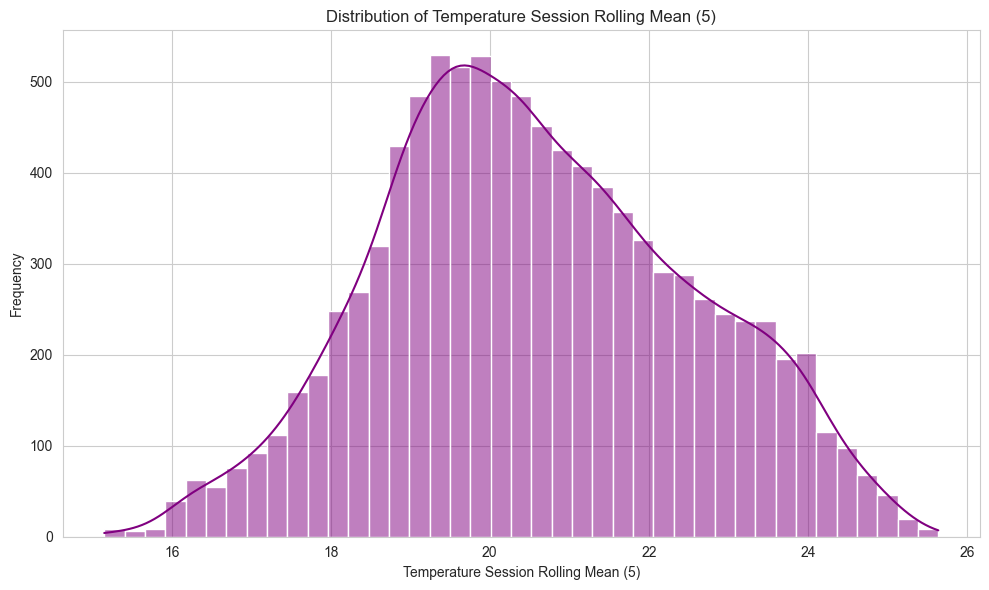

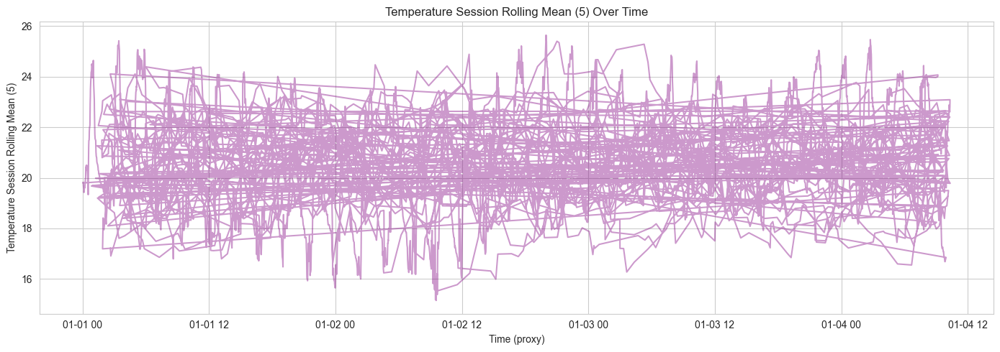


Spearman Correlation between 'Temperature Session Rolling Mean (5)' and 'Activity_Level':
Correlation Coefficient: -0.2554
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Temperature_session_roll_mean_5 increases, activity level tends to slightly decrease.


In [40]:
# Temperature_session_roll_mean_5 analysis against Activity Level
analyze_numeric_ts_feature('Temperature_session_roll_mean_5', 'Temperature Session Rolling Mean (5)')



Temperature_session_roll_std_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Temperature_session_roll_std_5,,,
"(0.00794, 0.132]",1082,624,248
"(0.132, 0.303]",1157,592,204
"(0.303, 0.877]",1182,580,191
"(0.877, 1.999]",1236,532,185
"(1.999, 4.033]",1004,717,232



Analyzing the new 'Temperature_session_roll_std_5' feature:


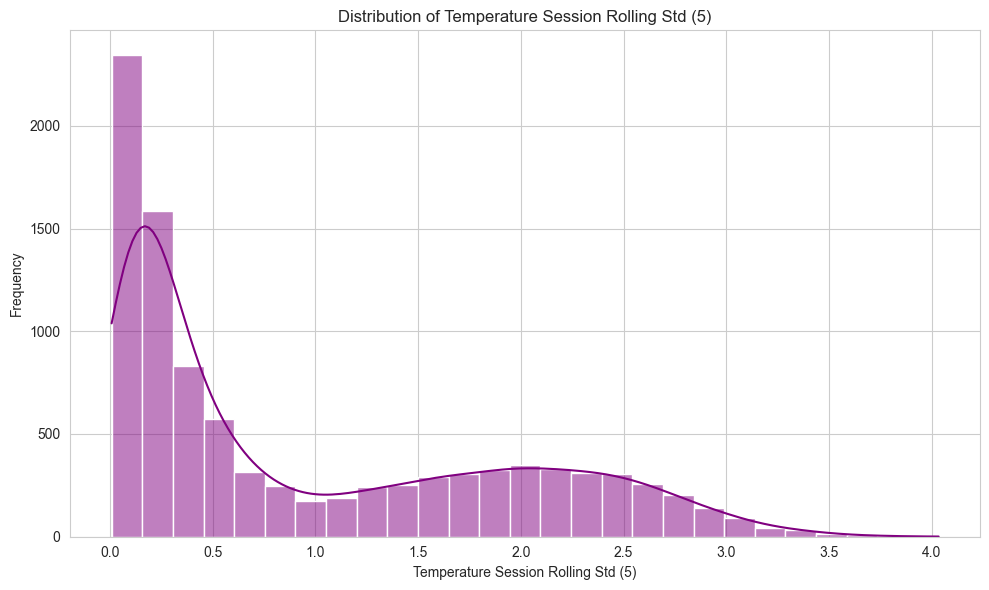

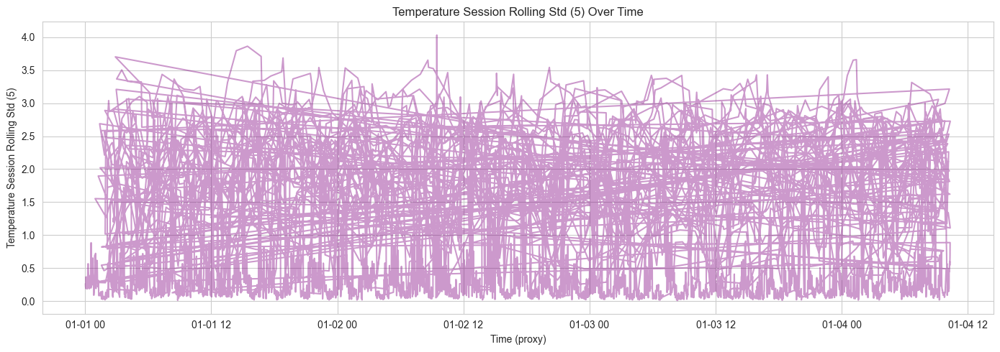


Spearman Correlation between 'Temperature Session Rolling Std (5)' and 'Activity_Level':
Correlation Coefficient: 0.0077
P-value: 0.4492

The correlation is not statistically significant (p-value >= 0.05).


In [41]:
# Temperature_session_roll_std_5 analysis against Activity Level
analyze_numeric_ts_feature('Temperature_session_roll_std_5', 'Temperature Session Rolling Std (5)')



Temperature_session_roll_mean_10 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Temperature_session_roll_mean_10,,,
"(15.178, 18.991]",766,945,243
"(18.991, 19.935]",933,760,260
"(19.935, 20.941]",1119,604,230
"(20.941, 22.259]",1337,430,186
"(22.259, 25.322]",1506,306,141



Analyzing the new 'Temperature_session_roll_mean_10' feature:


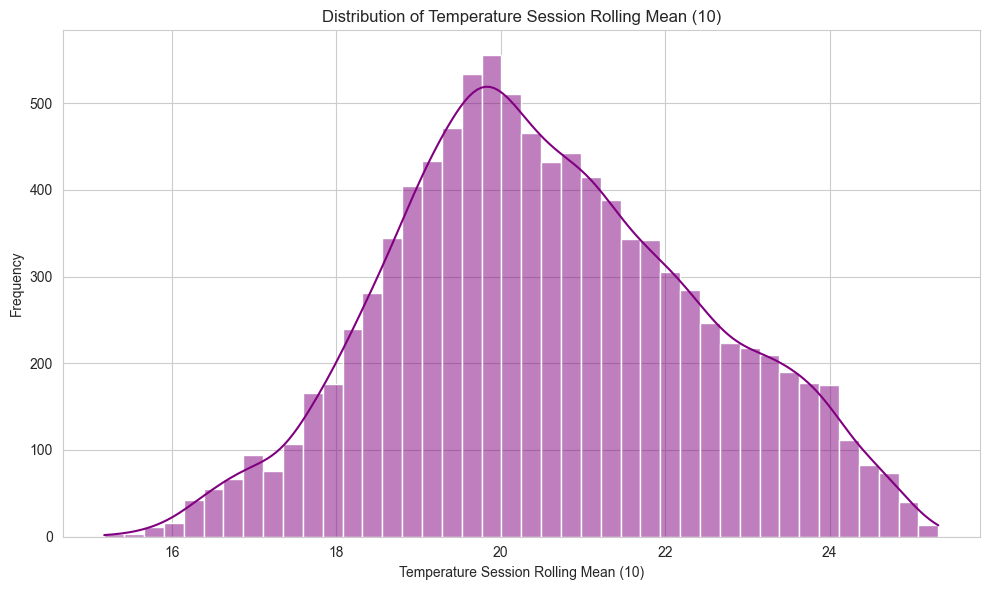

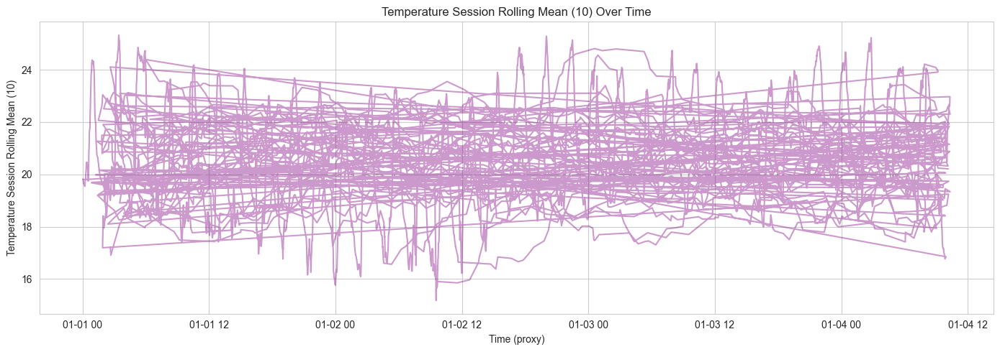


Spearman Correlation between 'Temperature Session Rolling Mean (10)' and 'Activity_Level':
Correlation Coefficient: -0.2619
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Temperature_session_roll_mean_10 increases, activity level tends to slightly decrease.


In [42]:
# Temperature_session_roll_mean_10 analysis against Activity Level
analyze_numeric_ts_feature('Temperature_session_roll_mean_10', 'Temperature Session Rolling Mean (10)')



Humidity_session_roll_mean_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Humidity_session_roll_mean_5,,,
"(39.217000000000006, 47.058]",900,817,237
"(47.058, 49.594]",1001,733,219
"(49.594, 51.562]",1178,566,210
"(51.562, 53.56]",1230,536,186
"(53.56, 59.738]",1352,393,208



Analyzing the new 'Humidity_session_roll_mean_5' feature:


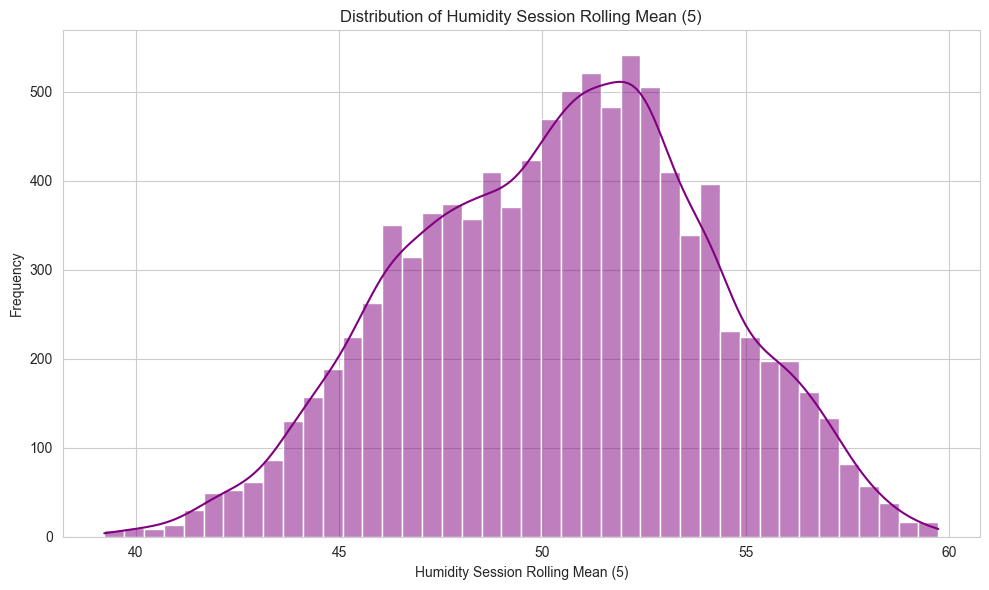

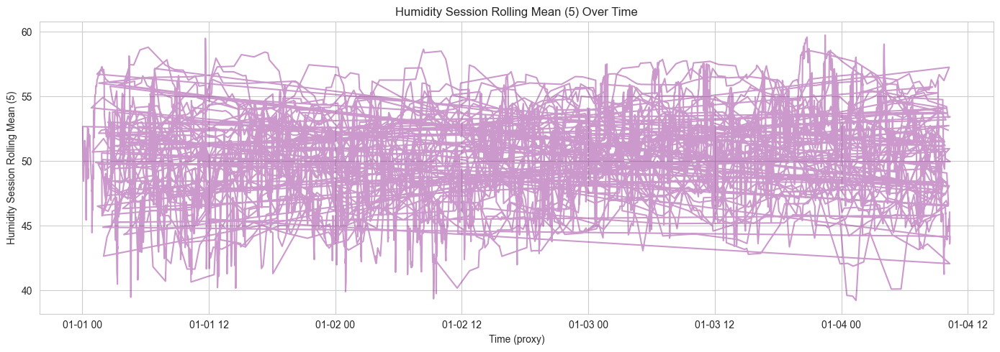


Spearman Correlation between 'Humidity Session Rolling Mean (5)' and 'Activity_Level':
Correlation Coefficient: -0.1539
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Humidity_session_roll_mean_5 increases, activity level tends to slightly decrease.


In [43]:
# Humidity_session_roll_mean_5 analysis against Activity Level
analyze_numeric_ts_feature('Humidity_session_roll_mean_5', 'Humidity Session Rolling Mean (5)')



Humidity_session_roll_std_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Humidity_session_roll_std_5,,,
"(0.0218, 0.379]",1110,587,257
"(0.379, 1.022]",1161,597,195
"(1.022, 2.414]",1215,555,183
"(2.414, 4.274]",1047,692,214
"(4.274, 15.983]",1128,614,211



Analyzing the new 'Humidity_session_roll_std_5' feature:


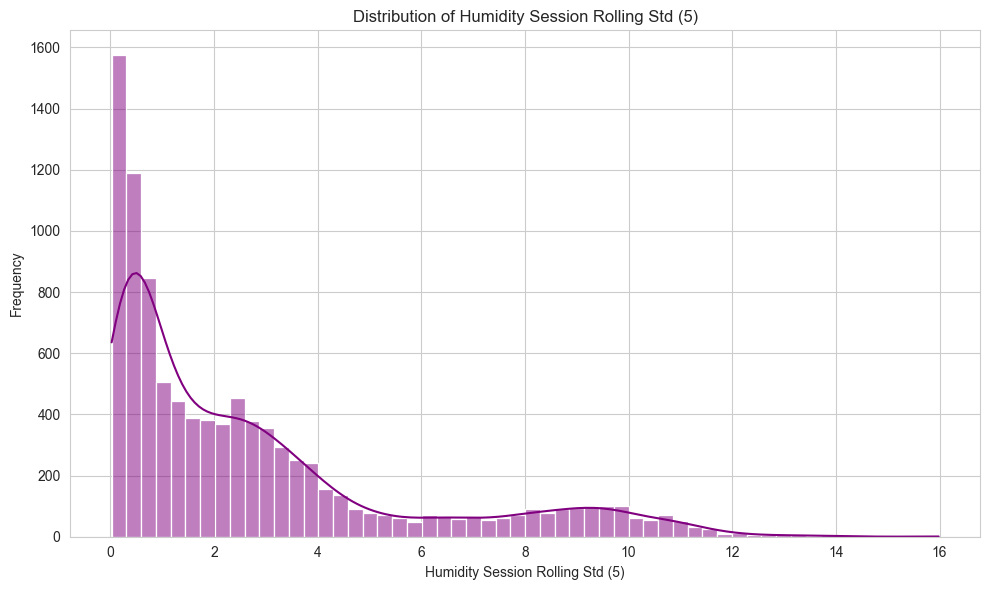

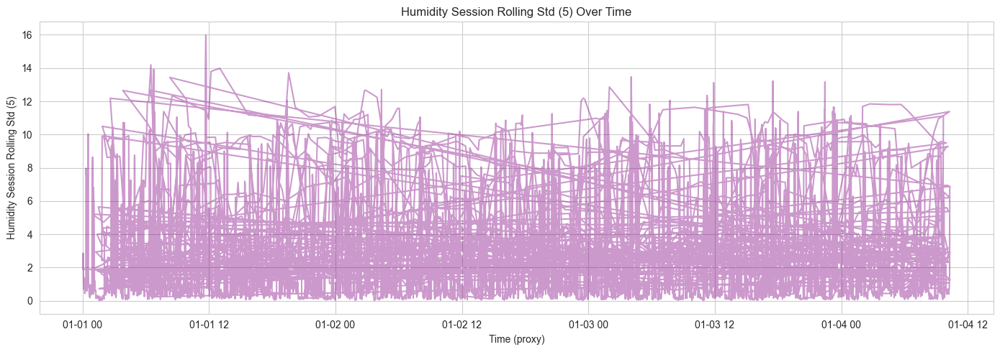


Spearman Correlation between 'Humidity Session Rolling Std (5)' and 'Activity_Level':
Correlation Coefficient: 0.0012
P-value: 0.9020

The correlation is not statistically significant (p-value >= 0.05).


In [44]:
# Humidity_session_roll_std_5 analysis against Activity Level
analyze_numeric_ts_feature('Humidity_session_roll_std_5', 'Humidity Session Rolling Std (5)')



Humidity_session_roll_mean_10 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
Humidity_session_roll_mean_10,,,
"(40.924, 47.293]",873,835,246
"(47.293, 49.68]",1050,695,208
"(49.68, 51.412]",1142,599,212
"(51.412, 53.265]",1225,533,195
"(53.265, 59.469]",1371,383,199



Analyzing the new 'Humidity_session_roll_mean_10' feature:


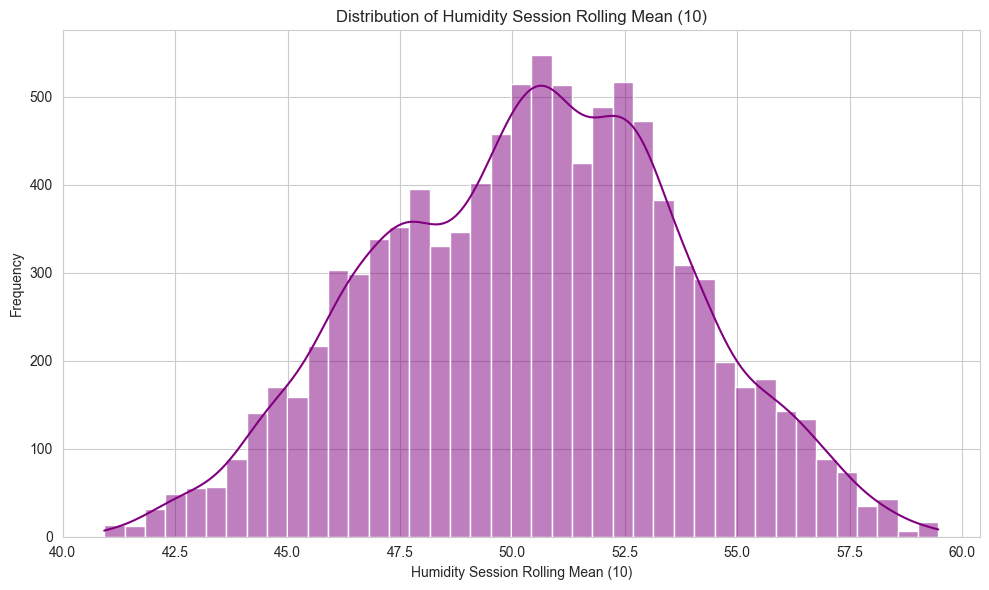

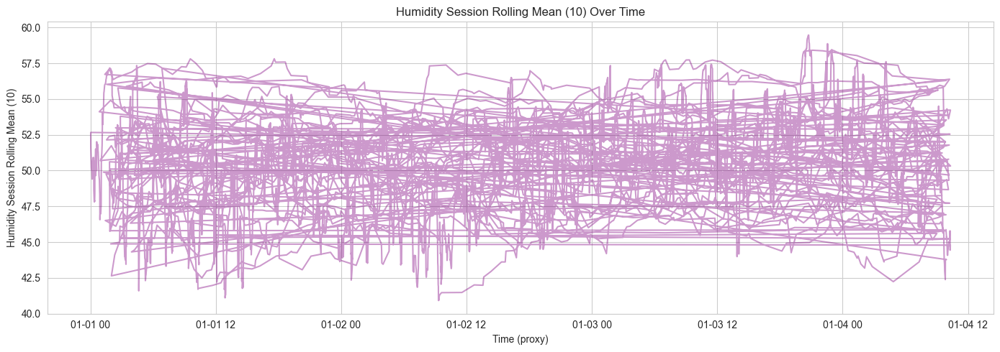


Spearman Correlation between 'Humidity Session Rolling Mean (10)' and 'Activity_Level':
Correlation Coefficient: -0.1581
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As Humidity_session_roll_mean_10 increases, activity level tends to slightly decrease.


In [45]:
# Humidity_session_roll_mean_10 analysis against Activity Level
analyze_numeric_ts_feature('Humidity_session_roll_mean_10', 'Humidity Session Rolling Mean (10)')



CO2_InfraredSensor_session_roll_mean_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
CO2_InfraredSensor_session_roll_mean_5,,,
"(495.21700000000004, 544.784]",789,945,220
"(544.784, 557.342]",990,709,254
"(557.342, 566.126]",1132,578,243
"(566.126, 575.712]",1267,492,194
"(575.712, 642.696]",1483,321,149



Analyzing the new 'CO2_InfraredSensor_session_roll_mean_5' feature:


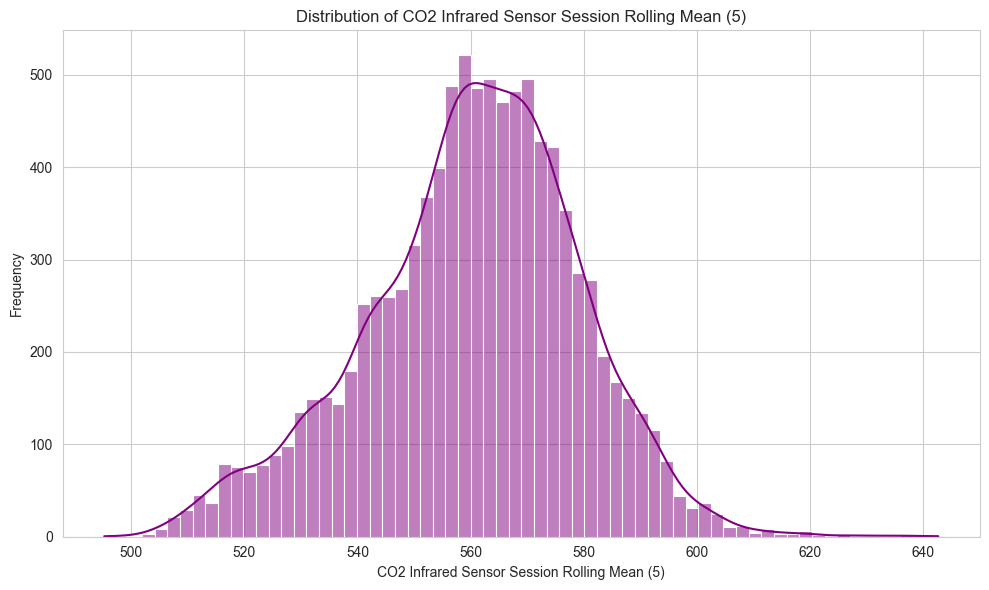

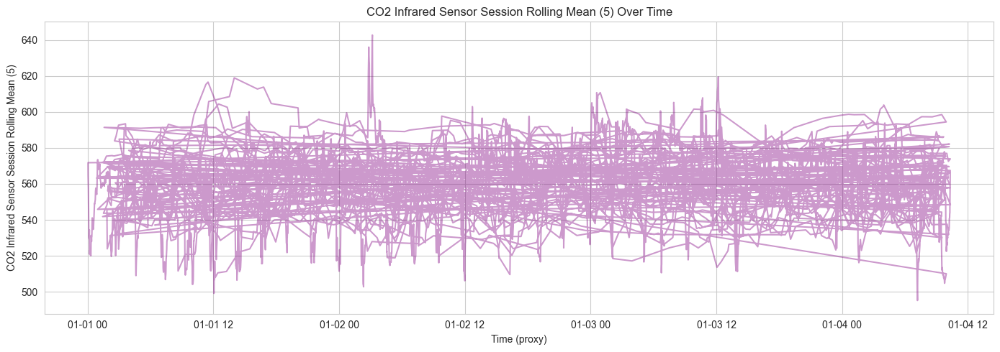


Spearman Correlation between 'CO2 Infrared Sensor Session Rolling Mean (5)' and 'Activity_Level':
Correlation Coefficient: -0.2247
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As CO2_InfraredSensor_session_roll_mean_5 increases, activity level tends to slightly decrease.


In [46]:
# CO2_InfraredSensor_session_roll_mean_5 analysis against Activity Level
analyze_numeric_ts_feature('CO2_InfraredSensor_session_roll_mean_5', 'CO2 Infrared Sensor Session Rolling Mean (5)')



CO2_InfraredSensor_session_roll_std_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
CO2_InfraredSensor_session_roll_std_5,,,
"(0.469, 3.061]",1175,568,211
"(3.061, 4.652]",1180,564,209
"(4.652, 9.534]",1140,597,216
"(9.534, 21.298]",1099,649,205
"(21.298, 75.922]",1067,667,219



Analyzing the new 'CO2_InfraredSensor_session_roll_std_5' feature:


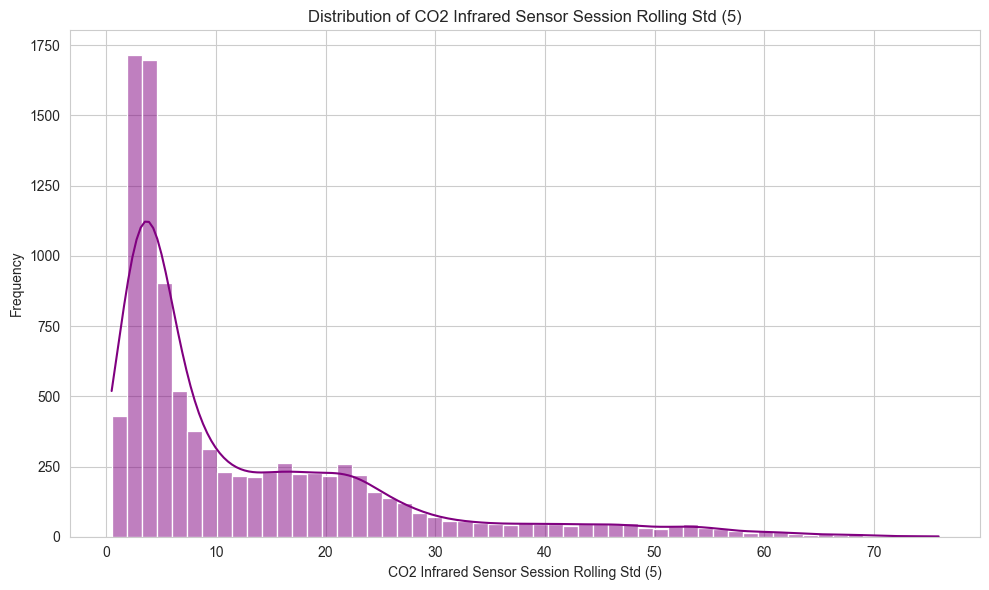

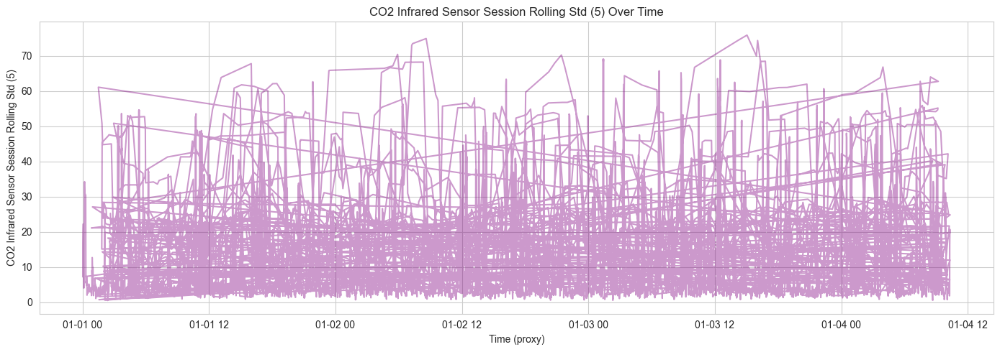


Spearman Correlation between 'CO2 Infrared Sensor Session Rolling Std (5)' and 'Activity_Level':
Correlation Coefficient: 0.0387
P-value: 0.0001

The correlation is statistically significant.
Interpretation: The correlation is very weak. The relationship between the two variables is not strong.


In [47]:
# CO2_InfraredSensor_session_roll_std_5 analysis against Activity Level
analyze_numeric_ts_feature('CO2_InfraredSensor_session_roll_std_5', 'CO2 Infrared Sensor Session Rolling Std (5)')



CO2_InfraredSensor_session_roll_mean_10 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
CO2_InfraredSensor_session_roll_mean_10,,,
"(504.08200000000005, 546.343]",793,935,226
"(546.343, 557.517]",1000,711,242
"(557.517, 565.387]",1100,607,246
"(565.387, 574.835]",1269,466,218
"(574.835, 625.826]",1499,326,128



Analyzing the new 'CO2_InfraredSensor_session_roll_mean_10' feature:


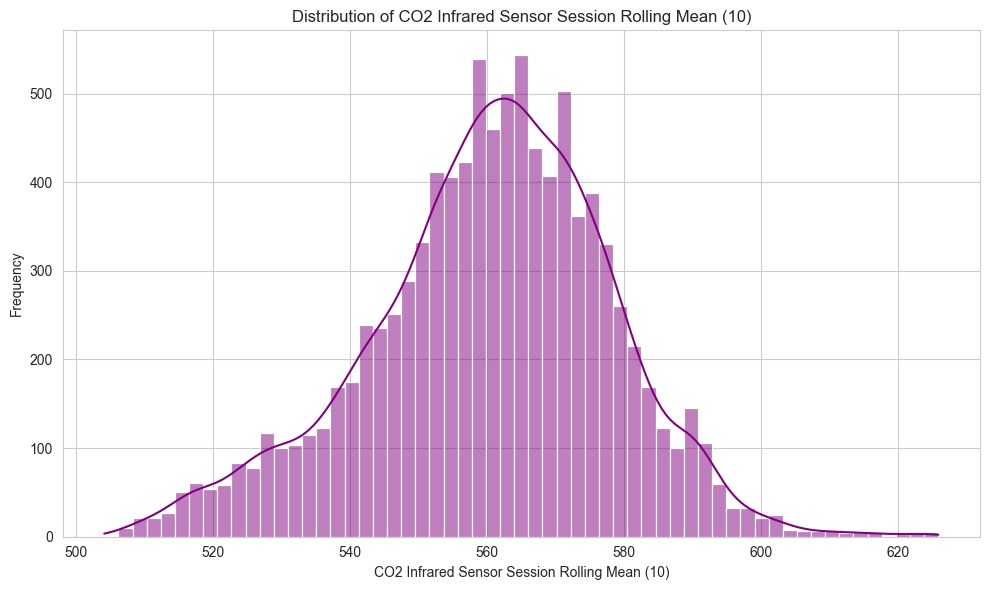

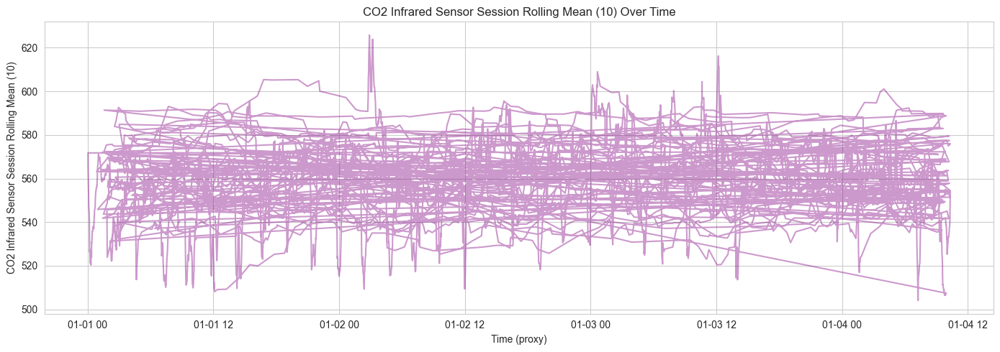


Spearman Correlation between 'CO2 Infrared Sensor Session Rolling Mean (10)' and 'Activity_Level':
Correlation Coefficient: -0.2286
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak negative monotonic correlation. As CO2_InfraredSensor_session_roll_mean_10 increases, activity level tends to slightly decrease.


In [48]:
# CO2_InfraredSensor_session_roll_mean_10 analysis against Activity Level
analyze_numeric_ts_feature('CO2_InfraredSensor_session_roll_mean_10', 'CO2 Infrared Sensor Session Rolling Mean (10)')



MetalOxideSensor_Unit1_session_roll_mean_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit1_session_roll_mean_5,,,
"(326.923, 439.04]",1493,321,140
"(439.04, 461.098]",1192,539,222
"(461.098, 477.898]",1163,551,239
"(477.898, 498.976]",1023,680,250
"(498.976, 625.962]",790,954,209



Analyzing the new 'MetalOxideSensor_Unit1_session_roll_mean_5' feature:


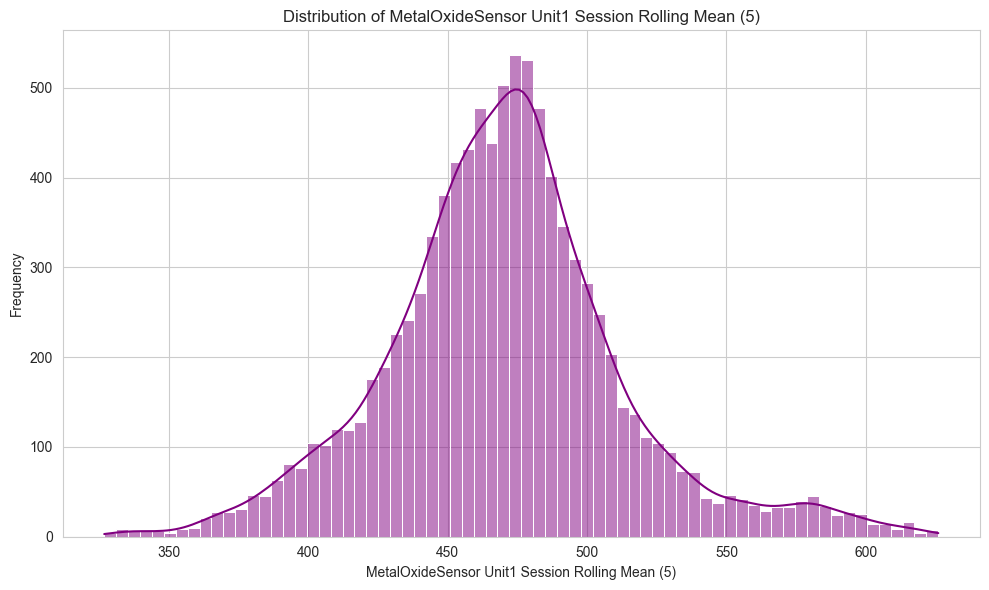

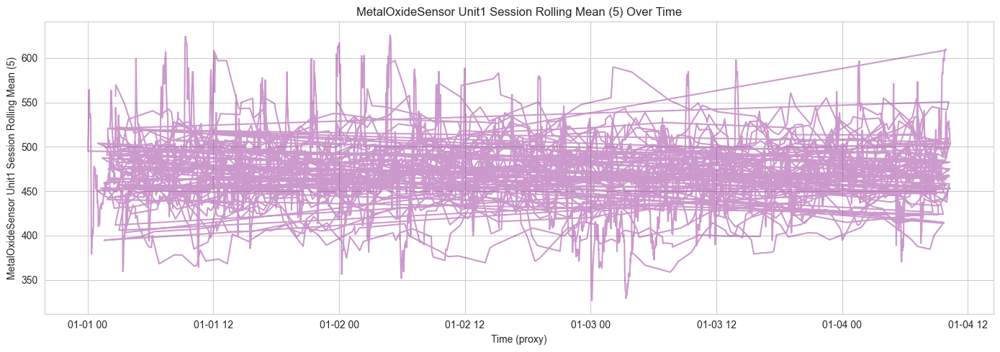


Spearman Correlation between 'MetalOxideSensor Unit1 Session Rolling Mean (5)' and 'Activity_Level':
Correlation Coefficient: 0.2166
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit1_session_roll_mean_5 increases, activity level tends to slightly increase.


In [49]:
# MetalOxideSensor_Unit1_session_roll_mean_5 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit1_session_roll_mean_5', 'MetalOxideSensor Unit1 Session Rolling Mean (5)')



MetalOxideSensor_Unit1_session_roll_std_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit1_session_roll_std_5,,,
"(1.171, 7.27]",1141,556,257
"(7.27, 11.021]",1223,515,215
"(11.021, 20.43]",1169,604,180
"(20.43, 40.175]",1155,603,195
"(40.175, 131.544]",973,767,213



Analyzing the new 'MetalOxideSensor_Unit1_session_roll_std_5' feature:


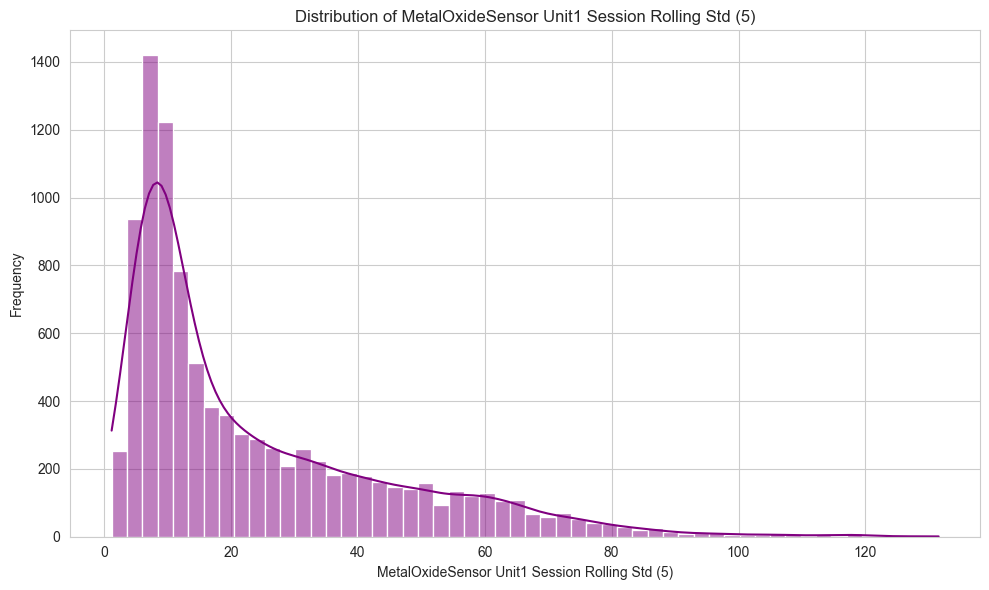

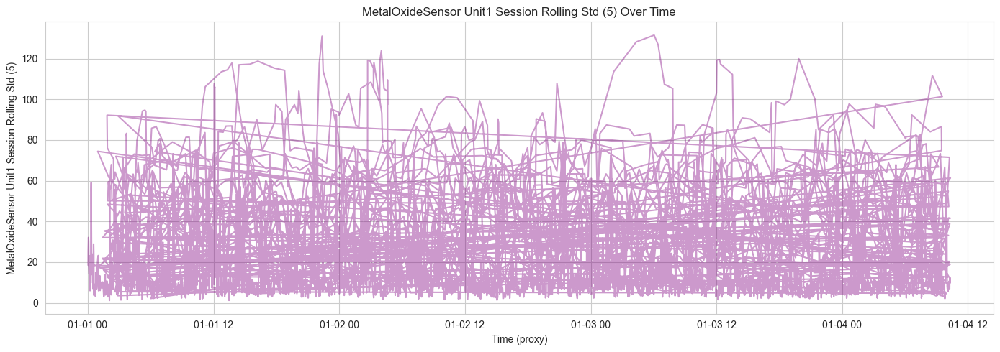


Spearman Correlation between 'MetalOxideSensor Unit1 Session Rolling Std (5)' and 'Activity_Level':
Correlation Coefficient: 0.0436
P-value: 0.0000

The correlation is statistically significant.
Interpretation: The correlation is very weak. The relationship between the two variables is not strong.


In [50]:
# MetalOxideSensor_Unit1_session_roll_std_5 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit1_session_roll_std_5', 'MetalOxideSensor Unit1 Session Rolling Std (5)')



MetalOxideSensor_Unit1_session_roll_mean_10 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit1_session_roll_mean_10,,,
"(331.91200000000003, 440.732]",1511,304,139
"(440.732, 461.625]",1189,536,228
"(461.625, 478.156]",1143,585,225
"(478.156, 497.861]",1026,676,251
"(497.861, 621.976]",792,944,217



Analyzing the new 'MetalOxideSensor_Unit1_session_roll_mean_10' feature:


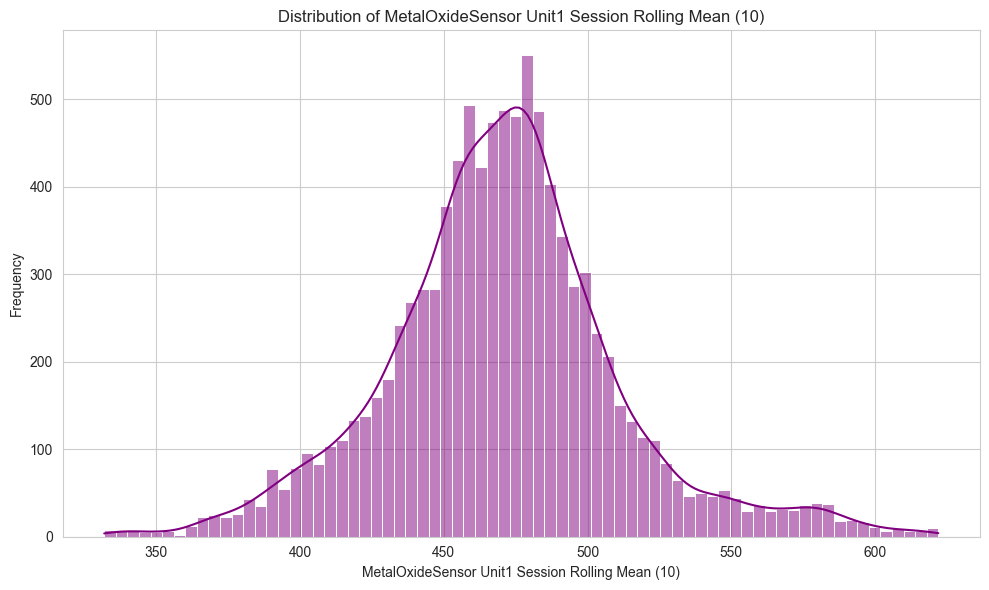

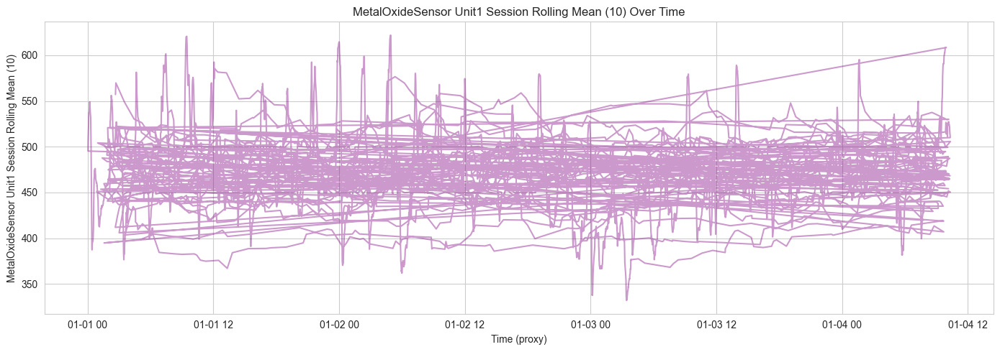


Spearman Correlation between 'MetalOxideSensor Unit1 Session Rolling Mean (10)' and 'Activity_Level':
Correlation Coefficient: 0.2167
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit1_session_roll_mean_10 increases, activity level tends to slightly increase.


In [51]:
# MetalOxideSensor_Unit1_session_roll_mean_10 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit1_session_roll_mean_10', 'MetalOxideSensor Unit1 Session Rolling Mean (10)')



MetalOxideSensor_Unit2_session_roll_mean_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit2_session_roll_mean_5,,,
"(621.8530000000001, 704.04]",1577,282,95
"(704.04, 720.358]",1436,348,169
"(720.358, 734.988]",997,679,277
"(734.988, 752.078]",872,800,281
"(752.078, 829.412]",779,936,238



Analyzing the new 'MetalOxideSensor_Unit2_session_roll_mean_5' feature:


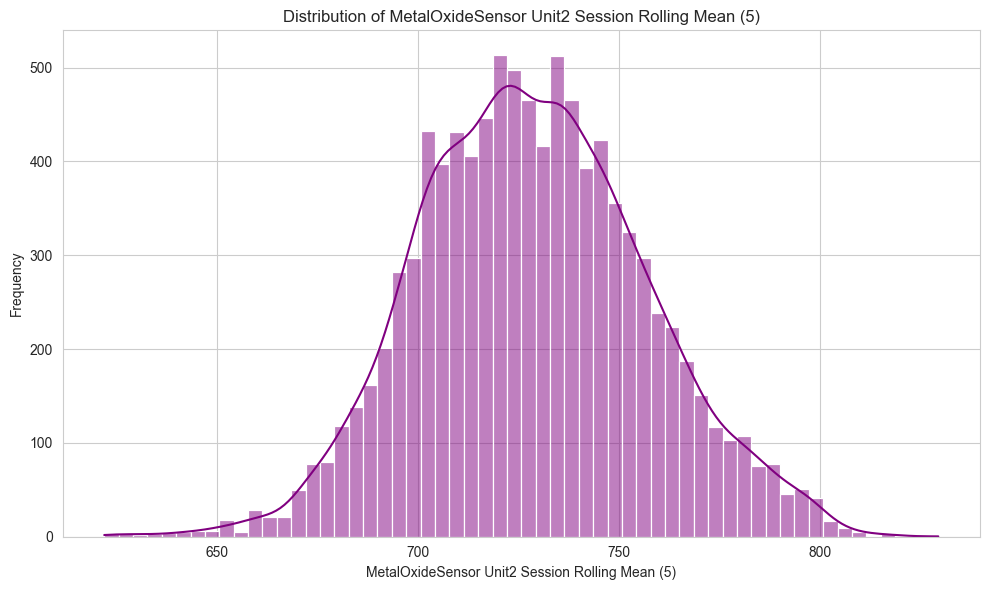

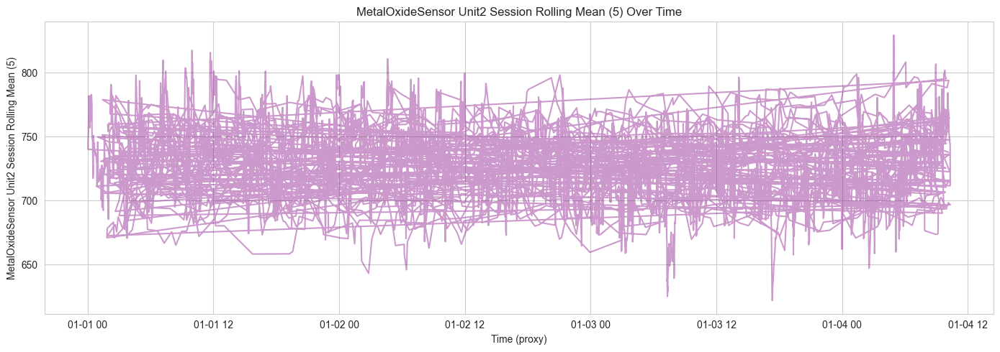


Spearman Correlation between 'MetalOxideSensor Unit2 Session Rolling Mean (5)' and 'Activity_Level':
Correlation Coefficient: 0.3014
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit2_session_roll_mean_5 increases, activity level tends to slightly increase.


In [52]:
# MetalOxideSensor_Unit2_session_roll_mean_5 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit2_session_roll_mean_5', 'MetalOxideSensor Unit2 Session Rolling Mean (5)')



MetalOxideSensor_Unit2_session_roll_std_5 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit2_session_roll_std_5,,,
"(0.568, 4.516]",1162,571,221
"(4.516, 8.277]",1169,576,208
"(8.277, 21.504]",1122,649,182
"(21.504, 51.191]",1080,654,219
"(51.191, 136.367]",1128,595,230



Analyzing the new 'MetalOxideSensor_Unit2_session_roll_std_5' feature:


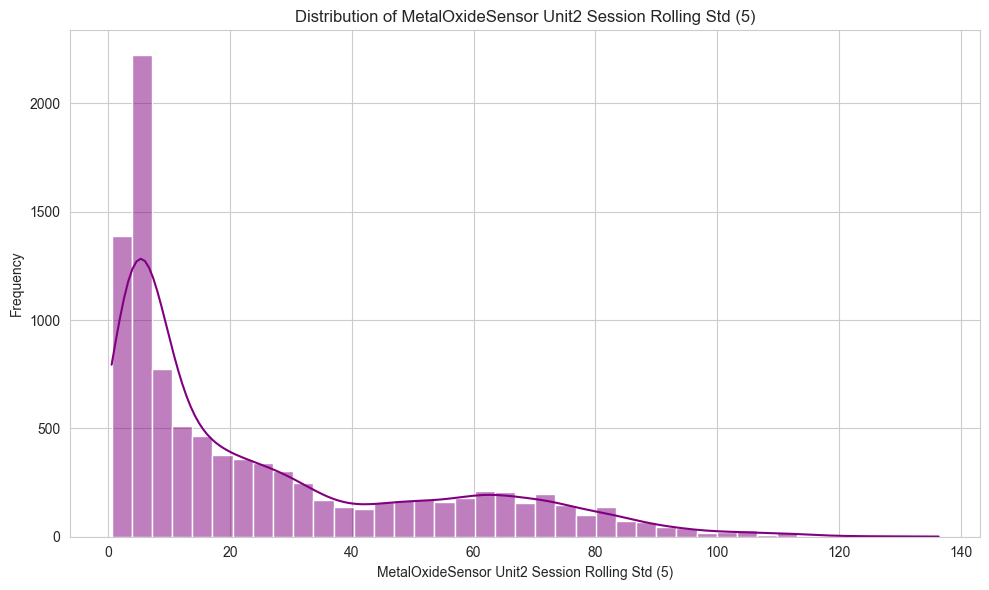

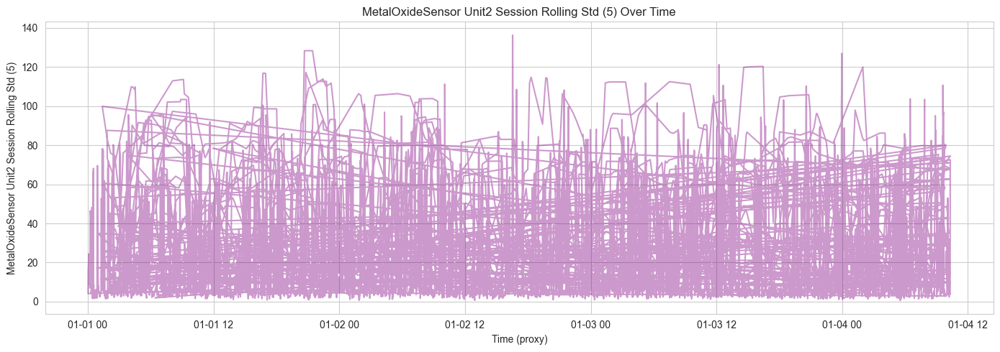


Spearman Correlation between 'MetalOxideSensor Unit2 Session Rolling Std (5)' and 'Activity_Level':
Correlation Coefficient: 0.0191
P-value: 0.0592

The correlation is not statistically significant (p-value >= 0.05).


In [53]:
# MetalOxideSensor_Unit2_session_roll_std_5 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit2_session_roll_std_5', 'MetalOxideSensor Unit2 Session Rolling Std (5)')



MetalOxideSensor_Unit2_session_roll_mean_10 vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
MetalOxideSensor_Unit2_session_roll_mean_10,,,
"(626.559, 706.206]",1652,221,82
"(706.206, 720.489]",1384,392,176
"(720.489, 734.472]",1022,668,263
"(734.472, 749.637]",847,798,308
"(749.637, 811.202]",756,966,231



Analyzing the new 'MetalOxideSensor_Unit2_session_roll_mean_10' feature:


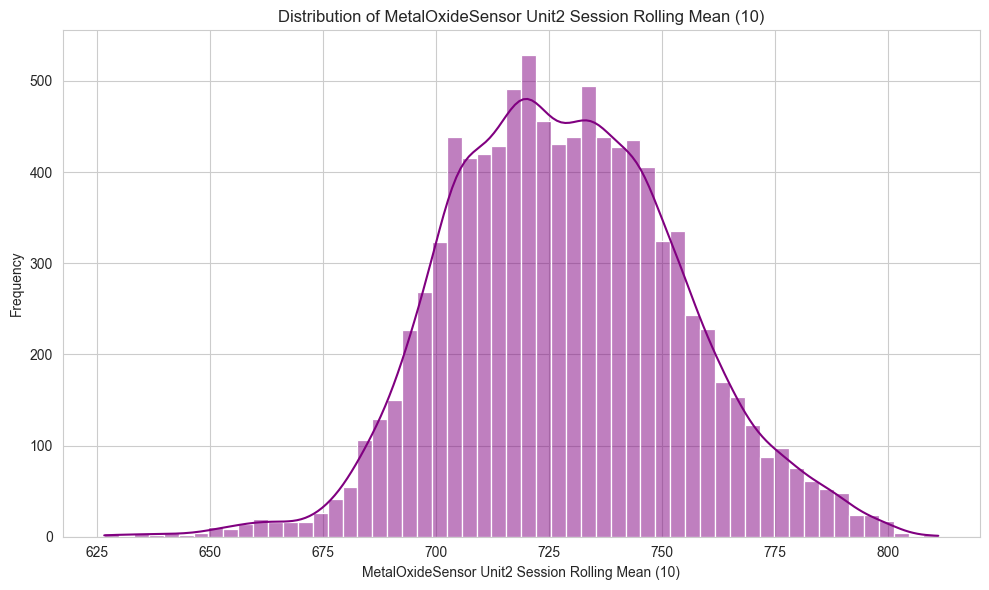

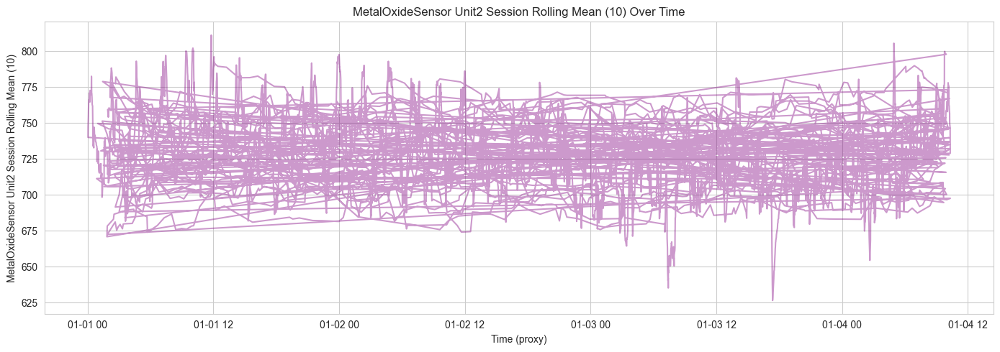


Spearman Correlation between 'MetalOxideSensor Unit2 Session Rolling Mean (10)' and 'Activity_Level':
Correlation Coefficient: 0.3216
P-value: 0.0000

The correlation is statistically significant.
Interpretation: There is a weak positive monotonic correlation. As MetalOxideSensor_Unit2_session_roll_mean_10 increases, activity level tends to slightly increase.


In [54]:
# MetalOxideSensor_Unit2_session_roll_mean_10 analysis against Activity Level
analyze_numeric_ts_feature('MetalOxideSensor_Unit2_session_roll_mean_10', 'MetalOxideSensor Unit2 Session Rolling Mean (10)')



HVAC_prev_session vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
HVAC_prev_session,,,
cooling_active,959,517,183
eco_mode,923,492,181
heating_active,960,522,167
maintenance_mode,954,507,202
off,904,522,178
ventilation_only,961,485,149


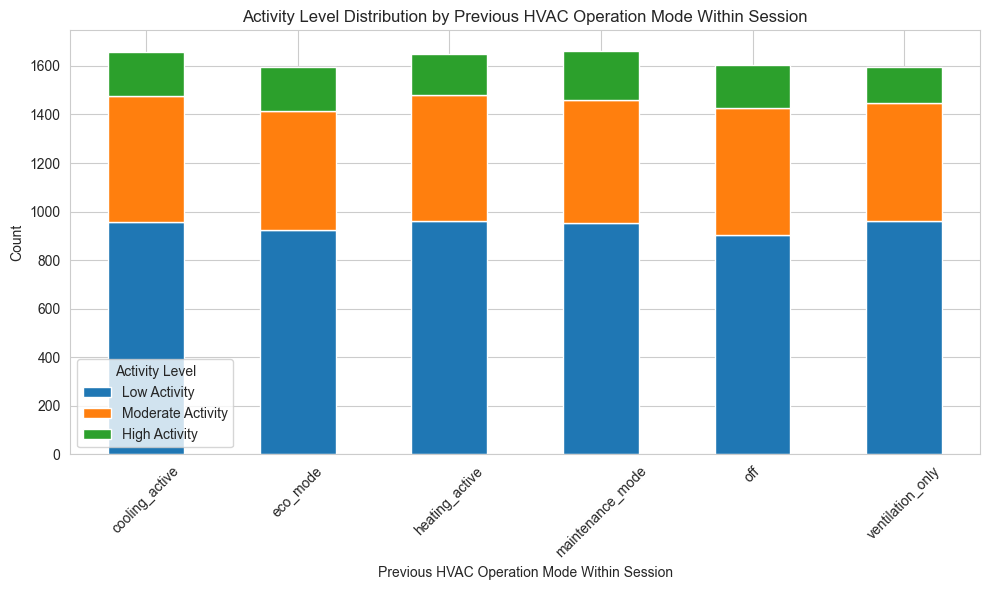


HVAC_prev_session Value Counts:


HVAC_prev_session
maintenance_mode    1663
cooling_active      1659
heating_active      1649
off                 1604
eco_mode            1596
ventilation_only    1595
Name: count, dtype: int64


Spearman Correlation between Activity Level and HVAC_prev_session:
Correlation Coefficient: -0.0085
P-value: 0.3985

The correlation is not statistically significant (p-value >= 0.05).


In [55]:
# HVAC_prev_session analysis against Activity Level
analyze_categorical_ts_feature('HVAC_prev_session', 'Previous HVAC Operation Mode Within Session')



HVAC_changed_session vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
HVAC_changed_session,,,
0,939,516,187
1,4722,2529,873


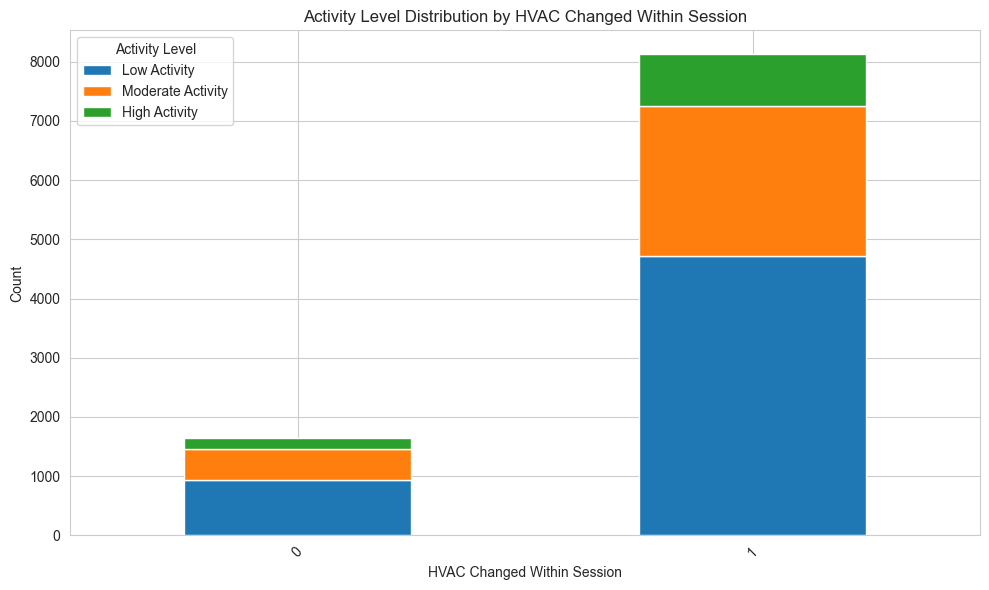


HVAC_changed_session Value Counts:


HVAC_changed_session
1    8124
0    1642
Name: count, dtype: int64


Spearman Correlation between Activity Level and HVAC_changed_session:
Correlation Coefficient: -0.0081
P-value: 0.4209

The correlation is not statistically significant (p-value >= 0.05).


In [56]:
# HVAC_changed_session analysis against Activity Level
analyze_categorical_ts_feature('HVAC_changed_session', 'HVAC Changed Within Session')



time_since_last_change_session vs Activity Level:


Activity Level,Low Activity,Moderate Activity,High Activity
time_since_last_change_session,,,
"(-0.001, 5.0]",5661,3045,1060



Analyzing the new 'time_since_last_change_session' feature:


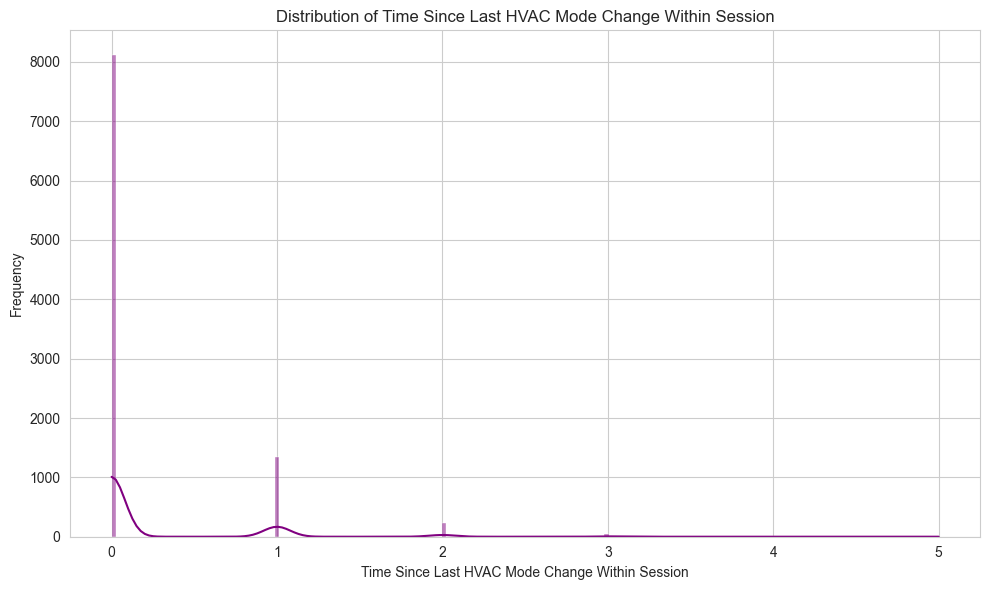

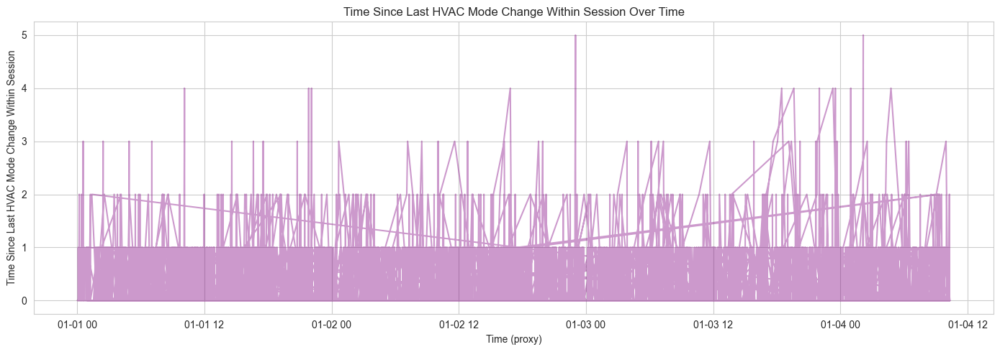


Spearman Correlation between 'Time Since Last HVAC Mode Change Within Session' and 'Activity_Level':
Correlation Coefficient: 0.0078
P-value: 0.4406

The correlation is not statistically significant (p-value >= 0.05).


In [57]:
# time_since_last_change_session analysis against Activity Level
analyze_numeric_ts_feature('time_since_last_change_session', 'Time Since Last HVAC Mode Change Within Session')


In [58]:
# ML feature selection and preprocessing
# Keep strong current-row features plus proper session-grouped time-series features.
# Session ID is included only for a row-split leakage/proxy experiment, not for final generalization scoring.

model_df = df_model.copy() if 'df_model' in globals() else df.copy()
df_columns = model_df.columns

activity_level_order = ['Low Activity', 'Moderate Activity', 'High Activity']
y = model_df['Activity Level']
groups = model_df['Session ID']

current_numeric_features = [
    'Temperature',
    'Temperature_x_Humidity',
    'co2_ratio',
    'avg_metal_oxide',
]

session_ts_numeric_features = [
    col for col in model_df.columns
    if '_session_lag' in col or '_session_roll_mean_' in col or '_session_roll_std_' in col
]

# Keep session time-series features focused on the variables that showed real signal in EDA.
important_ts_prefixes = (
    'Temperature_',
    'CO2_InfraredSensor_',
    'MetalOxideSensor_Unit1_',
    'MetalOxideSensor_Unit2_',
    'avg_metal_oxide_',
    'co2_ratio_'
)
session_ts_numeric_features = [
    col for col in session_ts_numeric_features
    if col.startswith(important_ts_prefixes)
]

selected_numeric_features = current_numeric_features + session_ts_numeric_features + [
    'time_since_last_change_session'
]

selected_ordinal_features = [
    'Time of Day',
    'CO_GasSensor',
    'is_daytime',
    'Temperature_Band',
]

selected_nominal_features = [
    'HVAC_prev_session'
]

# Cautious row-split experiment only: Session ID can act like an identifier/proxy and should not be treated
# as evidence of generalization unless group-split performance is also strong.
session_id_feature = ['Session ID'] if 'Session ID' in df_columns else []

numerical_features = [col for col in selected_numeric_features if col in df_columns]
ordinal_features = [col for col in selected_ordinal_features if col in df_columns]
nominal_features = [col for col in selected_nominal_features if col in df_columns]
selected_features = numerical_features + ordinal_features + nominal_features
selected_features_with_session_id = selected_features + session_id_feature

print('Selected current numeric features:', [col for col in current_numeric_features if col in df_columns])
print('Selected session-grouped TS numeric features:', session_ts_numeric_features)
print('Selected ordinal features:', ordinal_features)
print('Selected nominal features:', nominal_features)
print('Session ID proxy feature for row-split experiment:', session_id_feature)
print(f'Total selected features before encoding: {len(selected_features)}')

X = model_df[selected_features].copy()
X_with_session_id = model_df[selected_features_with_session_id].copy()

ordinal_categories_lookup = {
    'Time of Day': ['morning', 'afternoon', 'evening', 'night'],
    'Temperature_Band': ['14-16', '16-18', '18-20', '20-22', '22-24', '24-26'],
    'CO_GasSensor': ['extremely low', 'low', 'medium', 'high', 'extremely high'],
    'is_daytime': [0, 1],
}
ordinal_categories = [ordinal_categories_lookup[col] for col in ordinal_features]

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('ordinal', OrdinalEncoder(
        categories=ordinal_categories,
        handle_unknown='use_encoded_value',
        unknown_value=-1
    ))
])

nominal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('ord', ordinal_transformer, ordinal_features),
        ('cat', nominal_transformer, nominal_features),
    ],
    remainder='drop'
)

# Variant used only to test whether Session ID leaks/proxies target distribution in random row splits.
nominal_features_with_session_id = nominal_features + session_id_feature
preprocessor_with_session_id = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('ord', ordinal_transformer, ordinal_features),
        ('cat', nominal_transformer, nominal_features_with_session_id),
    ],
    remainder='drop'
)


Selected current numeric features: ['Temperature', 'Temperature_x_Humidity', 'co2_ratio', 'avg_metal_oxide']
Selected session-grouped TS numeric features: ['Temperature_session_lag1', 'Temperature_session_lag2', 'Temperature_session_lag3', 'CO2_InfraredSensor_session_lag1', 'CO2_InfraredSensor_session_lag2', 'CO2_InfraredSensor_session_lag3', 'MetalOxideSensor_Unit1_session_lag1', 'MetalOxideSensor_Unit1_session_lag2', 'MetalOxideSensor_Unit1_session_lag3', 'MetalOxideSensor_Unit2_session_lag1', 'MetalOxideSensor_Unit2_session_lag2', 'MetalOxideSensor_Unit2_session_lag3', 'avg_metal_oxide_session_lag1', 'avg_metal_oxide_session_lag2', 'avg_metal_oxide_session_lag3', 'co2_ratio_session_lag1', 'co2_ratio_session_lag2', 'co2_ratio_session_lag3', 'Temperature_session_roll_mean_3', 'Temperature_session_roll_std_3', 'Temperature_session_roll_mean_5', 'Temperature_session_roll_std_5', 'Temperature_session_roll_mean_10', 'Temperature_session_roll_std_10', 'CO2_InfraredSensor_session_roll_mean_

In [59]:
# Define train/test split and SMOTE-balanced baseline pipelines
# IMPORTANT: SMOTE is applied only inside the training pipeline after preprocessing.
# The test set remains untouched so evaluation reflects the original class distribution.

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print('Original training class distribution:')
display(y_train.value_counts())
print('\nOriginal test class distribution:')
display(y_test.value_counts())

# Balance every minority class to match the majority class in the training split.
# This is safer than hard-coding class counts because it adapts if the data changes.
smote = SMOTE(sampling_strategy='not majority', random_state=42, k_neighbors=5)

# Define the models. Class weights are removed for SMOTE models to avoid double-counting imbalance.
models = {
    'RandomForest': RandomForestClassifier(
        n_estimators=300,
        random_state=42,
        n_jobs=-1
    ),
    'DecisionTree': DecisionTreeClassifier(
        max_depth=8,
        min_samples_leaf=25,
        random_state=42
    ),
    'LogisticRegression': LogisticRegression(
        solver='lbfgs',
        max_iter=2000,
        random_state=42
    ),
    'XGBoost': XGBClassifier(
        objective='multi:softprob',
        num_class=len(activity_level_order),
        n_estimators=300,
        max_depth=4,
        learning_rate=0.05,
        subsample=0.85,
        colsample_bytree=0.85,
        eval_metric='mlogloss',
        random_state=42,
        n_jobs=-1
    ),
    'LightGBM': lgb.LGBMClassifier(
        objective='multiclass',
        num_class=len(activity_level_order),
        n_estimators=300,
        learning_rate=0.05,
        num_leaves=31,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=42,
        n_jobs=-1,
        verbose=-1
    ),
    'CatBoost': CatBoostClassifier(
        iterations=300,
        depth=4,
        learning_rate=0.05,
        loss_function='MultiClass',
        random_seed=42,
        verbose=False
    )
}

# Wrap each model in an imblearn pipeline so every baseline uses the same balanced training data.
pipelines = {
    name: ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('smote', smote),
        ('model', model)
    ])
    for name, model in models.items()
}

# XGBoost needs encoded class labels; the other models can use the original labels.
activity_label_map = {label: idx for idx, label in enumerate(activity_level_order)}
activity_label_inverse = {idx: label for label, idx in activity_label_map.items()}
y_train_encoded = y_train.map(activity_label_map)
y_test_encoded = y_test.map(activity_label_map)

print('\nSMOTE-balanced training distribution preview:')
X_train_preprocessed = preprocessor.fit_transform(X_train)
_, y_train_smote_preview = smote.fit_resample(X_train_preprocessed, y_train) # type: ignore
display(pd.Series(y_train_smote_preview).value_counts()) # type: ignore

baseline_results = []


Original training class distribution:


Activity Level
Low Activity         4528
Moderate Activity    2436
High Activity         848
Name: count, dtype: int64


Original test class distribution:


Activity Level
Low Activity         1133
Moderate Activity     609
High Activity         212
Name: count, dtype: int64


SMOTE-balanced training distribution preview:


Activity Level
Low Activity         4528
Moderate Activity    4528
High Activity        4528
Name: count, dtype: int64

In [60]:
# Random Forest baseline with SMOTE-balanced training data
rf_pipeline = pipelines['RandomForest']

rf_pipeline.fit(X_train, y_train)
y_pred_rf = rf_pipeline.predict(X_test)

print('\nRandomForest baseline using SMOTE-balanced training data')
print(f'Accuracy: {accuracy_score(y_test, y_pred_rf):.4f}')
print(f'Macro F1: {f1_score(y_test, y_pred_rf, average="macro"):.4f}')
print('\nClassification report:')
print(classification_report(y_test, y_pred_rf, zero_division=0))

baseline_results.append({
    'model': 'RandomForest + SMOTE',
    'accuracy': accuracy_score(y_test, y_pred_rf),
    'macro_f1': f1_score(y_test, y_pred_rf, average='macro')
})

feature_names = rf_pipeline.named_steps['preprocessor'].get_feature_names_out()
feature_importance_df = (
    pd.DataFrame({'feature': feature_names, 'importance': rf_pipeline.named_steps['model'].feature_importances_})
    .sort_values('importance', ascending=False)
    .reset_index(drop=True)
)

print('\nTop RandomForest feature importances:')
display(feature_importance_df.head(20))



RandomForest baseline using SMOTE-balanced training data
Accuracy: 0.6218
Macro F1: 0.4853

Classification report:
                   precision    recall  f1-score   support

    High Activity       0.21      0.13      0.16       212
     Low Activity       0.79      0.70      0.74      1133
Moderate Activity       0.48      0.64      0.55       609

         accuracy                           0.62      1954
        macro avg       0.49      0.49      0.49      1954
     weighted avg       0.63      0.62      0.62      1954


Top RandomForest feature importances:


,feature,importance
0,num__avg_metal_oxide,0.049356
1,num__Temperature_x_Humidity,0.041829
2,num__co2_ratio,0.034025
3,ord__CO_GasSensor,0.024903
4,num__MetalOxideSensor_Unit2_session_lag1,0.021688
5,num__Temperature,0.020758
6,num__MetalOxideSensor_Unit2_session_lag2,0.020661
7,num__avg_metal_oxide_session_roll_mean_5,0.020486
8,num__avg_metal_oxide_session_roll_mean_10,0.020189
9,num__co2_ratio_session_roll_mean_10,0.016743


In [61]:
# Decision Tree baseline with SMOTE-balanced training data
dt_pipeline = pipelines['DecisionTree']

dt_pipeline.fit(X_train, y_train)
y_pred_dt = dt_pipeline.predict(X_test)

print('\nDecision Tree baseline using SMOTE-balanced training data')
print(f'Accuracy: {accuracy_score(y_test, y_pred_dt):.4f}')
print(f'Macro F1: {f1_score(y_test, y_pred_dt, average="macro"):.4f}')
print('\nClassification report:')
print(classification_report(y_test, y_pred_dt, zero_division=0))

baseline_results.append({
    'model': 'DecisionTree + SMOTE',
    'accuracy': accuracy_score(y_test, y_pred_dt),
    'macro_f1': f1_score(y_test, y_pred_dt, average='macro')
})

feature_names = dt_pipeline.named_steps['preprocessor'].get_feature_names_out()
dt_importance_df = (
    pd.DataFrame({'feature': feature_names, 'importance': dt_pipeline.named_steps['model'].feature_importances_})
    .sort_values('importance', ascending=False)
    .reset_index(drop=True)
)

print('\nTop Decision Tree feature importances:')
display(dt_importance_df.head(20))



Decision Tree baseline using SMOTE-balanced training data
Accuracy: 0.5471
Macro F1: 0.4794

Classification report:
                   precision    recall  f1-score   support

    High Activity       0.19      0.49      0.27       212
     Low Activity       0.85      0.61      0.71      1133
Moderate Activity       0.47      0.45      0.46       609

         accuracy                           0.55      1954
        macro avg       0.50      0.52      0.48      1954
     weighted avg       0.66      0.55      0.58      1954


Top Decision Tree feature importances:


,feature,importance
0,num__avg_metal_oxide,0.414909
1,num__Temperature_x_Humidity,0.118509
2,ord__CO_GasSensor,0.105779
3,num__co2_ratio,0.088720
4,cat__HVAC_prev_session_heating_active,0.040932
5,num__MetalOxideSensor_Unit2_session_lag1,0.018472
6,num__MetalOxideSensor_Unit1_session_roll_std_3,0.014610
7,num__CO2_InfraredSensor_session_lag3,0.011667
8,num__MetalOxideSensor_Unit2_session_lag2,0.009411
9,num__Temperature,0.008264


In [62]:
# Logistic Regression baseline with SMOTE-balanced training data
logreg_pipeline = pipelines['LogisticRegression']

logreg_pipeline.fit(X_train, y_train)
y_pred_logreg = logreg_pipeline.predict(X_test)

print('\nLogistic Regression baseline using SMOTE-balanced training data')
print(f'Accuracy: {accuracy_score(y_test, y_pred_logreg):.4f}')
print(f'Macro F1: {f1_score(y_test, y_pred_logreg, average="macro"):.4f}')
print('\nClassification report:')
print(classification_report(y_test, y_pred_logreg, zero_division=0))

baseline_results.append({
    'model': 'LogisticRegression + SMOTE',
    'accuracy': accuracy_score(y_test, y_pred_logreg),
    'macro_f1': f1_score(y_test, y_pred_logreg, average='macro')
})

feature_names = logreg_pipeline.named_steps['preprocessor'].get_feature_names_out()
coef_importance = np.mean(np.abs(logreg_pipeline.named_steps['model'].coef_), axis=0)
logreg_importance_df = (
    pd.DataFrame({'feature': feature_names, 'mean_abs_coefficient': coef_importance})
    .sort_values('mean_abs_coefficient', ascending=False)
    .reset_index(drop=True)
)

print('\nTop Logistic Regression coefficient magnitudes:')
display(logreg_importance_df.head(20))



Logistic Regression baseline using SMOTE-balanced training data
Accuracy: 0.5870
Macro F1: 0.5094

Classification report:
                   precision    recall  f1-score   support

    High Activity       0.22      0.47      0.30       212
     Low Activity       0.79      0.67      0.72      1133
Moderate Activity       0.53      0.48      0.51       609

         accuracy                           0.59      1954
        macro avg       0.51      0.54      0.51      1954
     weighted avg       0.65      0.59      0.61      1954


Top Logistic Regression coefficient magnitudes:


,feature,mean_abs_coefficient
0,num__avg_metal_oxide_session_roll_mean_5,0.467776
1,num__co2_ratio_session_roll_mean_10,0.412257
2,num__MetalOxideSensor_Unit1_session_roll_mean_5,0.321563
3,num__CO2_InfraredSensor_session_roll_mean_10,0.268694
4,num__avg_metal_oxide,0.192081
5,num__MetalOxideSensor_Unit1_session_roll_std_10,0.186185
6,num__co2_ratio_session_roll_mean_5,0.180093
7,num__Temperature,0.171467
8,ord__CO_GasSensor,0.122610
9,num__co2_ratio,0.119125


In [63]:
# XGBoost baseline with SMOTE-balanced training data
# XGBoost needs encoded class labels, so this cell uses the encoded y values created in the SMOTE setup cell.
xgb_pipeline = pipelines['XGBoost']

xgb_pipeline.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb_pipeline.predict(X_test)
y_pred_xgb = pd.Series(y_pred_xgb_encoded).map(activity_label_inverse)

print('\nXGBoost baseline using SMOTE-balanced training data')
print(f'Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}')
print(f'Macro F1: {f1_score(y_test, y_pred_xgb, average="macro"):.4f}')
print('\nClassification report:')
print(classification_report(y_test, y_pred_xgb, labels=activity_level_order, zero_division=0))

baseline_results.append({
    'model': 'XGBoost + SMOTE',
    'accuracy': accuracy_score(y_test, y_pred_xgb),
    'macro_f1': f1_score(y_test, y_pred_xgb, average='macro')
})

feature_names = xgb_pipeline.named_steps['preprocessor'].get_feature_names_out()
xgb_importance_df = (
    pd.DataFrame({'feature': feature_names, 'importance': xgb_pipeline.named_steps['model'].feature_importances_})
    .sort_values('importance', ascending=False)
    .reset_index(drop=True)
)

print('\nTop XGBoost feature importances:')
display(xgb_importance_df.head(20))



XGBoost baseline using SMOTE-balanced training data
Accuracy: 0.6238
Macro F1: 0.4938

Classification report:
                   precision    recall  f1-score   support

     Low Activity       0.78      0.71      0.74      1133
Moderate Activity       0.50      0.63      0.55       609
    High Activity       0.22      0.16      0.18       212

         accuracy                           0.62      1954
        macro avg       0.50      0.50      0.49      1954
     weighted avg       0.63      0.62      0.62      1954


Top XGBoost feature importances:


,feature,importance
0,num__avg_metal_oxide,0.074791
1,cat__HVAC_prev_session_heating_active,0.047962
2,cat__HVAC_prev_session_ventilation_only,0.044853
3,cat__HVAC_prev_session_off,0.044513
4,cat__HVAC_prev_session_maintenance_mode,0.043256
5,cat__HVAC_prev_session_eco_mode,0.042228
6,ord__CO_GasSensor,0.041869
7,num__Temperature_x_Humidity,0.040494
8,num__co2_ratio,0.030037
9,ord__Temperature_Band,0.021770


In [64]:
# LightGBM baseline with SMOTE-balanced training data
lgbm_pipeline = pipelines['LightGBM']

lgbm_pipeline.fit(X_train, y_train)
y_pred_lgbm = lgbm_pipeline.predict(X_test)

print('\nLightGBM baseline using SMOTE-balanced training data')
print(f'Accuracy: {accuracy_score(y_test, y_pred_lgbm):.4f}')
print(f'Macro F1: {f1_score(y_test, y_pred_lgbm, average="macro"):.4f}')
print('\nClassification report:')
print(classification_report(y_test, y_pred_lgbm, zero_division=0))

baseline_results.append({
    'model': 'LightGBM + SMOTE',
    'accuracy': accuracy_score(y_test, y_pred_lgbm),
    'macro_f1': f1_score(y_test, y_pred_lgbm, average='macro')
})

feature_names = lgbm_pipeline.named_steps['preprocessor'].get_feature_names_out()
lgbm_importance_df = (
    pd.DataFrame({'feature': feature_names, 'importance': lgbm_pipeline.named_steps['model'].feature_importances_})
    .sort_values('importance', ascending=False)
    .reset_index(drop=True)
)

print('\nTop LightGBM feature importances:')
display(lgbm_importance_df.head(20))



LightGBM baseline using SMOTE-balanced training data
Accuracy: 0.6238
Macro F1: 0.4711

Classification report:
                   precision    recall  f1-score   support

    High Activity       0.21      0.10      0.13       212
     Low Activity       0.75      0.74      0.75      1133
Moderate Activity       0.49      0.59      0.53       609

         accuracy                           0.62      1954
        macro avg       0.48      0.48      0.47      1954
     weighted avg       0.61      0.62      0.61      1954


Top LightGBM feature importances:


c:\Users\User\miniconda3\envs\nvidia_project\Lib\site-packages\sklearn\utils\validation.py:2691: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,feature,importance
0,num__avg_metal_oxide,820
1,num__co2_ratio,774
2,num__Temperature_x_Humidity,723
3,num__MetalOxideSensor_Unit2_session_roll_std_3,543
4,num__MetalOxideSensor_Unit2_session_roll_std_10,542
5,num__Temperature_session_roll_std_3,517
6,num__Temperature_session_roll_std_10,510
7,num__MetalOxideSensor_Unit1_session_roll_std_10,505
8,num__Temperature,501
9,num__co2_ratio_session_roll_std_3,496


In [65]:
# CatBoost baseline with SMOTE-balanced training data
cat_pipeline = pipelines['CatBoost']

cat_pipeline.fit(X_train, y_train)
y_pred_cat = cat_pipeline.predict(X_test)
y_pred_cat = np.ravel(y_pred_cat)

print('\nCatBoost baseline using SMOTE-balanced training data')
print(f'Accuracy: {accuracy_score(y_test, y_pred_cat):.4f}')
print(f'Macro F1: {f1_score(y_test, y_pred_cat, average="macro"):.4f}')
print('\nClassification report:')
print(classification_report(y_test, y_pred_cat, zero_division=0))

baseline_results.append({
    'model': 'CatBoost + SMOTE',
    'accuracy': accuracy_score(y_test, y_pred_cat),
    'macro_f1': f1_score(y_test, y_pred_cat, average='macro')
})

feature_names = cat_pipeline.named_steps['preprocessor'].get_feature_names_out()
cat_importance_df = (
    pd.DataFrame({'feature': feature_names, 'importance': cat_pipeline.named_steps['model'].get_feature_importance()})
    .sort_values('importance', ascending=False)
    .reset_index(drop=True)
)

print('\nTop CatBoost feature importances:')
display(cat_importance_df.head(20))



CatBoost baseline using SMOTE-balanced training data
Accuracy: 0.6264
Macro F1: 0.4976

Classification report:
                   precision    recall  f1-score   support

    High Activity       0.22      0.17      0.19       212
     Low Activity       0.78      0.71      0.74      1133
Moderate Activity       0.50      0.63      0.56       609

         accuracy                           0.63      1954
        macro avg       0.50      0.50      0.50      1954
     weighted avg       0.63      0.63      0.63      1954


Top CatBoost feature importances:


,feature,importance
0,cat__HVAC_prev_session_maintenance_mode,10.447723
1,num__avg_metal_oxide,9.156285
2,cat__HVAC_prev_session_heating_active,8.824693
3,ord__CO_GasSensor,8.243679
4,cat__HVAC_prev_session_eco_mode,8.144507
5,cat__HVAC_prev_session_off,7.195687
6,cat__HVAC_prev_session_ventilation_only,6.493430
7,num__Temperature_x_Humidity,5.248058
8,num__co2_ratio,4.410393
9,num__time_since_last_change_session,3.486011


In [66]:
# Baseline model comparison
baseline_results_df = (
    pd.DataFrame(baseline_results)
    .drop_duplicates(subset='model', keep='last')
    .sort_values('macro_f1', ascending=False)
    .reset_index(drop=True)
)

print('\nBaseline model comparison sorted by Macro F1:')
display(baseline_results_df)



Baseline model comparison sorted by Macro F1:


,model,accuracy,macro_f1
0,LogisticRegression + SMOTE,0.587001,0.509405
1,CatBoost + SMOTE,0.626407,0.497612
2,XGBoost + SMOTE,0.623849,0.493833
3,RandomForest + SMOTE,0.621801,0.485301
4,DecisionTree + SMOTE,0.547083,0.479446
5,LightGBM + SMOTE,0.623849,0.471141


c:\Users\User\miniconda3\envs\nvidia_project\Lib\site-packages\sklearn\utils\validation.py:2691: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



Random row split WITH Session ID categorical proxy
Accuracy: 0.6198
Macro F1: 0.4451
                   precision    recall  f1-score   support

    High Activity       0.14      0.05      0.08       212
     Low Activity       0.73      0.77      0.75      1133
Moderate Activity       0.48      0.55      0.51       609

         accuracy                           0.62      1954
        macro avg       0.45      0.45      0.45      1954
     weighted avg       0.59      0.62      0.60      1954



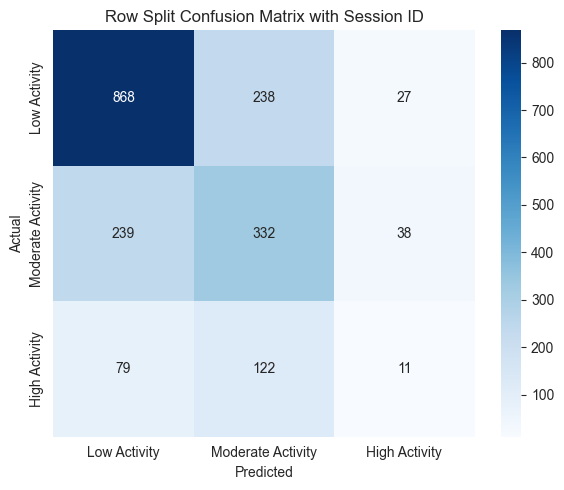

In [67]:
# Row-split Session ID proxy experiment
# This intentionally includes Session ID as a categorical feature to test whether random row splits benefit
# from session-specific target distribution. Treat gains here as a possible leakage/proxy warning.

row_session_model = lgb.LGBMClassifier(
    objective='multiclass',
    num_class=len(activity_level_order),
    n_estimators=500,
    learning_rate=0.04,
    num_leaves=63,
    random_state=42,
    n_jobs=-1,
    verbose=-1
)

row_session_pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor_with_session_id),
    ('smote', SMOTE(sampling_strategy='not majority', random_state=42, k_neighbors=5)),
    ('model', row_session_model)
])

X_train_sid, X_test_sid, y_train_sid, y_test_sid = train_test_split(
    X_with_session_id,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

row_session_pipeline.fit(X_train_sid, y_train_sid)
y_pred_sid = row_session_pipeline.predict(X_test_sid)

print('\nRandom row split WITH Session ID categorical proxy')
print(f'Accuracy: {accuracy_score(y_test_sid, y_pred_sid):.4f}')
print(f'Macro F1: {f1_score(y_test_sid, y_pred_sid, average="macro"):.4f}')
print(classification_report(y_test_sid, y_pred_sid, zero_division=0))

cm_sid = confusion_matrix(y_test_sid, y_pred_sid, labels=activity_level_order)
plt.figure(figsize=(6, 5))
sns.heatmap(cm_sid, annot=True, fmt='d', cmap='Blues', xticklabels=activity_level_order, yticklabels=activity_level_order)
plt.title('Row Split Confusion Matrix with Session ID')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()


Group split training class distribution:


Activity Level
Low Activity         4576
Moderate Activity    2482
High Activity         849
Name: count, dtype: int64


Group split test class distribution:


Activity Level
Low Activity         1085
Moderate Activity     563
High Activity         211
Name: count, dtype: int64


Train sessions: 30 Test sessions: 8

Group split by Session ID WITHOUT Session ID feature
Accuracy: 0.6084
Macro F1: 0.4842
                   precision    recall  f1-score   support

    High Activity       0.21      0.18      0.19       211
     Low Activity       0.76      0.71      0.74      1085
Moderate Activity       0.48      0.57      0.52       563

         accuracy                           0.61      1859
        macro avg       0.49      0.49      0.48      1859
     weighted avg       0.61      0.61      0.61      1859



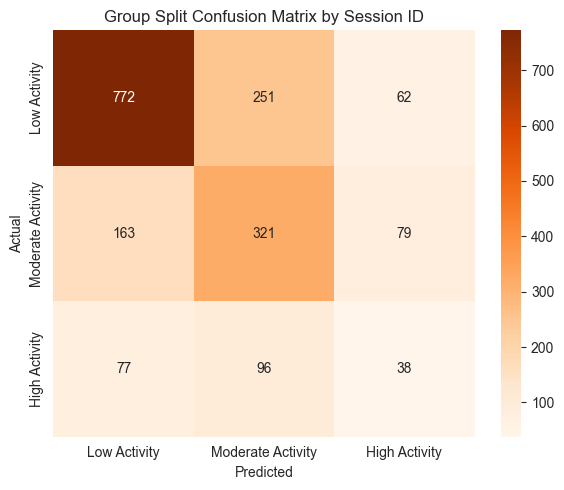

In [68]:
# Group split by Session ID
# This is the more honest generalization check: all rows from a session appear either in train or test, not both.
from sklearn.model_selection import GroupShuffleSplit

group_splitter = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(group_splitter.split(X, y, groups=groups))

X_train_group = X.iloc[train_idx]
X_test_group = X.iloc[test_idx]
y_train_group = y.iloc[train_idx]
y_test_group = y.iloc[test_idx]

print('Group split training class distribution:')
display(y_train_group.value_counts())
print('\nGroup split test class distribution:')
display(y_test_group.value_counts())
print('\nTrain sessions:', groups.iloc[train_idx].nunique(), 'Test sessions:', groups.iloc[test_idx].nunique())

# Use CatBoost because it was the strongest baseline by macro F1.
group_model = CatBoostClassifier(
    iterations=500,
    depth=5,
    learning_rate=0.04,
    loss_function='MultiClass',
    random_seed=42,
    verbose=False
)

group_pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(sampling_strategy='not majority', random_state=42, k_neighbors=5)),
    ('model', group_model)
])

group_pipeline.fit(X_train_group, y_train_group)
y_pred_group = group_pipeline.predict(X_test_group)
y_pred_group = np.ravel(y_pred_group)

print('\nGroup split by Session ID WITHOUT Session ID feature')
print(f'Accuracy: {accuracy_score(y_test_group, y_pred_group):.4f}')
print(f'Macro F1: {f1_score(y_test_group, y_pred_group, average="macro"):.4f}')
print(classification_report(y_test_group, y_pred_group, zero_division=0))

cm_group = confusion_matrix(y_test_group, y_pred_group, labels=activity_level_order)
plt.figure(figsize=(6, 5))
sns.heatmap(cm_group, annot=True, fmt='d', cmap='Oranges', xticklabels=activity_level_order, yticklabels=activity_level_order)
plt.title('Group Split Confusion Matrix by Session ID')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()


In [69]:
# GroupKFold cross-validation by Session ID
# This estimates true generalization across unseen sessions.
from sklearn.model_selection import GroupKFold, cross_validate

group_cv_model = lgb.LGBMClassifier(
    objective='multiclass',
    num_class=len(activity_level_order),
    n_estimators=300,
    learning_rate=0.05,
    num_leaves=31,
    random_state=42,
    n_jobs=-1,
    verbose=-1
)

group_cv_pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(sampling_strategy='not majority', random_state=42, k_neighbors=5)),
    ('model', group_cv_model)
])

gkf = GroupKFold(n_splits=5)
group_cv_scores = cross_validate(
    group_cv_pipeline,
    X,
    y,
    groups=groups,
    cv=gkf,
    scoring=['f1_macro', 'accuracy'],
    n_jobs=-1,
    return_train_score=False
)

group_cv_summary = pd.DataFrame({
    'fold': range(1, 6),
    'macro_f1': group_cv_scores['test_f1_macro'],
    'accuracy': group_cv_scores['test_accuracy']
})

print('GroupKFold by Session ID scores:')
display(group_cv_summary)
print('\nGroupKFold mean/std:')
display(group_cv_summary[['macro_f1', 'accuracy']].agg(['mean', 'std']))


GroupKFold by Session ID scores:


,fold,macro_f1,accuracy
0,1,0.468278,0.688856
1,2,0.441706,0.535253
2,3,0.450649,0.709644
3,4,0.438409,0.583158
4,5,0.454445,0.563926



GroupKFold mean/std:


,macro_f1,accuracy
mean,0.450698,0.616167
std,0.011779,0.078082


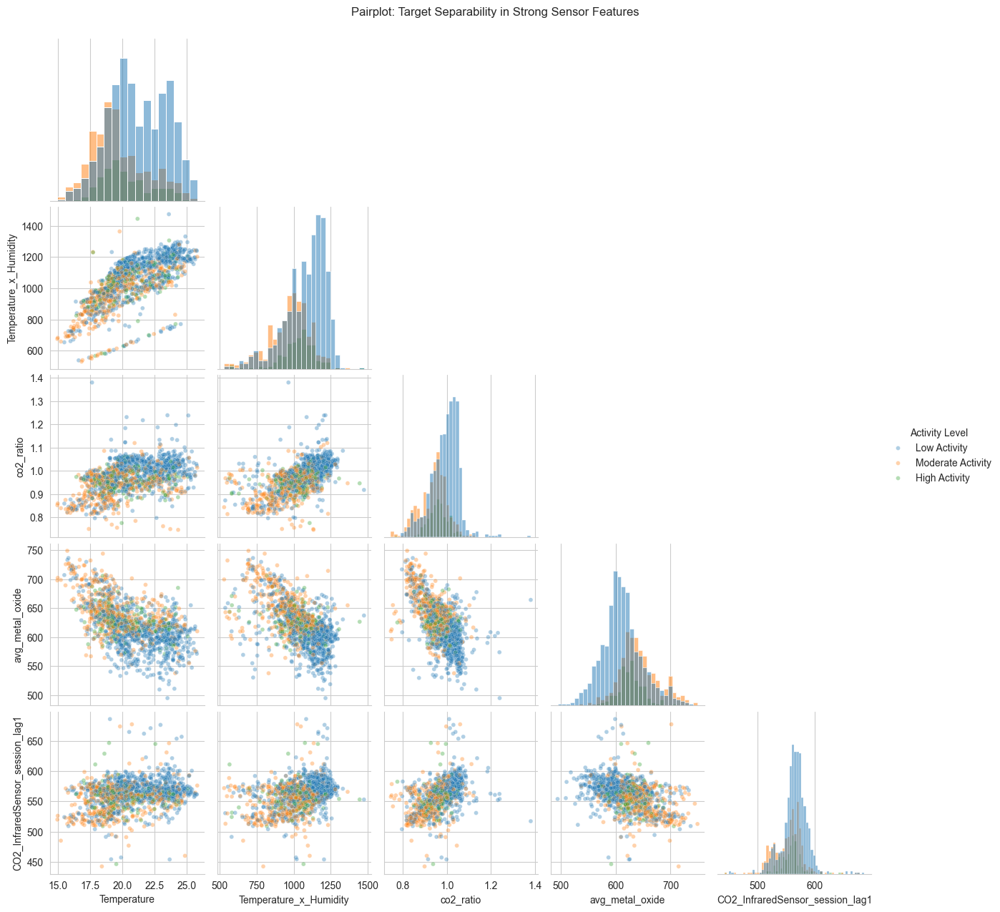

UMAP unavailable; using PCA fallback. Reason: No module named 'umap'


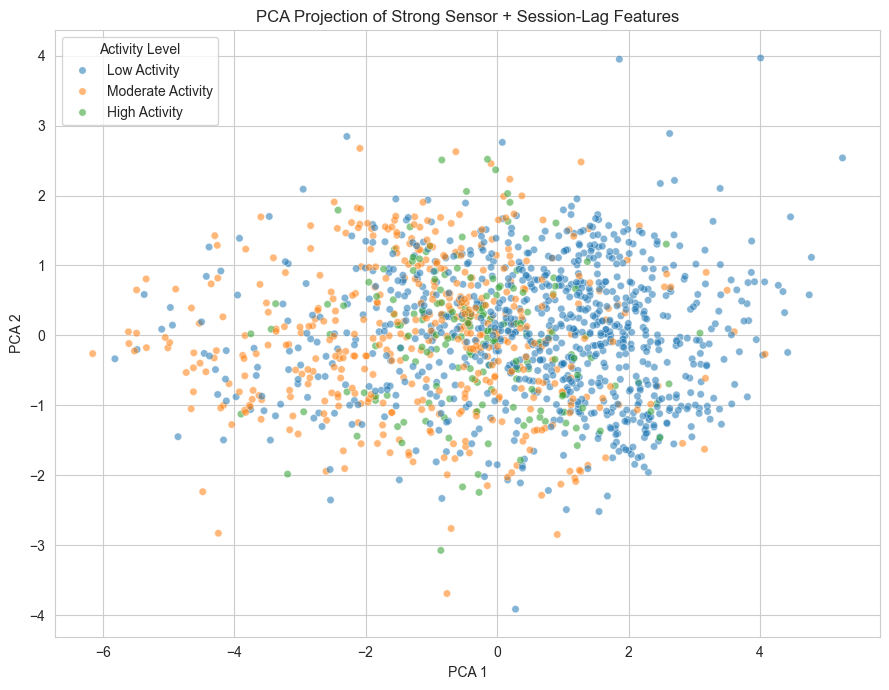

Class centroids in embedding space:


,PCA 1,PCA 2
Activity Level,,
Low Activity,0.654677,0.022184
Moderate Activity,-1.102274,-0.022589
High Activity,-0.350051,-0.051113


In [ ]:
# Target separability diagnostics
# Pairplots and 2D embeddings help inspect whether classes overlap heavily in feature space.
from sklearn.decomposition import PCA

separability_features = [
    'Temperature',
    'Temperature_x_Humidity',
    'co2_ratio',
    'avg_metal_oxide',
    'CO2_InfraredSensor_session_lag1',
    'MetalOxideSensor_Unit2_session_lag1',
    'Temperature_session_lag1'
]
separability_features = [col for col in separability_features if col in model_df.columns]

pairplot_df = (
    model_df[separability_features + ['Activity Level']]
    .dropna()
    .sample(n=min(1500, len(model_df)), random_state=42)
)

sns.pairplot(
    pairplot_df,
    vars=separability_features[:5],
    hue='Activity Level',
    corner=True,
    plot_kws={'alpha': 0.35, 's': 18},
    diag_kind='hist'
)
plt.suptitle('Pairplot: Target Separability in Strong Sensor Features', y=1.02)
plt.show()

# UMAP if available; PCA fallback otherwise.
embedding_preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, separability_features),
    ],
    remainder='drop'
)
X_embed = embedding_preprocessor.fit_transform(pairplot_df[separability_features])

try:
    import umap # type: ignore
    reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=30, min_dist=0.15)
    embedding = reducer.fit_transform(X_embed)
    embedding_name = 'UMAP'
except Exception as exc:
    print(f'UMAP unavailable; using PCA fallback. Reason: {exc}')
    reducer = PCA(n_components=2, random_state=42)
    embedding = reducer.fit_transform(X_embed)
    embedding_name = 'PCA'

embedding_df = pd.DataFrame({
    f'{embedding_name} 1': embedding[:, 0],
    f'{embedding_name} 2': embedding[:, 1],
    'Activity Level': pairplot_df['Activity Level'].values
})

plt.figure(figsize=(9, 7))
sns.scatterplot(
    data=embedding_df,
    x=f'{embedding_name} 1',
    y=f'{embedding_name} 2',
    hue='Activity Level',
    alpha=0.55,
    s=28
)
plt.title(f'{embedding_name} Projection of Strong Sensor + Session-Lag Features')
plt.tight_layout()
plt.show()

print('Class centroids in embedding space:')
display(embedding_df.groupby('Activity Level')[[f'{embedding_name} 1', f'{embedding_name} 2']].mean())


In [71]:
# =============================================================================
# Hyperparameter Tuning for Top-3 Models (XGBoost, CatBoost on GPU + LogisticRegression)
# =============================================================================
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint
import numpy as np
import pandas as pd
from IPython.display import display

print("Starting hyperparameter tuning for top-3 models (GPU enabled where supported)...\n")

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
tuned_results = []

# Reuse your existing objects from cell 60
smote = SMOTE(sampling_strategy='not majority', random_state=42, k_neighbors=5)

# ------------------------------
# 1. Logistic Regression (CPU)
# ------------------------------
logreg_base = LogisticRegression(random_state=42, max_iter=2000)
logreg_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', logreg_base)
])

logreg_param_dist = {
    'model__C': uniform(0.01, 20),
    'model__solver': ['lbfgs', 'saga'],
    'model__penalty': ['l2'],
    'model__max_iter': randint(1000, 5000)
}

logreg_search = RandomizedSearchCV(
    logreg_pipe,
    param_distributions=logreg_param_dist,
    n_iter=20,
    cv=cv,
    scoring='f1_macro',
    random_state=42,
    n_jobs=-1,
    verbose=0
)
logreg_search.fit(X_train, y_train)
y_pred_lr = logreg_search.predict(X_test)
acc_lr = accuracy_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr, average='macro')
print(f"LogisticRegression tuned | Best CV F1: {logreg_search.best_score_:.4f} | Test F1: {f1_lr:.4f}")
tuned_results.append({
    'model': 'LogisticRegression + SMOTE + Tuned',
    'accuracy': round(acc_lr, 4),
    'macro_f1': round(f1_lr, 4), # type: ignore
    'best_params': str(logreg_search.best_params_)
})

# ------------------------------
# 2. XGBoost (GPU)
# ------------------------------
xgb_base = XGBClassifier(
    objective='multi:softprob',
    num_class=len(activity_level_order),
    eval_metric='mlogloss',
    random_state=42,
    n_jobs=1,                    # GPU models prefer n_jobs=1
    tree_method='hist',
    device='cuda'                # Modern XGBoost (>=2.0) GPU support
)
xgb_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', xgb_base)
])

xgb_param_dist = {
    'model__n_estimators': randint(150, 600),
    'model__max_depth': randint(3, 9),
    'model__learning_rate': uniform(0.02, 0.25),
    'model__subsample': uniform(0.65, 0.35),
    'model__colsample_bytree': uniform(0.65, 0.35),
    'model__min_child_weight': randint(1, 8),
    'model__gamma': uniform(0, 0.4)
}

xgb_search = RandomizedSearchCV(
    xgb_pipe,
    param_distributions=xgb_param_dist,
    n_iter=20,
    cv=cv,
    scoring='f1_macro',
    random_state=42,
    n_jobs=1,
    verbose=0
)
xgb_search.fit(X_train, y_train_encoded)
y_pred_xgb_enc = xgb_search.predict(X_test)
y_pred_xgb = pd.Series(y_pred_xgb_enc).map(activity_label_inverse)
acc_xgb = accuracy_score(y_test, y_pred_xgb)
f1_xgb = f1_score(y_test, y_pred_xgb, average='macro')
print(f"XGBoost (GPU) tuned      | Best CV F1: {xgb_search.best_score_:.4f} | Test F1: {f1_xgb:.4f}")
tuned_results.append({
    'model': 'XGBoost + SMOTE + Tuned (GPU)',
    'accuracy': round(acc_xgb, 4),
    'macro_f1': round(f1_xgb, 4), # type: ignore
    'best_params': str(xgb_search.best_params_)
})

# ------------------------------
# 3. CatBoost (GPU)
# ------------------------------
cat_base = CatBoostClassifier(
    loss_function='MultiClass',
    random_seed=42,
    verbose=False,
    task_type='GPU',             # Enable GPU
    devices='0',
    thread_count=1
)
cat_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', smote),
    ('model', cat_base)
])

cat_param_dist = {
    'model__iterations': randint(150, 600),
    'model__depth': randint(4, 10),
    'model__learning_rate': uniform(0.02, 0.25),
    'model__l2_leaf_reg': uniform(1, 12),
    'model__border_count': randint(32, 255),
    'model__random_strength': uniform(0.1, 1.0)
}

cat_search = RandomizedSearchCV(
    cat_pipe,
    param_distributions=cat_param_dist,
    n_iter=20,
    cv=cv,
    scoring='f1_macro',
    random_state=42,
    n_jobs=1,
    verbose=0
)
cat_search.fit(X_train, y_train)
y_pred_cat = np.ravel(cat_search.predict(X_test))
acc_cat = accuracy_score(y_test, y_pred_cat)
f1_cat = f1_score(y_test, y_pred_cat, average='macro')
print(f"CatBoost (GPU) tuned     | Best CV F1: {cat_search.best_score_:.4f} | Test F1: {f1_cat:.4f}\n")
tuned_results.append({
    'model': 'CatBoost + SMOTE + Tuned (GPU)',
    'accuracy': round(acc_cat, 4),
    'macro_f1': round(f1_cat, 4), # type: ignore
    'best_params': str(cat_search.best_params_)
})

# ------------------------------
# Final comparison table
# ------------------------------
tuned_df = (
    pd.DataFrame(tuned_results)
    .sort_values('macro_f1', ascending=False)
    .reset_index(drop=True)
)

print("=== TUNED MODEL COMPARISON (sorted by Macro F1) ===")
display(tuned_df[['model', 'accuracy', 'macro_f1']])

print("\nBest hyperparameters per model:")
for _, row in tuned_df.iterrows():
    print(f"\n{row['model']}:")
    print(row['best_params'])

Starting hyperparameter tuning for top-3 models (GPU enabled where supported)...



c:\Users\User\miniconda3\envs\nvidia_project\Lib\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(


LogisticRegression tuned | Best CV F1: 0.4890 | Test F1: 0.5100


c:\Users\User\miniconda3\envs\nvidia_project\Lib\site-packages\xgboost\core.py:751: UserWarning: [15:49:42] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\common\error_msg.cc:62: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  return func(**kwargs)


XGBoost (GPU) tuned      | Best CV F1: 0.5111 | Test F1: 0.5128
CatBoost (GPU) tuned     | Best CV F1: 0.5140 | Test F1: 0.5081

=== TUNED MODEL COMPARISON (sorted by Macro F1) ===


,model,accuracy,macro_f1
0,XGBoost + SMOTE + Tuned (GPU),0.6034,0.5128
1,LogisticRegression + SMOTE + Tuned,0.5875,0.5100
2,CatBoost + SMOTE + Tuned (GPU),0.6238,0.5081



Best hyperparameters per model:

XGBoost + SMOTE + Tuned (GPU):
{'model__colsample_bytree': np.float64(0.8881076385057229), 'model__gamma': np.float64(0.18019970078781722), 'model__learning_rate': np.float64(0.023316240289966633), 'model__max_depth': 3, 'model__min_child_weight': 4, 'model__n_estimators': 163, 'model__subsample': np.float64(0.9329390718407614)}

LogisticRegression + SMOTE + Tuned:
{'model__C': np.float64(0.42168988591604895), 'model__max_iter': 1769, 'model__penalty': 'l2', 'model__solver': 'saga'}

CatBoost + SMOTE + Tuned (GPU):
{'model__border_count': 72, 'model__depth': 8, 'model__iterations': 164, 'model__l2_leaf_reg': np.float64(2.98320326875603), 'model__learning_rate': np.float64(0.023909101685298483), 'model__random_strength': np.float64(0.5234014807063696)}



Feature Importance Analysis: RandomForest


,feature,importance
0,num__avg_metal_oxide,0.049356
1,num__Temperature_x_Humidity,0.041829
2,num__co2_ratio,0.034025
3,ord__CO_GasSensor,0.024903
4,num__MetalOxideSensor_Unit2_session_lag1,0.021688
5,num__Temperature,0.020758
6,num__MetalOxideSensor_Unit2_session_lag2,0.020661
7,num__avg_metal_oxide_session_roll_mean_5,0.020486
8,num__avg_metal_oxide_session_roll_mean_10,0.020189
9,num__co2_ratio_session_roll_mean_10,0.016743


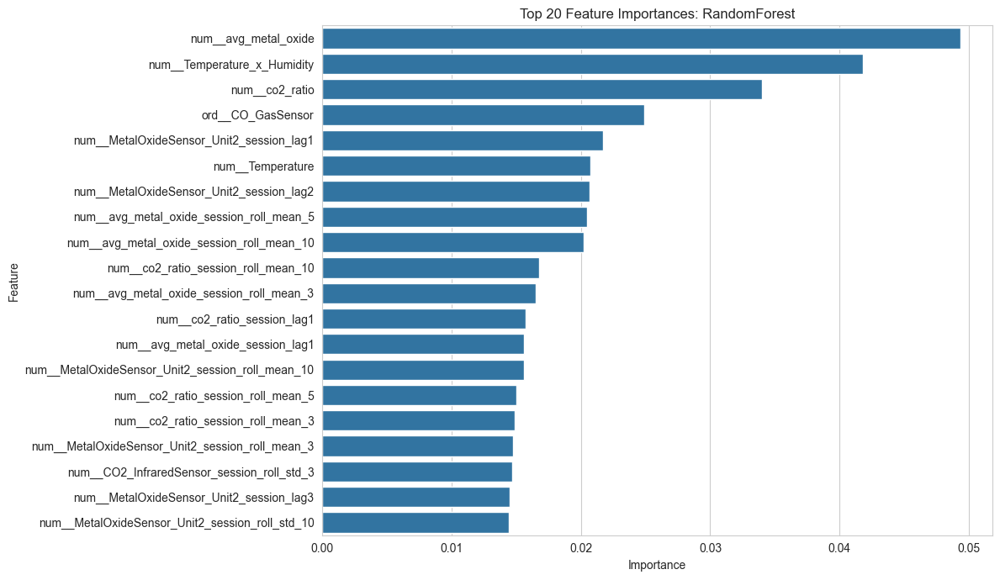


Feature Importance Analysis: DecisionTree


,feature,importance
0,num__avg_metal_oxide,0.414909
1,num__Temperature_x_Humidity,0.118509
2,ord__CO_GasSensor,0.105779
3,num__co2_ratio,0.088720
4,cat__HVAC_prev_session_heating_active,0.040932
5,num__MetalOxideSensor_Unit2_session_lag1,0.018472
6,num__MetalOxideSensor_Unit1_session_roll_std_3,0.014610
7,num__CO2_InfraredSensor_session_lag3,0.011667
8,num__MetalOxideSensor_Unit2_session_lag2,0.009411
9,num__Temperature,0.008264


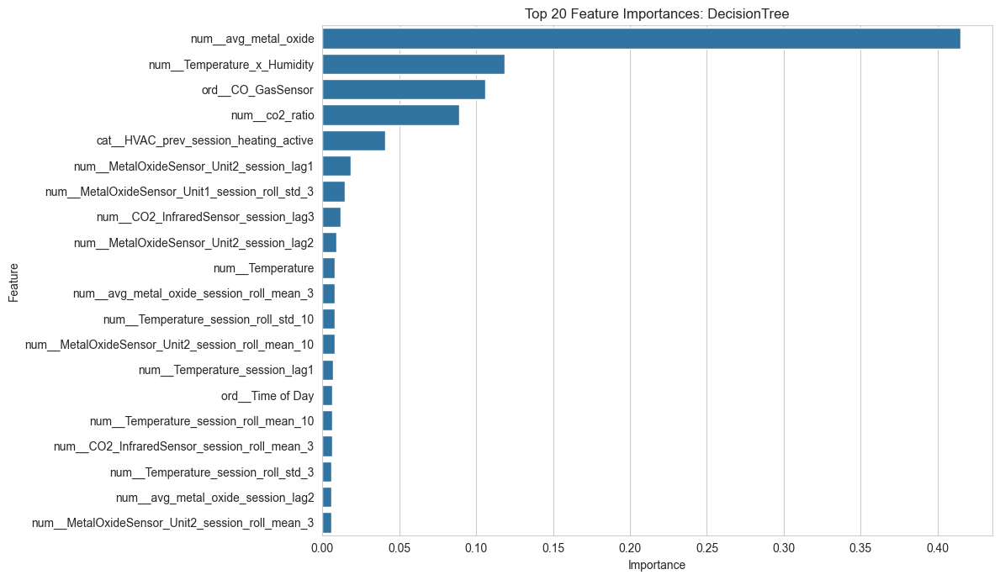


Feature Importance Analysis: XGBoost


,feature,importance
0,num__avg_metal_oxide,0.074791
1,cat__HVAC_prev_session_heating_active,0.047962
2,cat__HVAC_prev_session_ventilation_only,0.044853
3,cat__HVAC_prev_session_off,0.044513
4,cat__HVAC_prev_session_maintenance_mode,0.043256
5,cat__HVAC_prev_session_eco_mode,0.042228
6,ord__CO_GasSensor,0.041869
7,num__Temperature_x_Humidity,0.040494
8,num__co2_ratio,0.030037
9,ord__Temperature_Band,0.021770


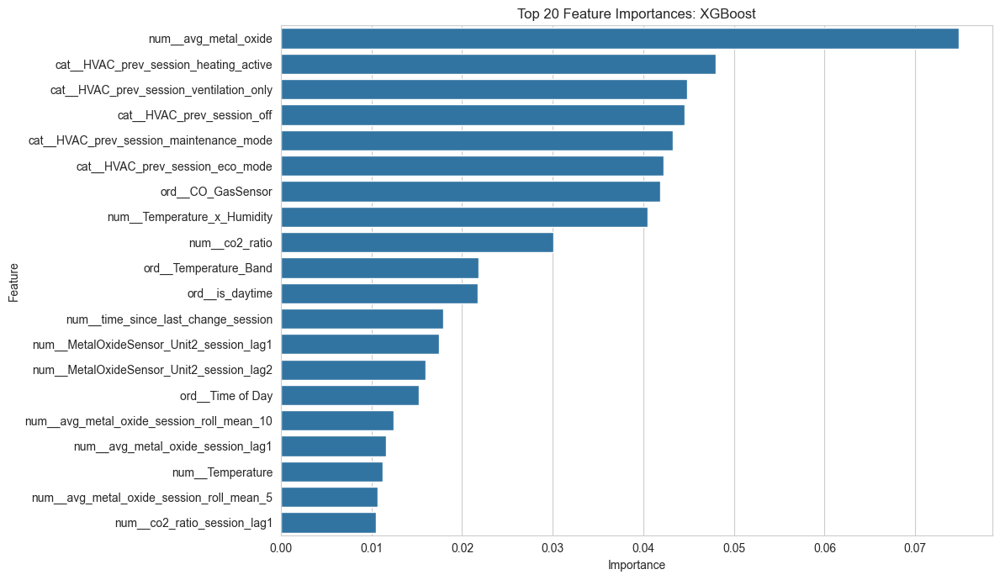


Feature Importance Analysis: LightGBM


,feature,importance
0,num__avg_metal_oxide,820
1,num__co2_ratio,774
2,num__Temperature_x_Humidity,723
3,num__MetalOxideSensor_Unit2_session_roll_std_3,543
4,num__MetalOxideSensor_Unit2_session_roll_std_10,542
5,num__Temperature_session_roll_std_3,517
6,num__Temperature_session_roll_std_10,510
7,num__MetalOxideSensor_Unit1_session_roll_std_10,505
8,num__Temperature,501
9,num__co2_ratio_session_roll_std_3,496


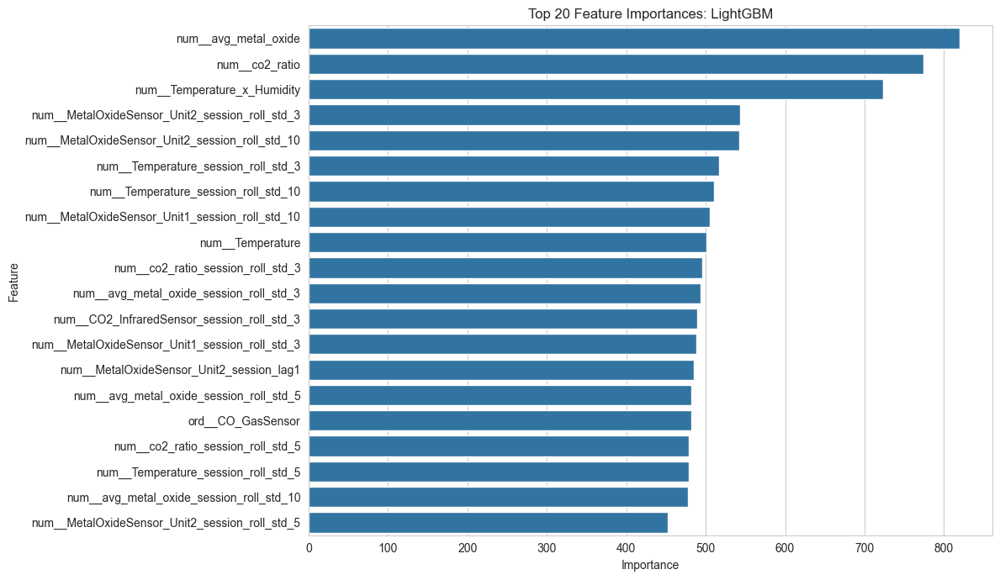


Feature Importance Analysis: CatBoost


,feature,importance
0,cat__HVAC_prev_session_maintenance_mode,10.447723
1,num__avg_metal_oxide,9.156285
2,cat__HVAC_prev_session_heating_active,8.824693
3,ord__CO_GasSensor,8.243679
4,cat__HVAC_prev_session_eco_mode,8.144507
5,cat__HVAC_prev_session_off,7.195687
6,cat__HVAC_prev_session_ventilation_only,6.493430
7,num__Temperature_x_Humidity,5.248058
8,num__co2_ratio,4.410393
9,num__time_since_last_change_session,3.486011


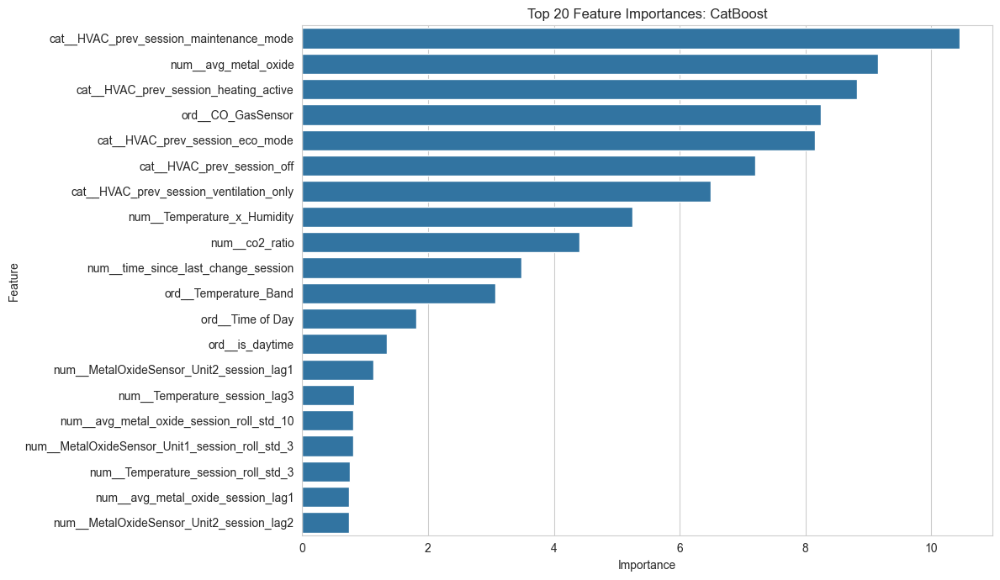


Logistic Regression Coefficient Analysis

Top 15 features by mean absolute coefficient:


,feature,mean_abs_coefficient
0,num__avg_metal_oxide_session_roll_mean_5,0.467776
1,num__co2_ratio_session_roll_mean_10,0.412257
2,num__MetalOxideSensor_Unit1_session_roll_mean_5,0.321563
3,num__CO2_InfraredSensor_session_roll_mean_10,0.268694
4,num__avg_metal_oxide,0.192081
5,num__MetalOxideSensor_Unit1_session_roll_std_10,0.186185
6,num__co2_ratio_session_roll_mean_5,0.180093
7,num__Temperature,0.171467
8,ord__CO_GasSensor,0.122610
9,num__co2_ratio,0.119125


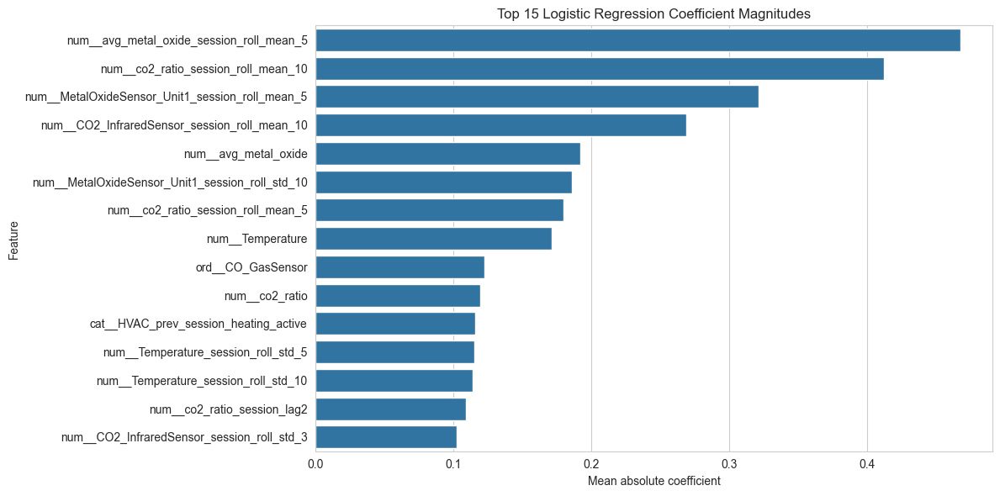


Top 15 Logistic Regression coefficients for class 'High Activity':


,feature,coefficient
0,num__avg_metal_oxide_session_roll_mean_5,0.701664
1,num__co2_ratio_session_roll_mean_10,-0.618386
2,num__MetalOxideSensor_Unit1_session_roll_mean_5,-0.482344
3,num__CO2_InfraredSensor_session_roll_mean_10,0.403041
4,num__co2_ratio_session_roll_mean_5,0.270140
5,num__Temperature,-0.257201
6,cat__HVAC_prev_session_heating_active,-0.173626
7,num__Temperature_session_roll_std_5,0.172803
8,num__CO2_InfraredSensor_session_roll_std_3,0.153220
9,num__Temperature_session_roll_std_10,-0.132381


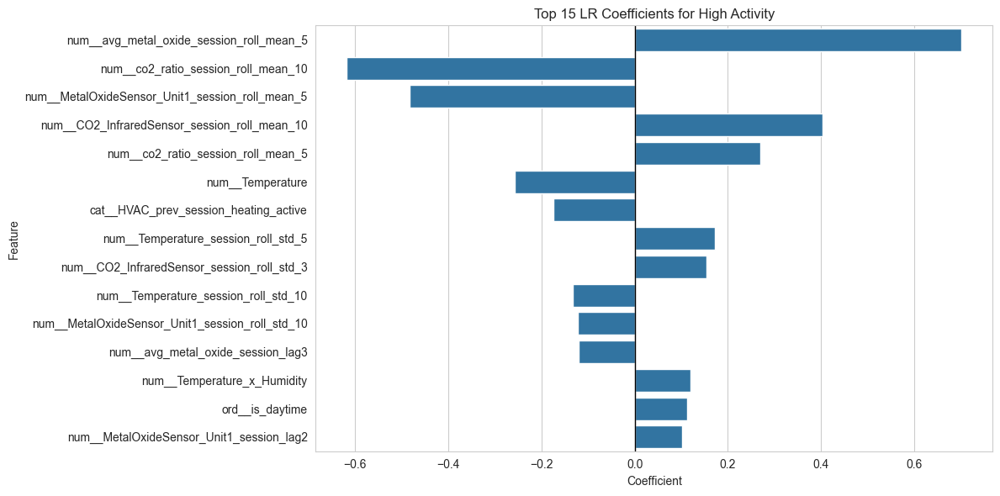


Top 15 Logistic Regression coefficients for class 'Low Activity':


,feature,coefficient
0,num__avg_metal_oxide_session_roll_mean_5,-0.338277
1,num__MetalOxideSensor_Unit1_session_roll_std_10,0.279278
2,num__avg_metal_oxide,-0.256209
3,num__MetalOxideSensor_Unit1_session_roll_mean_5,0.213438
4,num__Temperature,0.185869
5,ord__CO_GasSensor,0.183915
6,num__co2_ratio_session_roll_mean_10,0.168840
7,num__CO2_InfraredSensor_session_roll_mean_10,-0.155477
8,num__co2_ratio_session_lag1,0.150234
9,num__co2_ratio_session_roll_mean_5,-0.143382


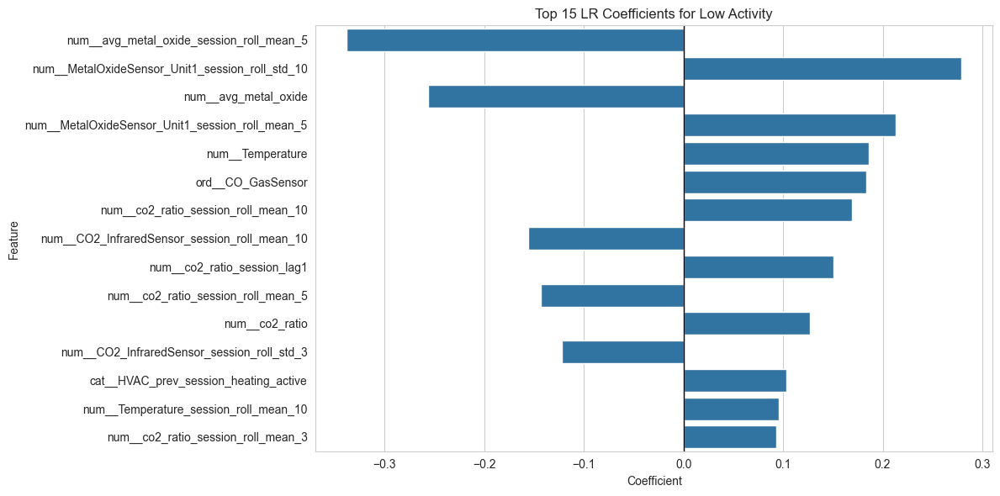


Top 15 Logistic Regression coefficients for class 'Moderate Activity':


,feature,coefficient
0,num__co2_ratio_session_roll_mean_10,0.449546
1,num__avg_metal_oxide_session_roll_mean_5,-0.363386
2,num__avg_metal_oxide,0.288122
3,num__MetalOxideSensor_Unit1_session_roll_mean_5,0.268906
4,num__CO2_InfraredSensor_session_roll_mean_10,-0.247564
5,num__co2_ratio,-0.178688
6,num__Temperature_session_roll_std_10,0.170710
7,num__co2_ratio_session_lag2,-0.163753
8,num__MetalOxideSensor_Unit1_session_roll_std_10,-0.157350
9,ord__CO_GasSensor,-0.151700


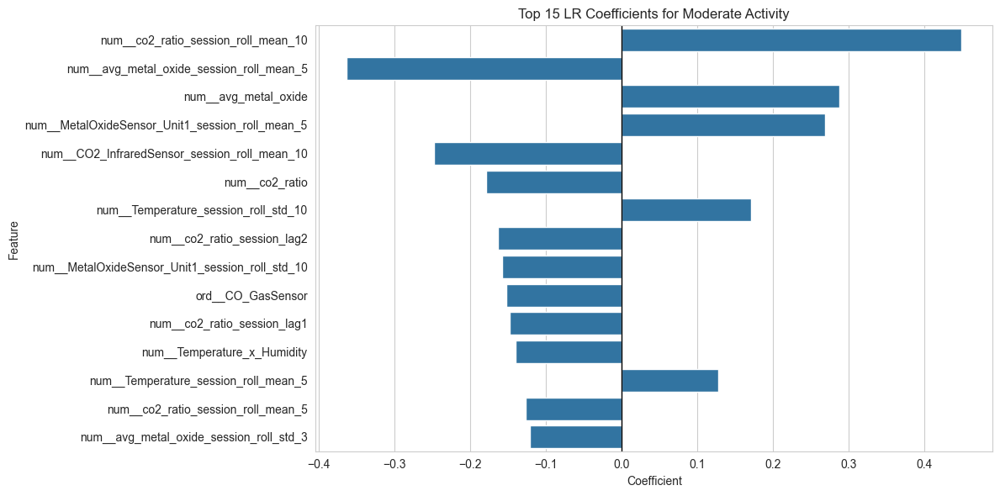


Logistic Regression Coefficient Analysis

Top 15 features by mean absolute coefficient:


,feature,mean_abs_coefficient
0,num__avg_metal_oxide_session_roll_mean_5,0.418387
1,num__co2_ratio_session_roll_mean_10,0.404577
2,num__MetalOxideSensor_Unit1_session_roll_mean_5,0.290359
3,num__CO2_InfraredSensor_session_roll_mean_10,0.265703
4,num__avg_metal_oxide,0.192056
5,num__co2_ratio_session_roll_mean_5,0.185526
6,num__MetalOxideSensor_Unit1_session_roll_std_10,0.183897
7,num__Temperature,0.168512
8,ord__CO_GasSensor,0.122648
9,num__co2_ratio,0.118790


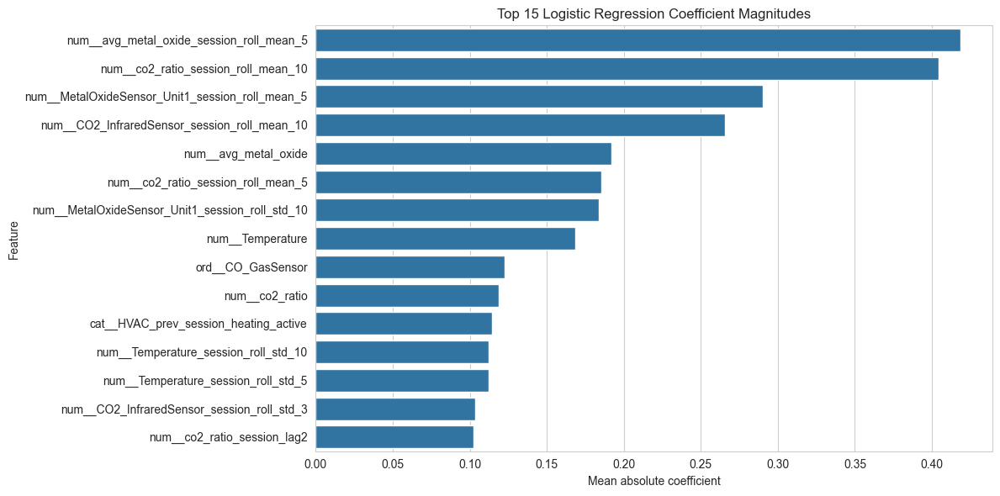


Top 15 Logistic Regression coefficients for class 'High Activity':


,feature,coefficient
0,num__avg_metal_oxide_session_roll_mean_5,0.627581
1,num__co2_ratio_session_roll_mean_10,-0.606866
2,num__MetalOxideSensor_Unit1_session_roll_mean_5,-0.435539
3,num__CO2_InfraredSensor_session_roll_mean_10,0.398554
4,num__co2_ratio_session_roll_mean_5,0.278289
5,num__Temperature,-0.252768
6,cat__HVAC_prev_session_heating_active,-0.171381
7,num__Temperature_session_roll_std_5,0.168451
8,num__CO2_InfraredSensor_session_roll_std_3,0.155323
9,num__Temperature_session_roll_std_10,-0.129732


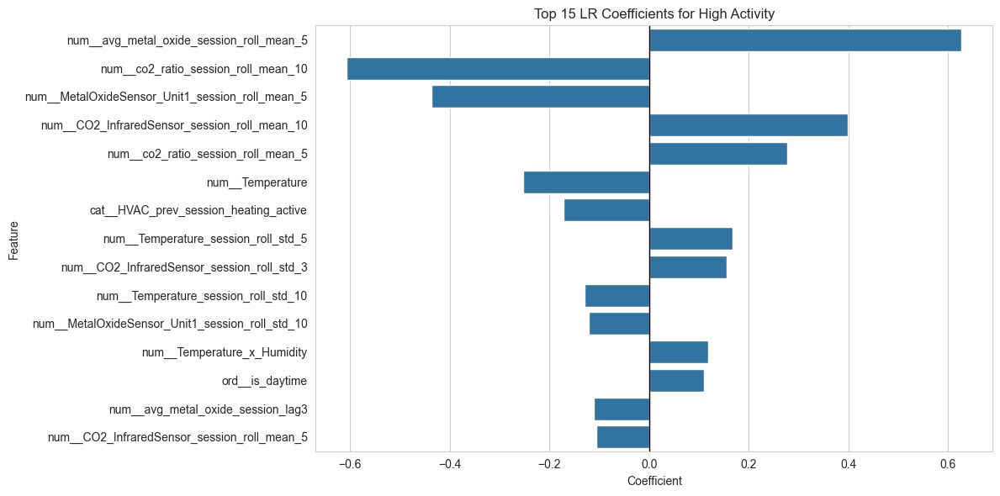


Top 15 Logistic Regression coefficients for class 'Low Activity':


,feature,coefficient
0,num__avg_metal_oxide_session_roll_mean_5,-0.313134
1,num__MetalOxideSensor_Unit1_session_roll_std_10,0.275846
2,num__avg_metal_oxide,-0.255406
3,num__MetalOxideSensor_Unit1_session_roll_mean_5,0.190285
4,num__Temperature,0.185965
5,ord__CO_GasSensor,0.183972
6,num__co2_ratio_session_roll_mean_10,0.170537
7,num__CO2_InfraredSensor_session_roll_mean_10,-0.157665
8,num__co2_ratio_session_lag1,0.147556
9,num__co2_ratio_session_roll_mean_5,-0.143254


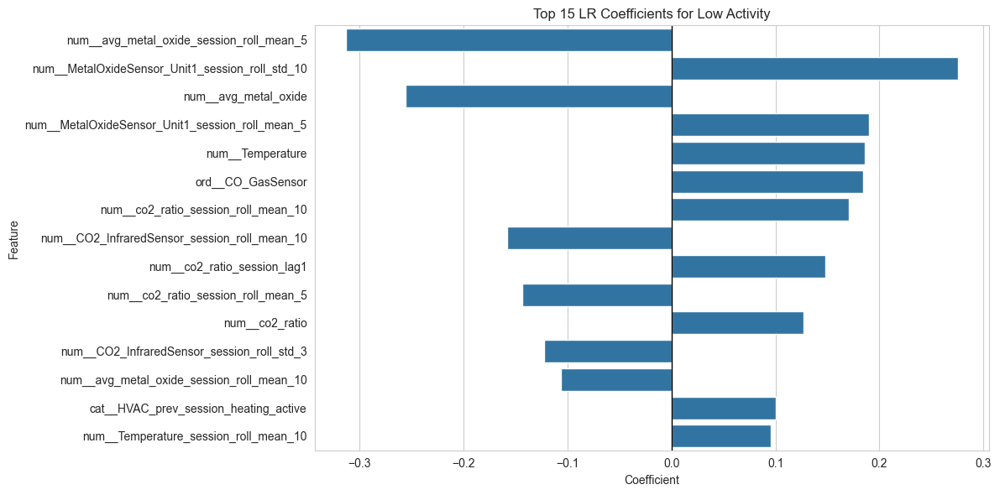


Top 15 Logistic Regression coefficients for class 'Moderate Activity':


,feature,coefficient
0,num__co2_ratio_session_roll_mean_10,0.436329
1,num__avg_metal_oxide_session_roll_mean_5,-0.314447
2,num__avg_metal_oxide,0.288083
3,num__MetalOxideSensor_Unit1_session_roll_mean_5,0.245253
4,num__CO2_InfraredSensor_session_roll_mean_10,-0.240889
5,num__co2_ratio,-0.178186
6,num__Temperature_session_roll_std_10,0.168461
7,num__MetalOxideSensor_Unit1_session_roll_std_10,-0.155619
8,num__co2_ratio_session_lag2,-0.153658
9,ord__CO_GasSensor,-0.150360


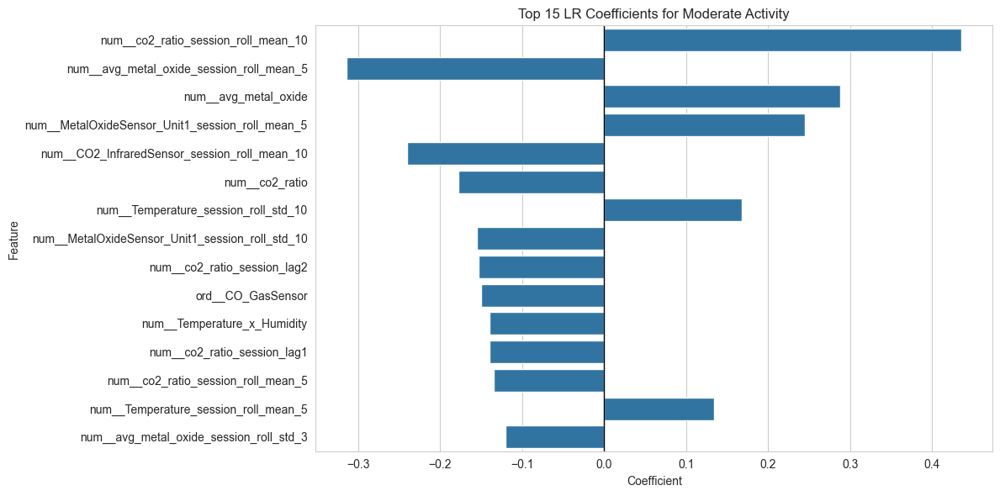


Feature Importance Analysis: XGBoost Tuned


,feature,importance
0,num__avg_metal_oxide,0.088340
1,cat__HVAC_prev_session_maintenance_mode,0.048049
2,cat__HVAC_prev_session_off,0.047433
3,num__Temperature_x_Humidity,0.046870
4,cat__HVAC_prev_session_ventilation_only,0.044862
5,cat__HVAC_prev_session_heating_active,0.043942
6,num__MetalOxideSensor_Unit2_session_lag2,0.041591
7,ord__CO_GasSensor,0.039843
8,cat__HVAC_prev_session_eco_mode,0.038549
9,num__co2_ratio,0.037770


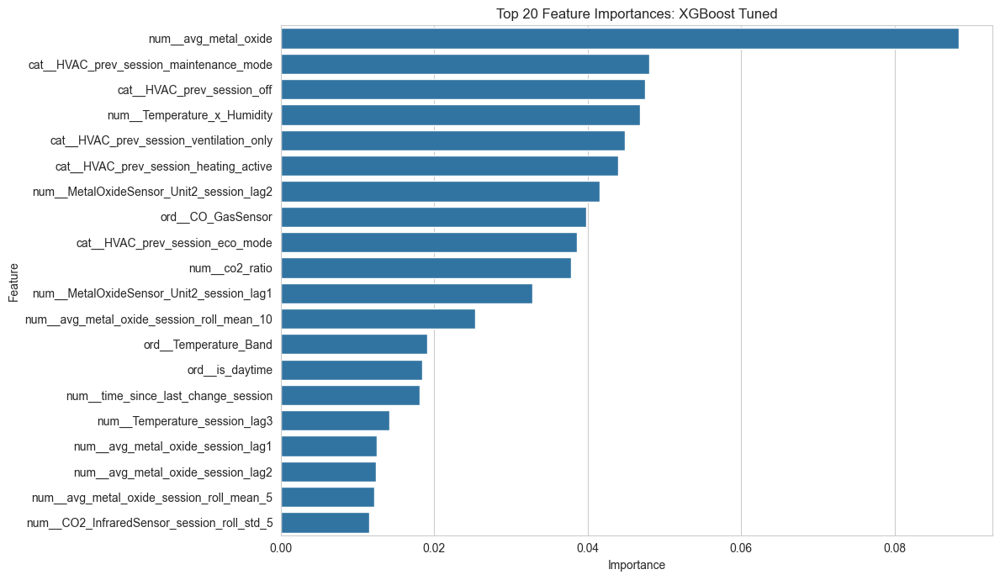


Feature Importance Analysis: CatBoost Tuned


,feature,importance
0,num__avg_metal_oxide,11.783775
1,ord__CO_GasSensor,9.068712
2,num__co2_ratio,8.315145
3,num__Temperature_x_Humidity,6.475612
4,cat__HVAC_prev_session_heating_active,6.322590
5,cat__HVAC_prev_session_maintenance_mode,5.645870
6,cat__HVAC_prev_session_ventilation_only,5.079290
7,cat__HVAC_prev_session_off,4.873093
8,cat__HVAC_prev_session_eco_mode,4.551649
9,ord__Temperature_Band,3.540803


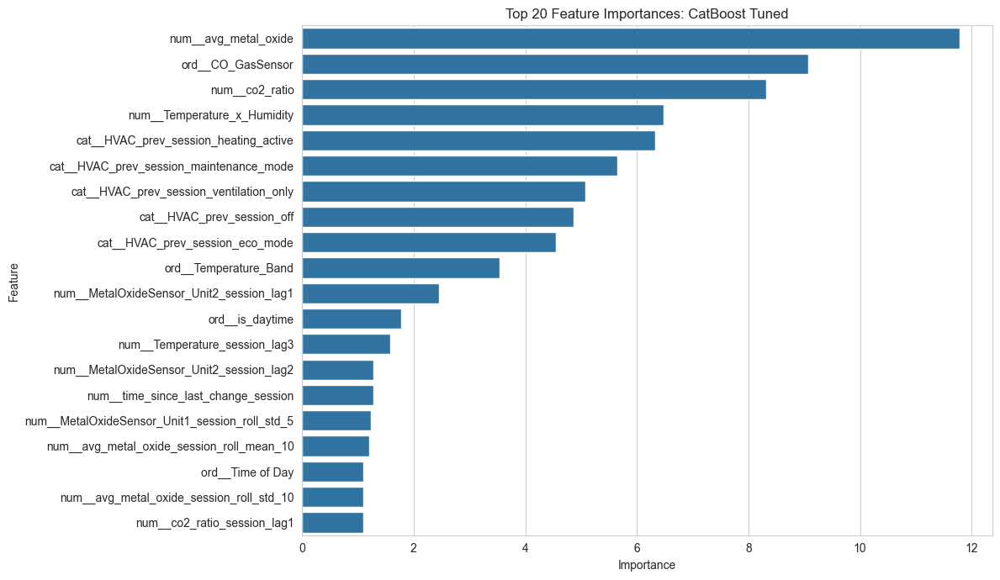

In [73]:
# =============================================================================
# Feature Importance and Logistic Regression Coefficient Analysis
# =============================================================================

from sklearn.exceptions import NotFittedError


def _get_model_step(fitted_pipeline):
    """Return the estimator step from either current or older pipeline naming."""
    if 'model' in fitted_pipeline.named_steps:
        return fitted_pipeline.named_steps['model']
    if 'classifier' in fitted_pipeline.named_steps:
        return fitted_pipeline.named_steps['classifier']
    raise KeyError("Pipeline must contain either a 'model' or 'classifier' step.")


def _ensure_pipeline_is_fitted(pipeline_name, fitted_pipeline):
    """Fit a pipeline only if feature names/model attributes are not available yet."""
    try:
        fitted_pipeline.named_steps['preprocessor'].get_feature_names_out()
        return fitted_pipeline
    except Exception:
        print(f"{pipeline_name} pipeline is not fitted yet. Fitting now...")
        if pipeline_name == 'XGBoost':
            fitted_pipeline.fit(X_train, y_train_encoded)
        else:
            fitted_pipeline.fit(X_train, y_train)
        return fitted_pipeline


def _get_feature_names(fitted_pipeline):
    return fitted_pipeline.named_steps['preprocessor'].get_feature_names_out()


def _get_feature_importances(model):
    if hasattr(model, 'feature_importances_'):
        return model.feature_importances_
    if hasattr(model, 'get_feature_importance'):
        return model.get_feature_importance()
    return None


def analyze_tree_feature_importance(pipeline_name, fitted_pipeline, top_n=20):
    fitted_pipeline = _ensure_pipeline_is_fitted(pipeline_name, fitted_pipeline)
    model = _get_model_step(fitted_pipeline)
    feature_names = _get_feature_names(fitted_pipeline)
    importances = _get_feature_importances(model)

    print("\n" + "=" * 70)
    print(f"Feature Importance Analysis: {pipeline_name}")
    print("=" * 70)

    if importances is None:
        print(f"{pipeline_name} does not expose feature importances.")
        return None

    importance_df = (
        pd.DataFrame({'feature': feature_names, 'importance': importances})
        .sort_values('importance', ascending=False)
        .reset_index(drop=True)
    )

    display(importance_df.head(top_n))

    plt.figure(figsize=(12, max(6, top_n * 0.35)))
    sns.barplot(data=importance_df.head(top_n), x='importance', y='feature')
    plt.title(f'Top {top_n} Feature Importances: {pipeline_name}')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()

    return importance_df


def analyze_logistic_regression_coefficients(fitted_pipeline, top_n=15):
    fitted_pipeline = _ensure_pipeline_is_fitted('LogisticRegression', fitted_pipeline)
    model = _get_model_step(fitted_pipeline)
    feature_names = _get_feature_names(fitted_pipeline)

    print("\n" + "=" * 70)
    print("Logistic Regression Coefficient Analysis")
    print("=" * 70)

    if not hasattr(model, 'coef_'):
        print("Logistic Regression model does not expose coef_.")
        return None, None

    coef = model.coef_
    class_labels = list(getattr(model, 'classes_', activity_level_order))

    # Overall coefficient magnitude across classes.
    lr_overall_df = (
        pd.DataFrame({
            'feature': feature_names,
            'mean_abs_coefficient': np.mean(np.abs(coef), axis=0)
        })
        .sort_values('mean_abs_coefficient', ascending=False)
        .reset_index(drop=True)
    )

    print(f"\nTop {top_n} features by mean absolute coefficient:")
    display(lr_overall_df.head(top_n))

    plt.figure(figsize=(12, max(6, top_n * 0.35)))
    sns.barplot(data=lr_overall_df.head(top_n), x='mean_abs_coefficient', y='feature')
    plt.title(f'Top {top_n} Logistic Regression Coefficient Magnitudes')
    plt.xlabel('Mean absolute coefficient')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()

    # Per-class positive/negative drivers.
    per_class_rows = []
    for class_idx, class_label in enumerate(class_labels):
        class_coef_df = (
            pd.DataFrame({
                'feature': feature_names,
                'coefficient': coef[class_idx]
            })
            .assign(abs_coefficient=lambda d: d['coefficient'].abs())
            .sort_values('abs_coefficient', ascending=False)
            .reset_index(drop=True)
        )
        class_coef_df.insert(0, 'class', class_label)
        per_class_rows.append(class_coef_df)

        print(f"\nTop {top_n} Logistic Regression coefficients for class '{class_label}':")
        display(class_coef_df[['feature', 'coefficient']].head(top_n))

        plt.figure(figsize=(12, max(6, top_n * 0.35)))
        plot_df = class_coef_df.head(top_n).copy()
        sns.barplot(data=plot_df, x='coefficient', y='feature')
        plt.axvline(0, color='black', linewidth=1)
        plt.title(f'Top {top_n} LR Coefficients for {class_label}')
        plt.xlabel('Coefficient')
        plt.ylabel('Feature')
        plt.tight_layout()
        plt.show()

    lr_per_class_df = pd.concat(per_class_rows, ignore_index=True)
    return lr_overall_df, lr_per_class_df


# Analyze fitted baseline pipelines. These names come from Cell-60.
feature_importance_tables = {}
for model_name in ['RandomForest', 'DecisionTree', 'XGBoost', 'LightGBM', 'CatBoost']:
    if 'pipelines' in globals() and model_name in pipelines:
        feature_importance_tables[model_name] = analyze_tree_feature_importance(model_name, pipelines[model_name], top_n=20)
    else:
        print(f"Skipping {model_name}: pipelines['{model_name}'] is not available.")

if 'pipelines' in globals() and 'LogisticRegression' in pipelines:
    lr_overall_coefficients_df, lr_per_class_coefficients_df = analyze_logistic_regression_coefficients(
        pipelines['LogisticRegression'],
        top_n=15
    )
else:
    print("Skipping Logistic Regression coefficients: pipelines['LogisticRegression'] is not available.")

# Optional: analyze tuned estimators too, if the tuning cell has been run.
tuned_estimators = {
    'LogisticRegression Tuned': globals().get('logreg_search', None),
    'XGBoost Tuned': globals().get('xgb_search', None),
    'CatBoost Tuned': globals().get('cat_search', None),
}

for tuned_name, search_obj in tuned_estimators.items():
    if search_obj is None or not hasattr(search_obj, 'best_estimator_'):
        continue
    best_pipeline = search_obj.best_estimator_
    if 'LogisticRegression' in tuned_name:
        tuned_lr_overall_coefficients_df, tuned_lr_per_class_coefficients_df = analyze_logistic_regression_coefficients(
            best_pipeline,
            top_n=15
        )
    else:
        feature_importance_tables[tuned_name] = analyze_tree_feature_importance(tuned_name, best_pipeline, top_n=20)
